In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
import qnorm
import pickle

In [2]:
cells = pd.read_csv('/project/deeprna/data/all_cell_types.csv', index_col=0)
cells.head()

,tissue_name,dataset,total_tracks,summary,has_rna,has_dnase_or_atac,histone_marks,ctcf,cage_rampage,wgbs,GET_id
tissue_id,,,,,,,,,,,
0,Homo sapiens A172,encode,3,3.0,1.0,1.0,0.0,0.0,1.0,0.0,NaN
1,Homo sapiens A375,encode,2,2.0,1.0,0.0,0.0,0.0,1.0,0.0,NaN
2,Homo sapiens A549,encode,10,19.0,1.0,1.0,5.0,1.0,1.0,1.0,NaN
3,Homo sapiens A549 treated with 100 nM dexameth...,encode,7,7.0,1.0,1.0,5.0,0.0,0.0,0.0,NaN
4,Homo sapiens A549 treated with 100 nM dexameth...,encode,10,15.0,1.0,1.0,8.0,0.0,0.0,0.0,NaN


In [3]:
genes_df = pd.read_csv('/project/deeprna/data/Homo_sapiens.gene_info.tsv', sep='\t')
coding_genes = genes_df.loc[genes_df.type_of_gene == 'protein-coding']

## Cross-cell

In [7]:
## Cross-cell
encode = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_celltype2/all_expressions_encode.csv', index_col=0, header='infer')
grt = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_celltype2/all_expressions_grt.csv', index_col=0, header='infer')

encode = encode.loc[encode.index.isin(coding_genes.Symbol)]
grt = grt.loc[grt.index.isin(coding_genes.Symbol)]

cors = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_celltype2/all_correlations.csv', header='infer')
cors[['pearson','log_pearson','spearman']].mean(axis=0)

pearson        0.851000
log_pearson    0.859294
spearman       0.873265
dtype: float64

['ADAD1', 'ADGRG4', 'AGTR2', 'AMBN', 'ANXA8', 'APOL4', 'AREG', 'ASIC5', 'ATP1B4', 'ATP5MGL', 'BPIFC', 'C4orf17', 'CACNG2', 'CARTPT', 'CBLN2', 'CCDC42', 'CD300LG', 'CD40LG', 'CEACAM20', 'CEACAM5', 'CEACAM6', 'CFAP299', 'CLDN2', 'CSAG1', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT55', 'CXCL8', 'CXCL9', 'EMCN', 'ENAM', 'ENTHD1', 'EPGN', 'FAM25G', 'FGA', 'FGB', 'FOXD4L3', 'FXYD3', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GASK1B', 'GDF2', 'GGTLC2', 'GPR119', 'GUCY1A1', 'HOPX', 'IL13RA2', 'IRGC', 'ISX', 'JCHAIN', 'KRT12', 'KRT13', 'KRT16', 'KRT23', 'KRT24', 'KRT31', 'KRT33B', 'KRT34', 'KRT40', 'LILRB2', 'LILRB4', 'MAGEA11', 'MAGEC1', 'MAGEC2', 'MB', 'MMRN1', 'MYH13', 'MYH4', 'MYH8', 'MYL12BP2', 'NEUROD2', 'NLRP13', 'NLRP8', 'NLRP9', 'NR2F1', 'NXF3', 'OTP', 'PAGE4', 'PAGE5', 'PDHA2', 'PEG3', 'PPDPFL', 'PRKACG', 'PTGIR', 'RCVRN', 'RIPPLY1', 'S100Z', 

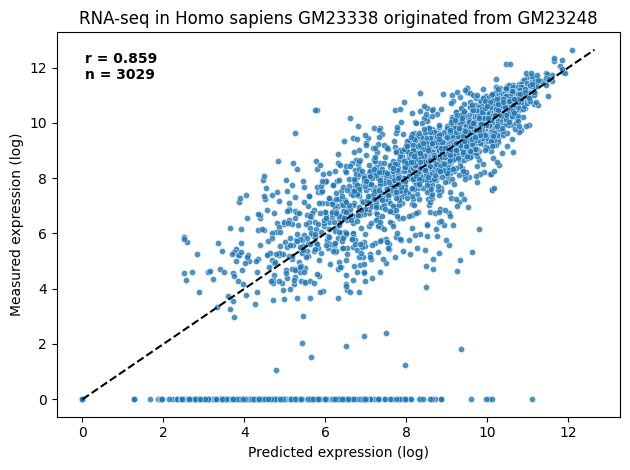

['ADGRG4', 'ADH1C', 'AGTR2', 'C4orf17', 'CD40LG', 'CFAP299', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'FFAR2', 'FOXD4L3', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2E', 'GYPE', 'IGLL1', 'KRT20', 'KRT24', 'MAGEA11', 'MAGEC2', 'MUC7', 'MYL12BP2', 'NLRP5', 'PSG1', 'PSG11', 'PSG5', 'PSG6', 'PSG7', 'PSG8', 'PSG9', 'SIGLEC5', 'SSX2', 'SSX2B', 'TBC1D3', 'TEX28', 'TFDP3', 'TMPRSS11B', 'UGT2A3', 'VGLL1', 'ZNF727']


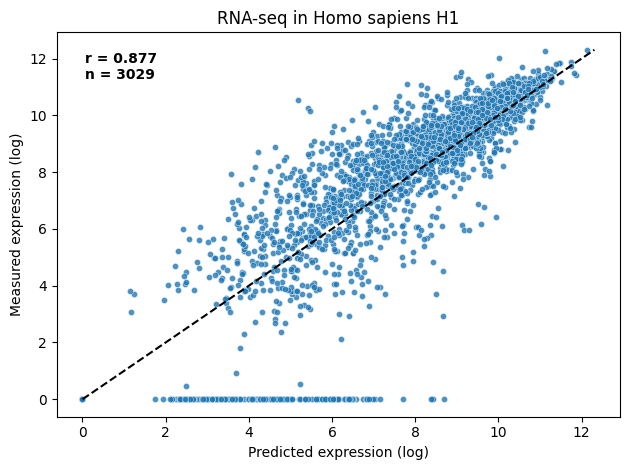

['ADAD1', 'ADGRG4', 'ADH1C', 'ADH7', 'AGTR2', 'AMBN', 'ANXA10', 'ASB5', 'BPIFC', 'C4orf17', 'C4orf54', 'CABP5', 'CACNG2', 'CCDC42', 'CD33', 'CEACAM20', 'CEACAM5', 'CEACAM6', 'CEACAM8', 'CFAP299', 'CLDN2', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT55', 'CXCL13', 'CXCL8', 'CXCL9', 'DAPP1', 'DNAAF6', 'ENAM', 'ENTHD1', 'FAM156B', 'FFAR3', 'FGA', 'FGF5', 'FPR1', 'FPR2', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GARIN5B', 'GATA1', 'GDF2', 'GGTLC2', 'GLP2R', 'GPR119', 'GPR32', 'GRIA2', 'GUCY1A1', 'GYPA', 'GYPB', 'GYPE', 'HSFX2', 'IGFL2', 'IGLL1', 'IGLL5', 'IL13RA2', 'ISX', 'JCHAIN', 'KRT12', 'KRT13', 'KRT16', 'KRT24', 'KRT34', 'LILRA1', 'LILRA2', 'LILRA5', 'LILRB1', 'LILRB2', 'LILRB4', 'MAGEA10', 'MAGEA11', 'MAGEA3', 'MAGEA6', 'MAGEC2', 'MYH13', 'MYH4', 'MYL12BP2', 'NAA11', 'NLRP4', 'NLRP5', 'NLRP8', 'NR2F1', 'NXF2', 'NXF3', 'ODAM', 'PAGE5', 'PDHA2', 'PGM5'

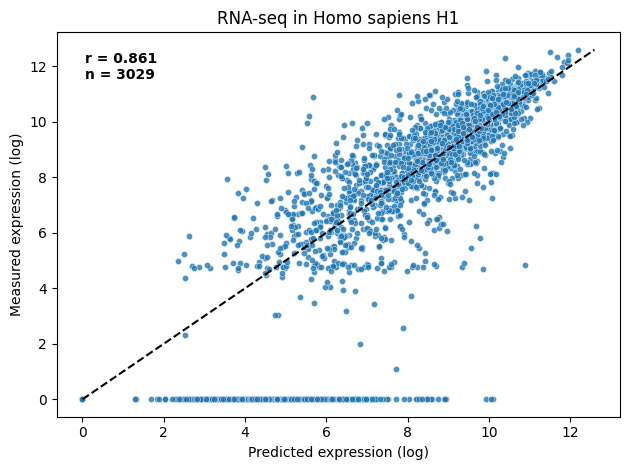

['ADGRG4', 'ADH1C', 'ADH7', 'ALOX15B', 'ALOXE3', 'AMBN', 'APOL4', 'APOL5', 'AREG', 'ATP2B3', 'BHLHA9', 'BHMT2', 'BPIFC', 'C4orf17', 'C4orf54', 'CBLN2', 'CCDC158', 'CCDC42', 'CEACAM21', 'CEACAM6', 'CFAP299', 'CLEC10A', 'CSAG1', 'CSF2RB', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47A12', 'CT47B1', 'CXCL13', 'CXCL2', 'CXCL8', 'CXCL9', 'CYTH4', 'DAPP1', 'DMRTC2', 'DNAAF6', 'DSPP', 'EMCN', 'ENAM', 'ENTHD1', 'EPGN', 'EREG', 'FABP2', 'FAM81B', 'FBXO39', 'FBXO47', 'FCAR', 'FFAR1', 'FFAR3', 'FGA', 'FGB', 'FGF5', 'FGG', 'FPR1', 'FPR2', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GATA1', 'GDF10', 'GDF2', 'GGT6', 'GGTLC2', 'GLP2R', 'GPR119', 'GPR17', 'GRIA2', 'GSDMA', 'GYPA', 'GYPE', 'HAND2', 'HIPK4', 'HOPX', 'IL13RA2', 'IRGC', 'ITIH6', 'JCHAIN', 'KCNA7', 'KIAA1210', 'KLK12', 'KLK14', 'KLK4', 'KRT12', 'KRT14', 'KRT16', 'KRT20', 'KRT23', 'KRT24', 'KRT31', 'KRT33B', 'KRT36', '

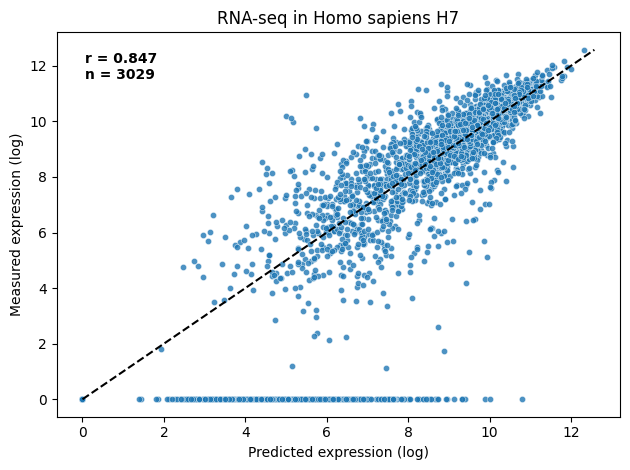

['ADAD1', 'ADGRG4', 'ADH1B', 'ADH1C', 'ADH7', 'AGTR2', 'ANXA10', 'APOL4', 'ATP1B4', 'BHMT2', 'C4orf17', 'CABP5', 'CBLN2', 'CD300LG', 'CD40LG', 'CEACAM20', 'CEACAM21', 'CEACAM6', 'CEACAM7', 'CFAP299', 'CLEC10A', 'CSAG1', 'CSF2RB', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL10', 'CXCL13', 'CXCL9', 'DDTL', 'DNAAF6', 'EMCN', 'ENAM', 'ENTHD1', 'EPGN', 'EPHA5', 'EREG', 'FAM156B', 'FAM25G', 'FFAR1', 'FFAR2', 'FGB', 'FGF5', 'FGG', 'FPR2', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GASK1B', 'GDF2', 'GGTLC2', 'GLP2R', 'GPR119', 'GUCY1A1', 'GYPA', 'GYPB', 'GYPE', 'HAND2', 'HELT', 'HOPX', 'HSD17B13', 'IBSP', 'IGFL2', 'IGLL5', 'IRGC', 'ISX', 'KIAA1210', 'KLK3', 'KRT14', 'KRT16', 'KRT20', 'KRT23', 'KRT24', 'KRT31', 'KRT34', 'KRT36', 'KRT39', 'LILRA1', 'LILRB4', 'MAGEA3', 'MAGEA6', 'MAGEC1', 'MEOX1', 'MUC7', 'MYH4', 'MYL12BP2', 'NAA11', 'NCF4', 'NDST4', '

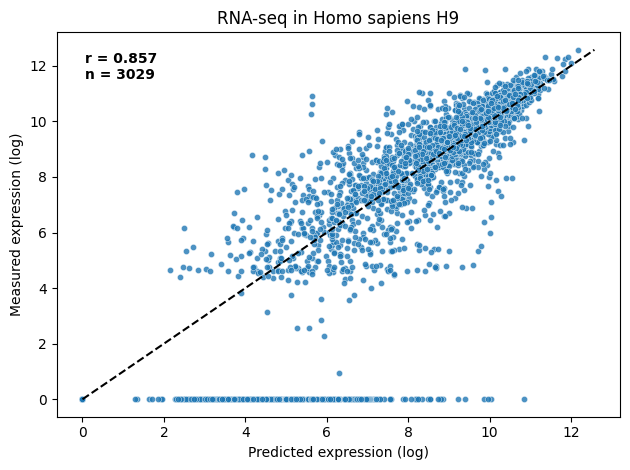

['ADAD1', 'ADGRG4', 'ADH1C', 'ADH7', 'AGTR2', 'AMBN', 'ANXA10', 'APOL5', 'AREG', 'ATP1B4', 'BHLHA9', 'BHMT2', 'BPIFC', 'BRS3', 'C4orf17', 'CABP5', 'CD40LG', 'CEACAM16', 'CEACAM20', 'CEACAM4', 'CFAP299', 'CFI', 'CGB8', 'CLDN2', 'CNGA2', 'CSAG1', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47A1', 'CT47A10', 'CT47A11', 'CT47A12', 'CT47A2', 'CT47A3', 'CT47A4', 'CT47A5', 'CT47A6', 'CT47A7', 'CT47A8', 'CT47A9', 'CT47B1', 'CXCL10', 'CXCL13', 'CXCL8', 'CXCL9', 'DAPP1', 'DHRS7C', 'ENAM', 'ENTHD1', 'EPGN', 'EREG', 'ERICH4', 'ESX1', 'FATE1', 'FCAR', 'FGF5', 'FOXD4L3', 'FPR1', 'FPR3', 'G6PC1', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GDF2', 'GJA8', 'GK2', 'GPR32', 'GSDMA', 'HAMP', 'HELT', 'IBSP', 'IGLL5', 'IRGC', 'JCHAIN', 'KIAA1210', 'KLK12', 'KLK15', 'KLK2', 'KLK3', 'KRT14', 'KRT24', 'KRT27', 'KRT31', 'KRT32', 'KRT33A', 'KRT33B', 'KRT34', 'KRT36', 'KRT38', 'KRT

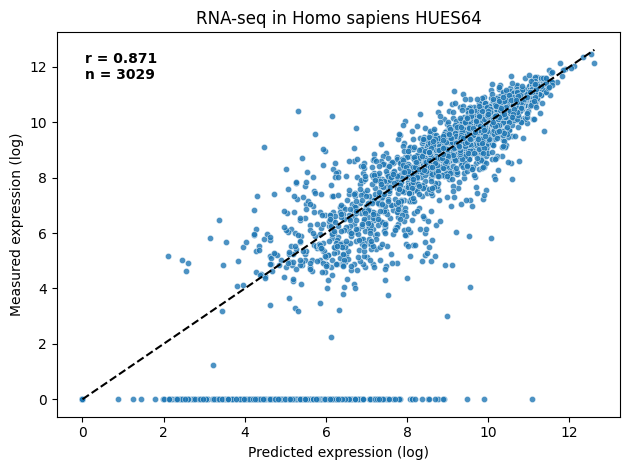

['ADAD1', 'ADAM29', 'ADGRG4', 'ADH1C', 'ADRA1A', 'AGTR2', 'AIPL1', 'AKAP4', 'ALOXE3', 'AMBN', 'AREG', 'ARHGAP36', 'ASB5', 'ASPA', 'BPIFC', 'BTC', 'C4orf17', 'CABP5', 'CACNG2', 'CARTPT', 'CD33', 'CEACAM20', 'CEACAM5', 'CEACAM6', 'CEACAM7', 'CNGA2', 'CSAG1', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47A1', 'CT47A2', 'CT47B1', 'CXCL1', 'CXCL10', 'CXCL2', 'CXCL5', 'CXCL6', 'CXCL8', 'CXCL9', 'DMP1', 'DMRTC2', 'DSPP', 'EREG', 'F11', 'FAM216B', 'FBXO39', 'FBXO47', 'FDCSP', 'FGA', 'G6PC1', 'GABRA3', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GJA8', 'GLP2R', 'GLRA3', 'GSDMA', 'GSX2', 'HMX1', 'IBSP', 'IGLL5', 'IL13RA2', 'IQCM', 'IRGC', 'ISX', 'JCHAIN', 'KLK1', 'KLK3', 'KLK4', 'KLK5', 'KLK7', 'KLK8', 'KRT13', 'KRT14', 'KRT31', 'KRT32', 'KRT36', 'LAIR1', 'LILRA4', 'LILRA5', 'LILRB1', 'LILRB2', 'LILRB4', 'MAGEA10', 'MAGEA12', 'MAGEA3', 'MAGEA6', 'MAGEC1', 'MAGEC2', 'M

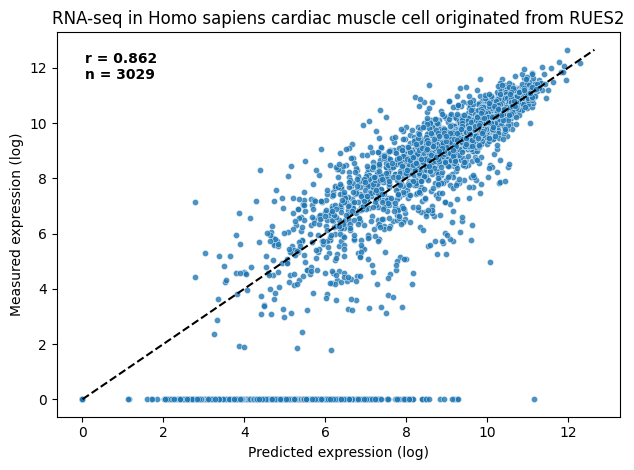

['ADGRG4', 'ADH7', 'ADRA1A', 'AGTR2', 'AIPL1', 'ALAS2', 'AMBN', 'ARHGAP36', 'ARHGEF15', 'ARL5C', 'ATOH1', 'ATP2B3', 'BMP3', 'BRS3', 'C4orf45', 'C4orf54', 'CABP5', 'CACNG6', 'CACNG7', 'CACNG8', 'CCR7', 'CD33', 'CD40LG', 'CEACAM16', 'CEACAM21', 'CEACAM3', 'CEACAM5', 'CEACAM7', 'CEACAM8', 'CHRDL1', 'CLC', 'CLEC10A', 'CNTNAP5', 'CRHBP', 'CSAG1', 'CSF2RB', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT55', 'CT83', 'CXCL13', 'CXCL17', 'CYP2A6', 'DCAF12L1', 'DCAF12L2', 'DCX', 'DGKK', 'DIPK1C', 'DMP1', 'DMRTC2', 'DOK6', 'EMCN', 'ENAM', 'EPHA5', 'ERAS', 'ETNPPL', 'EZHIP', 'FAM216B', 'FBXO47', 'FCAR', 'FFAR1', 'FFAR2', 'FFAR3', 'FGA', 'FGB', 'FGF13', 'FPR2', 'FPR3', 'FRMD7', 'FRMPD3', 'FSTL5', 'G6PC1', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GAL3ST1', 'GDF10', 'GGT5', 'GK3P', 'GLRA3', 'GNA14', 'GPM6A', 'GPR101', 'GPR50', 'GPRIN3', 'GRIA3', 'GRID2', 'GSX2

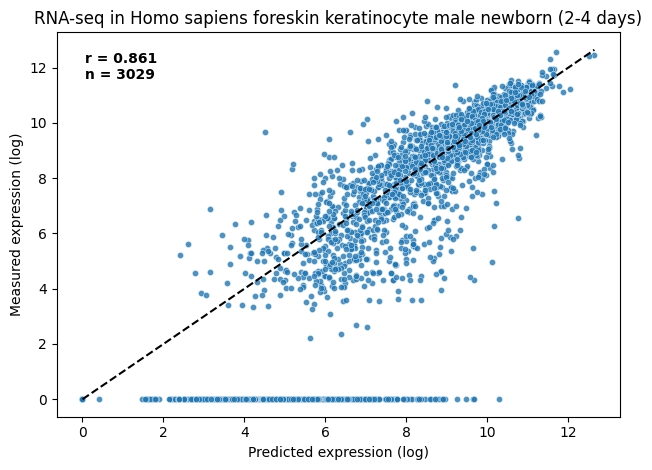

['ACOT12', 'ADAD1', 'ADH1C', 'ADRA1A', 'AGTR2', 'AIPL1', 'ALB', 'ALOX15', 'AMBN', 'ARHGAP36', 'ARHGEF15', 'ATOH1', 'ATP1B2', 'BMP3', 'C4orf54', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CBLN2', 'CCDC160', 'CD300LG', 'CD33', 'CD40LG', 'CEACAM16', 'CEACAM21', 'CEACAM3', 'CEACAM5', 'CEACAM7', 'CHRDL1', 'CLEC10A', 'CNTNAP5', 'CRHBP', 'CRHR1', 'CSF2RB', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT55', 'CT83', 'CXCL13', 'CYP2A6', 'DCAF12L1', 'DCAF12L2', 'DCX', 'DGKK', 'DIPK1C', 'DNAAF6', 'DOC2B', 'ETNPPL', 'EZHIP', 'FAM133A', 'FAM216B', 'FFAR2', 'FFAR3', 'FGA', 'FGB', 'FGF13', 'FGG', 'FPR3', 'FRMPD3', 'FSTL5', 'G6PC1', 'GABRA3', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GDF10', 'GGT5', 'GLP2R', 'GLRA3', 'GPM6A', 'GPR17', 'GRIA3', 'GRID2', 'GUCY2F', 'GYPE', 'HAPLN1', 'HMX1', 'HORMAD2', 'HPN', 'HTR2C', 'IBSP', 'IGFL4', 'IGLL5', 'IGSF1'

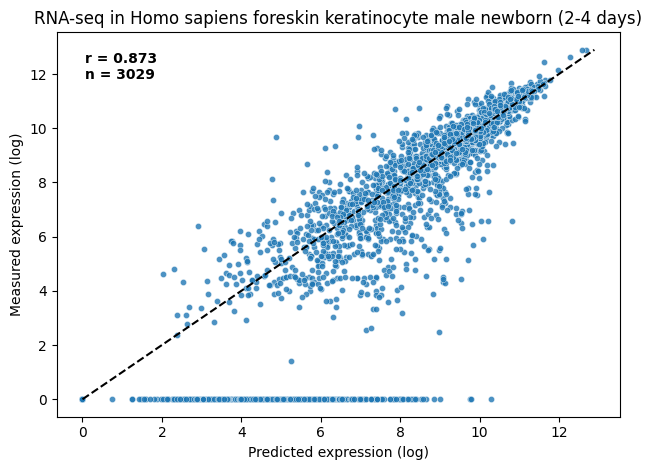

['ADH1B', 'ADH1C', 'AGTR2', 'AIPL1', 'AMBN', 'ANXA10', 'ARHGAP36', 'ASB5', 'ATOH1', 'ATP4A', 'BMP3', 'C4orf45', 'CABP5', 'CACNG6', 'CACNG8', 'CBLN2', 'CD300LG', 'CD33', 'CD40LG', 'CEACAM16', 'CEACAM21', 'CEACAM3', 'CEACAM4', 'CEACAM5', 'CEACAM7', 'CFAP299', 'CFI', 'CHRDL1', 'CLEC10A', 'CNGA2', 'CNTNAP5', 'CRHBP', 'CSN3', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT83', 'CXCL13', 'CYP2B6', 'CYTH4', 'DCAF12L1', 'DCX', 'DGKK', 'DIPK1C', 'DKK2', 'DMP1', 'DMRTC2', 'DNAAF6', 'DRP2', 'ENAM', 'ENPP6', 'EPHA5', 'ERVV-2', 'ETNPPL', 'FFAR3', 'FGA', 'FGB', 'FOXD4L3', 'FPR3', 'FRMD7', 'FSTL5', 'G6PC1', 'GABRA3', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GATA1', 'GDF10', 'GDF2', 'GGT5', 'GLP2R', 'GPR101', 'GPR17', 'GPR50', 'GRIA2', 'GRIA3', 'GRID2', 'GSTT4', 'GSX2', 'GUCY2F', 'HAMP', 'HAPLN1', 'HMX1', 'HORMAD2', 'HPGDS', 'HTR2C', 'IBSP', 'IGLL5', 'IGSF1', 'IL17REL', '

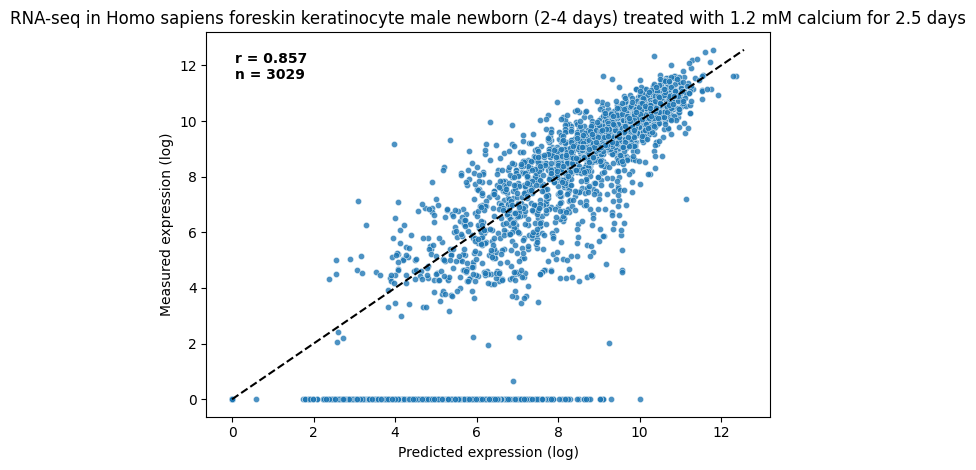

['ACOT12', 'ADH1C', 'AGTR2', 'AMBN', 'ARHGAP36', 'ARL5C', 'CABP5', 'CACNG6', 'CACNG7', 'CACNG8', 'CBLN2', 'CCDC160', 'CD300LG', 'CD33', 'CD40LG', 'CEACAM21', 'CEACAM3', 'CEACAM4', 'CEACAM5', 'CEACAM7', 'CHRDL1', 'CLEC10A', 'CNTNAP5', 'CRHBP', 'CSN3', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT83', 'CXCL13', 'DCAF12L2', 'DCX', 'DGKK', 'DIPK1C', 'DKK2', 'ENAM', 'ENPP6', 'EPHA5', 'ERVV-2', 'ETNPPL', 'FAM133A', 'FDCSP', 'FFAR3', 'FGA', 'FGB', 'FGF13', 'FOXD4L3', 'FPR3', 'FSTL5', 'FXYD7', 'GABRA3', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GDF10', 'GLP2R', 'GRID2', 'GYPC', 'HAND2', 'HAPLN1', 'HMX1', 'HORMAD2', 'HSPB6', 'HTR2C', 'IBSP', 'IGLL5', 'IQCM', 'IRGC', 'ISX', 'JCHAIN', 'KIAA1210', 'KIRREL2', 'KRT28', 'LAIR1', 'LGALS13', 'LILRB1', 'LILRB4', 'LIN28B', 'LONRF3', 'MAG', 'MAGEC2', 'MUC7', 'MYH1', 'MYH13', 'MYH2', 'MYH4', 'MYH8', 'MYO7B', 'MYOCD', 'NANOS2', 'NDNF', 

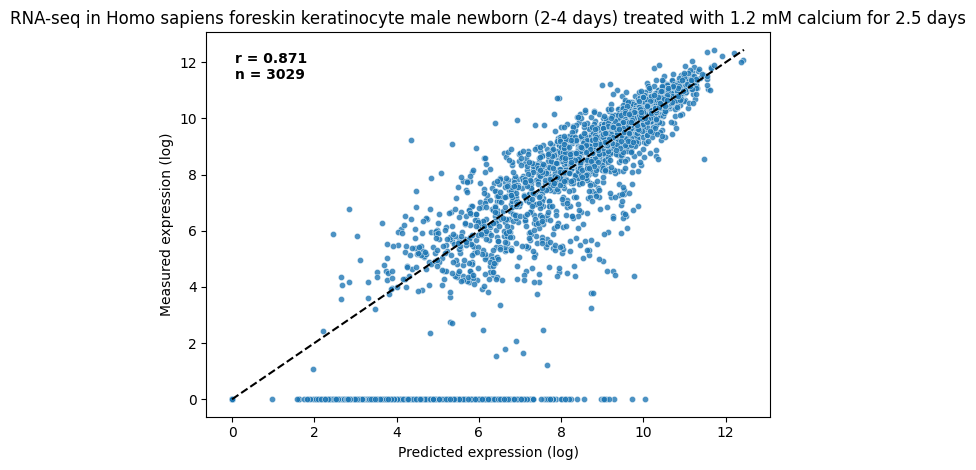

['ADH1C', 'ADRA1A', 'AIPL1', 'ALB', 'AMBN', 'ANKRD34B', 'ARHGAP36', 'ARL5C', 'ASB16', 'ATP2B3', 'AVPR2', 'BMP3', 'CABP5', 'CACNG2', 'CACNG8', 'CBLN2', 'CCDC160', 'CCR7', 'CD300LG', 'CD33', 'CD40LG', 'CEACAM16', 'CEACAM21', 'CEACAM3', 'CEACAM4', 'CEACAM7', 'CHRDL1', 'CLEC10A', 'CNTNAP5', 'CRHBP', 'CRHR1', 'CSN3', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL9', 'DCAF12L1', 'DCAF12L2', 'DCHS2', 'DCX', 'DKK2', 'ENAM', 'ENPP6', 'ERAS', 'ERVV-2', 'FAM81B', 'FDCSP', 'FFAR3', 'FGA', 'FGF13', 'FPR2', 'FPR3', 'FRMD7', 'FSTL5', 'FXYD7', 'G6PC1', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GARIN5B', 'GATA1', 'GDF10', 'GDF2', 'GGT5', 'GPR101', 'GPR17', 'GUCY2F', 'HAND2', 'HAPLN1', 'HORMAD2', 'HPGDS', 'IGLL5', 'IGSF1', 'IRGC', 'JCHAIN', 'KIAA1210', 'KLK2', 'KLK3', 'KLKB1', 'KRT26', 'KRT35', 'LGALS13', 'LILRB1', 'LILRB2', 'LILRB4', 'LIX1', 'LRCH2', 'MAB21L2',

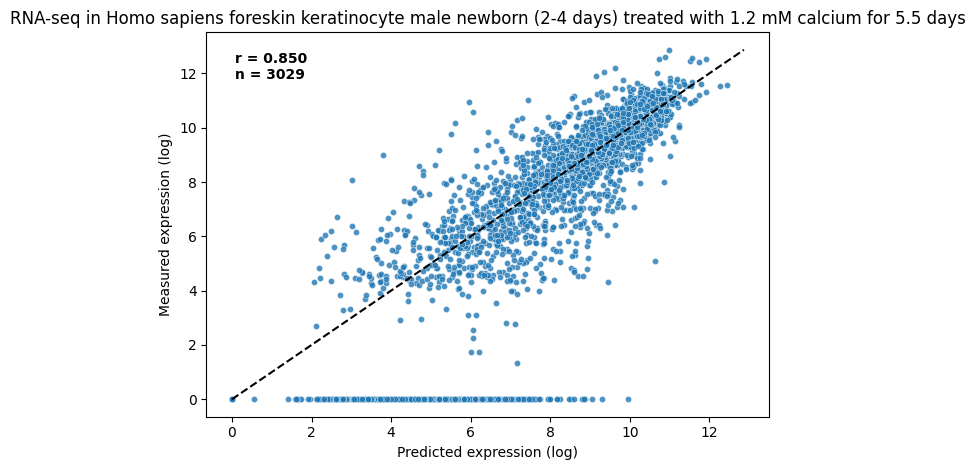

['ADH1C', 'ADRA1A', 'AMBN', 'ANKRD34B', 'ARHGAP36', 'ARHGEF15', 'ARL5C', 'C19orf81', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CACNG8', 'CAPN6', 'CBLN2', 'CCDC160', 'CD33', 'CD40LG', 'CEACAM16', 'CEACAM21', 'CEACAM4', 'CEACAM7', 'CGB8', 'CLEC10A', 'CNDP1', 'CRHBP', 'CRHR1', 'CSN3', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL9', 'DCAF12L1', 'DCX', 'DGKK', 'ENAM', 'ENPP6', 'EPHA5', 'ERVV-2', 'ETNPPL', 'F8A3', 'FAM133A', 'FDCSP', 'FFAR3', 'FGA', 'FGB', 'FGF13', 'FGG', 'FOXD4L3', 'FPR2', 'FPR3', 'FSTL5', 'G6PC1', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GATA1', 'GDF10', 'GDF2', 'GMFG', 'GPR101', 'GYPE', 'HAPLN1', 'HMX1', 'HPN', 'HSD17B13', 'IBSP', 'IFNL1', 'IGLL5', 'IGSF1', 'IQCM', 'IRGC', 'ISX', 'JCHAIN', 'KCNH4', 'KIAA1210', 'KLK3', 'KRT35', 'LAIR1', 'LGALS13', 'LILRB1', 'LILRB4', 'LRCH2', 'MAGEC2', 'MAGED4', 'MAGED4B', 'MYH1', 'MYH4', 'MYO18B'

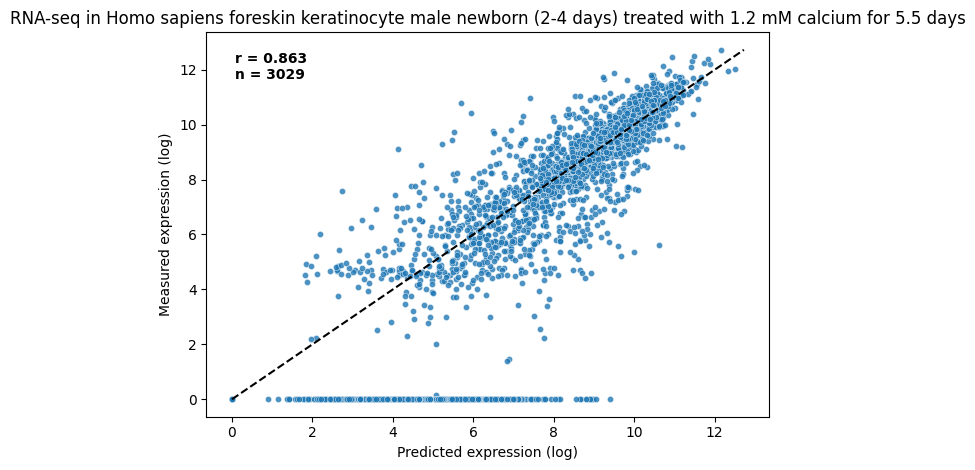

['ACOT12', 'ADH1B', 'ADRA1A', 'AFF2', 'AGTR2', 'AIPL1', 'ALB', 'ALDH1A1', 'ALOX15', 'ANKRD34B', 'APOBEC3A', 'ARHGAP36', 'ARHGEF15', 'ASB5', 'ASPA', 'ATOH1', 'ATP1A3', 'ATP1B2', 'AVPR2', 'BHMT', 'BHMT2', 'BMP3', 'BRS3', 'C19orf81', 'C4orf54', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG8', 'CBLN2', 'CCDC160', 'CD22', 'CD300LG', 'CD79A', 'CEACAM16', 'CEACAM21', 'CEACAM5', 'CEACAM7', 'CFAP299', 'CFAP95', 'CGB8', 'CHRDL1', 'CLDN2', 'CLDN24', 'CLEC10A', 'CNTNAP5', 'CRHBP', 'CRHR1', 'CSF2RB', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT55', 'CT83', 'CXCL13', 'CXCL17', 'CXCL9', 'CYP2A6', 'DCAF12L1', 'DCX', 'DDIT4L', 'DGKK', 'DIPK1C', 'DKK2', 'DKKL1', 'DNAAF6', 'DOC2B', 'EMCN', 'EPHA5', 'ETNPPL', 'EZHIP', 'FAM133A', 'FAM156B', 'FFAR1', 'FGA', 'FGB', 'FGG', 'FOXA3', 'FOXD4L3', 'FPR1', 'FPR2', 'FPR3', 'FRMPD3', 'FSTL5', 'GABRQ', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', '

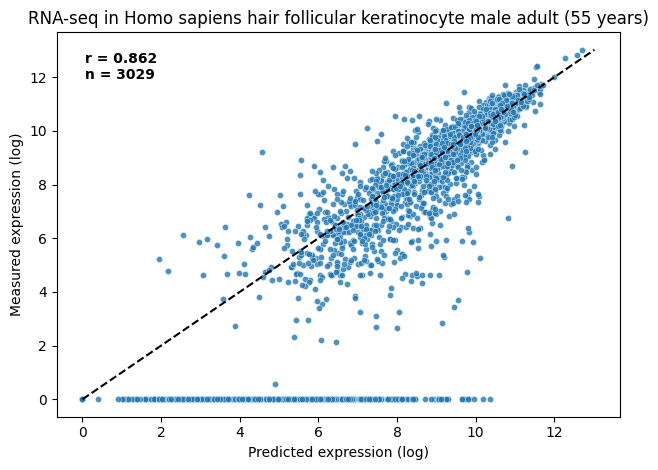

['ADAD1', 'ADH7', 'AIPL1', 'AMBN', 'AMTN', 'ATP1A3', 'ATP1B4', 'BPIFC', 'C22orf42', 'CABP5', 'CACNG2', 'CD300LG', 'CD40LG', 'CEACAM3', 'CEACAM4', 'CLC', 'CNGA2', 'CRHR1', 'CSAG1', 'CSN3', 'CT45A1', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47A1', 'CT47A2', 'CT47B1', 'CXCL9', 'DMRTC2', 'DNAAF6', 'DSPP', 'ENTHD1', 'EXOC1L', 'FAM25G', 'FDCSP', 'FPR2', 'FXYD7', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR3', 'GDF2', 'GJA8', 'GPR50', 'GSTT2', 'GSX2', 'GUCY2F', 'HELT', 'HES7', 'HMX1', 'IGLL1', 'IGLL5', 'IRGC', 'KASH5', 'KLK2', 'KLK4', 'KLK5', 'KLK9', 'KRT27', 'KRT31', 'KRT32', 'KRT33A', 'KRT33B', 'KRT35', 'KRT36', 'KRT38', 'KRT9', 'LGALS13', 'LGALS7', 'LGALS7B', 'LILRA1', 'LILRA2', 'LILRA4', 'LILRA5', 'MAGEA1', 'MAGEA11', 'MAGEA12', 'MAGEA3', 'MAGEA6', 'MAGEA8', 'MAGEC1', 'MAGEC2', 'MGAT4D', 'MUC7', 'NANOS2', 'NEUROD2', 'NKX6-1', 'NLRP12', 'NLRP13', 'NLRP4', 'NLRP

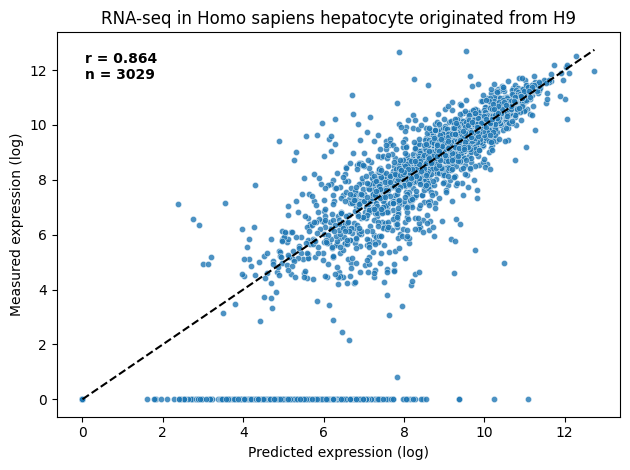

['ACTRT1', 'ADRA1A', 'AGTR2', 'AIPL1', 'AMBN', 'ARHGAP36', 'ARHGEF15', 'ATOH1', 'AVPR2', 'BRS3', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CBLN2', 'CD300LG', 'CD40LG', 'CEACAM16', 'CEACAM3', 'CEACAM7', 'CHRDL1', 'CLC', 'CLEC10A', 'CNGA2', 'CSAG1', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL13', 'CYP2B6', 'DCAF12L1', 'DMP1', 'DMRTC2', 'ENPEP', 'EPHA5', 'ETNPPL', 'FAM187B', 'FFAR3', 'GAGE1', 'GAGE10', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GALR1', 'GATA1', 'GDF10', 'GGT5', 'GPM6A', 'GPR101', 'GPR17', 'GRIA2', 'HAMP', 'HAND2', 'HAPLN1', 'HMX1', 'HPN', 'IBSP', 'IGLL5', 'IRGC', 'KLK3', 'LGALS13', 'LILRB4', 'LRCH2', 'LUZP4', 'MAG', 'MAGEA11', 'MAGEA3', 'MAGEC1', 'MAGEC2', 'MAGED4B', 'MEIOSIN', 'MPPED1', 'MUC7', 'MYH13', 'MYH4', 'NAA11', 'NEUROG2', 'NLRP5', 'NPFFR2', 'NPY2R', 'NXF2', 'P2RX1', 'PAGE4', 'PDHA2', 'PNMA8C', 'POU4F2', 'PRKACG', 'RBMXL3', 'RCVRN', 'RFPL2', 'RORB', 'SAGE1', 

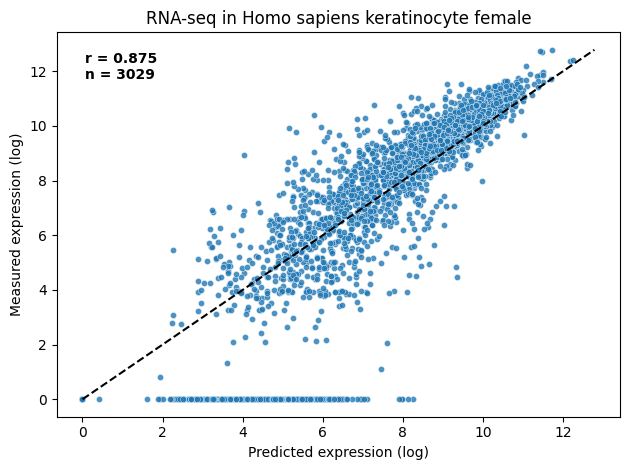

['ADAD1', 'ADAM29', 'ADGRG4', 'ADH7', 'AIPL1', 'AKAP4', 'AMBN', 'AMTN', 'ARHGAP36', 'ATOH1', 'ATP1B4', 'BHLHA9', 'BPIFC', 'C22orf42', 'CABP5', 'CABS1', 'CACNG6', 'CACNG7', 'CARTPT', 'CEACAM5', 'CEACAM7', 'CFAP299', 'CFAP95', 'CHRNA7', 'CNFN', 'CNTNAP5', 'CRX', 'CSF3', 'CSN3', 'CT45A1', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT55', 'CXCL13', 'CYP2B6', 'DMRTC2', 'DNAAF6', 'DSPP', 'ENTHD1', 'ERICH4', 'ERVV-2', 'EZHIP', 'FAM187B', 'FAM216B', 'FAM25G', 'FBXO47', 'FDCSP', 'FGF21', 'FRMD7', 'FXYD3', 'FXYD7', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GAST', 'GIMD1', 'GJA8', 'GK2', 'GPR32', 'GSTT4', 'HES7', 'HMX1', 'HORMAD2', 'HTN1', 'HTN3', 'IBSP', 'IGFL3', 'IL11', 'IL21', 'IRGC', 'KIAA1210', 'KLK10', 'KLK11', 'KLK13', 'KLK14', 'KLK15', 'KLK2', 'KLK3', 'KLK4', 'KLK6', 'KLK7', 'KLK8', 'KRT12', 'KRT14', 'KRT16', 'KRT24', 'KRT26', 'KRT31', 'KRT32', 'KRT33A', '

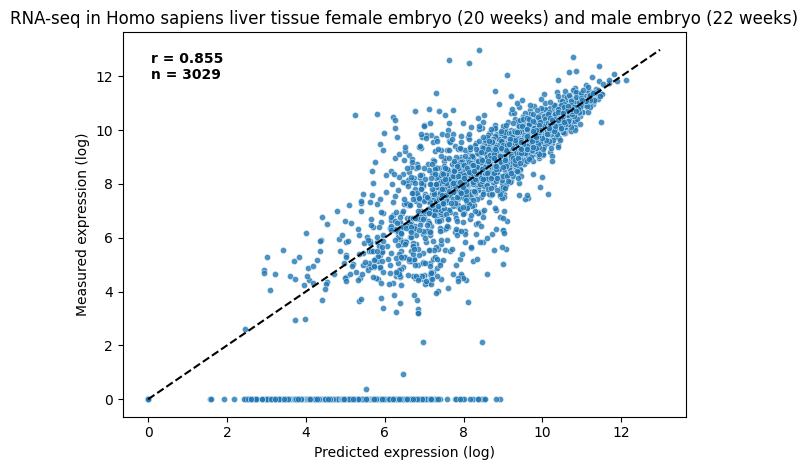

['AFP', 'AGTR2', 'AIPL1', 'AMBN', 'ANKRD34B', 'ANXA10', 'APELA', 'APLN', 'APOBEC3A', 'APOBEC3B', 'ARHGAP36', 'ASB5', 'ATP1B2', 'BEX1', 'BHLHA9', 'BRS3', 'C17orf114', 'C22orf42', 'C4orf17', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CBLN2', 'CCDC42', 'CD40LG', 'CEACAM16', 'CEACAM20', 'CEACAM3', 'CFAP299', 'CFAP52', 'CFAP95', 'CLC', 'CNGA2', 'CNTNAP5', 'CRX', 'CSF3', 'CSN3', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL11', 'CXCL13', 'CXCL5', 'CXCL8', 'CYP2A7', 'CYP2B6', 'CYP2F1', 'DCAF12L1', 'DCX', 'DGKK', 'DHDH', 'DLL3', 'DMC1', 'DMP1', 'DSPP', 'DUSP9', 'ENAM', 'EOMES', 'EPSTI1', 'ERAS', 'ERICH4', 'ETNPPL', 'EZHIP', 'F11', 'F8A3', 'FAM156B', 'FAM187B', 'FDCSP', 'FFAR1', 'FFAR3', 'FGA', 'FGB', 'FGF21', 'FGF5', 'FGG', 'FOXA3', 'FOXD4L3', 'FRMD7', 'FXYD7', 'G6PC1', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR3', 'GARIN5B', 'GAST', 'GDF2', 'GFAP', 'GGTLC2',

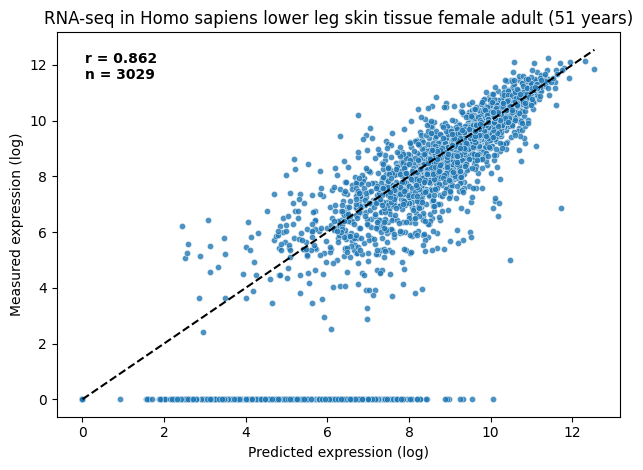

['ADGRG4', 'ADH7', 'AFP', 'AGTR2', 'AIPL1', 'AMBN', 'AMTN', 'ANKRD34B', 'ANXA10', 'APLN', 'APOBEC3A', 'APOBEC3H', 'ARHGAP36', 'ARL5C', 'ATP1A3', 'ATP2B3', 'ATP5MGL', 'BHLHA9', 'BRS3', 'BRSK1', 'C17orf114', 'C4orf17', 'C4orf54', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CACNG8', 'CAPN6', 'CCR10', 'CD40LG', 'CEACAM16', 'CEACAM3', 'CEACAM4', 'CFAP299', 'CFAP95', 'CHRNA7', 'CLC', 'CNTNAP5', 'CRYBB2', 'CSN3', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL10', 'CXCL11', 'CXCL13', 'CXCL5', 'CXCL8', 'CYP2F1', 'DCAF12L1', 'DCAF12L2', 'DCX', 'DDTL', 'DERL3', 'DGKK', 'DKKL1', 'DLL3', 'ENAM', 'ENPP6', 'EOMES', 'ETNPPL', 'EZHIP', 'FAM133A', 'FAM156B', 'FAM216B', 'FAM81B', 'FCAR', 'FDCSP', 'FFAR1', 'FFAR3', 'FGA', 'FGB', 'FGF5', 'FGG', 'FOXD4L3', 'FSTL5', 'FXYD7', 'G6PC1', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GARIN5B', 'GAST', 'GATA1', 'GDF2', 'GFAP', 'GRID2', 'GS

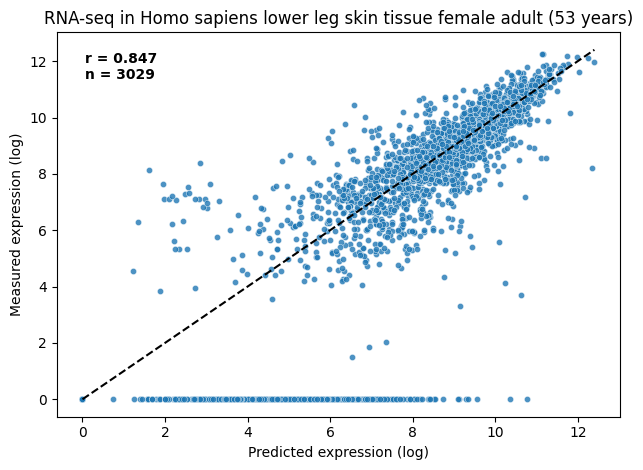

['ADAD1', 'ADAM29', 'ADGRG4', 'AFM', 'AFP', 'AGTR2', 'AIPL1', 'ANKRD34B', 'ANXA10', 'APOBEC3H', 'ARHGAP36', 'ATP1A3', 'ATP1B4', 'ATP4A', 'BHLHA9', 'BRS3', 'C22orf42', 'C4orf17', 'C4orf51', 'C9orf57', 'CABP5', 'CACNG2', 'CACNG7', 'CACNG8', 'CARTPT', 'CCDC42', 'CEACAM18', 'CEACAM20', 'CFAP299', 'CFAP95', 'CGB8', 'CLDN24', 'CNGA2', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT83', 'CXCL11', 'CXCL5', 'CXCL6', 'CYP2A13', 'CYP2F1', 'DCAF12L1', 'DGKK', 'DHRS7C', 'DMP1', 'DMRTC2', 'DNAAF6', 'DSPP', 'ERAS', 'ERICH4', 'ERVV-1', 'ERVV-2', 'ETNPPL', 'EXOC1L', 'EZHIP', 'F11', 'FABP2', 'FAM187B', 'FAM216B', 'FBXO47', 'FDCSP', 'FFAR1', 'FFAR3', 'FGA', 'FGB', 'FGF21', 'FGG', 'FOXA3', 'FOXD4L3', 'G6PC1', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GAST', 'GC', 'GDF2', 'GGTLC2', 'GNG8', 'GPR119', 'GPR42', 'GPR50', 'GRID2', 'GSTT2', 'GUCY2F', 'GYPA', 'GYPB

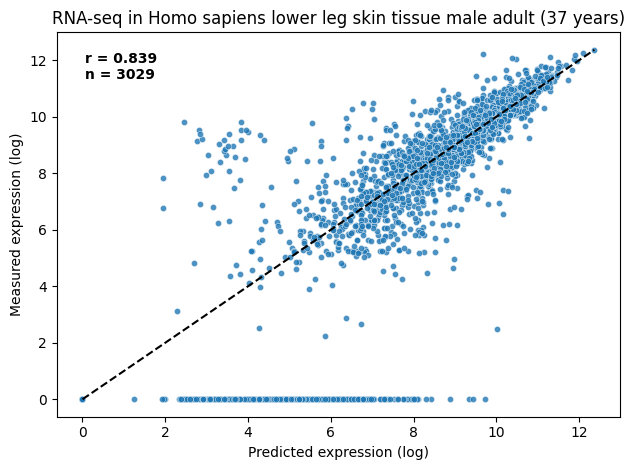

['ADGRG4', 'ADH1C', 'ADH7', 'AGTR2', 'AKAP4', 'ANXA10', 'ANXA8', 'AREG', 'ATP1B4', 'BPIFC', 'C4orf17', 'C4orf54', 'CABP5', 'CACNG2', 'CARTPT', 'CBLN2', 'CCDC42', 'CD33', 'CD40LG', 'CEACAM16', 'CEACAM6', 'CFAP299', 'CFAP52', 'CLEC10A', 'CNGA2', 'CSAG1', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CXCL1', 'CXCL10', 'CXCL11', 'CXCL8', 'CXCL9', 'CYP2B6', 'CYTH4', 'DHRS7C', 'DMRTC2', 'ENAM', 'EPHA5', 'EREG', 'EXOC1L', 'FAM216B', 'FATE1', 'FDCSP', 'FFAR3', 'FPR1', 'FPR2', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GASK1B', 'GC', 'GGTLC2', 'GLP2R', 'GPR119', 'GPR17', 'GPR4', 'GRAP2', 'GSTT2', 'HCRT', 'HELT', 'HTN1', 'HTN3', 'IBSP', 'IGFL3', 'IGLL1', 'IL13RA2', 'IL21', 'IRGC', 'KIAA1210', 'KLK1', 'KLK13', 'KLK3', 'KLK5', 'KRT13', 'KRT24', 'KRT27', 'KRT31', 'KRT33B', 'KRT34', 'LAIR1', 'LILRA1', 'LILRA5', 'LILRB1', 'LILRB2', 'LILRB4', 'LILRB5', 'LUZP4', 'MAG

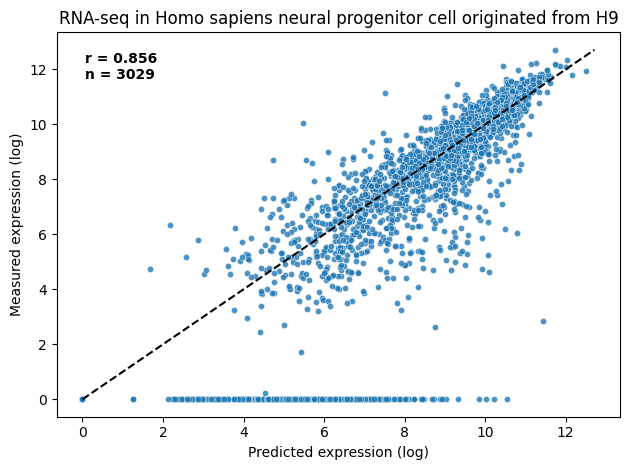

['ACTRT1', 'ADH7', 'AGTR2', 'AIPL1', 'AMBN', 'APOL5', 'ARL5C', 'ATOH1', 'ATP1B4', 'CD40LG', 'CLDN24', 'CSN3', 'CT45A2', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47A1', 'CT47A10', 'CT47A11', 'CT47A12', 'CT47A2', 'CT47A3', 'CT47A4', 'CT47A5', 'CT47A6', 'CT47A7', 'CT47A8', 'CT47A9', 'CXCL8', 'EOMES', 'ERICH4', 'ERVV-2', 'ETNPPL', 'FFAR2', 'FGF5', 'FGG', 'FOXD4L3', 'FRMD7', 'FXYD7', 'G6PC1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GDF2', 'GPR32', 'GPR50', 'GSTT2', 'HAPLN1', 'HCRT', 'HSFX2', 'HSFX4', 'IBSP', 'KRT12', 'KRT33B', 'MAGEA2B', 'MAGED4', 'NEUROG2', 'NXF2', 'ODAPH', 'OTP', 'PF4', 'PF4V1', 'PNPLA5', 'SH2D1A', 'SMIM9', 'SSX2', 'SSX2B', 'TACR3', 'TBC1D3', 'TCP11X1', 'TMEM95', 'TNIP3', 'UGT1A4', 'UGT1A5', 'UGT1A7', 'UGT1A8', 'UGT1A9', 'UGT2A1', 'UGT2A2', 'UGT2A3', 'UGT2B11', 'UGT2B17', 'UGT2B4', 'XAGE1A', 'XAGE1B']


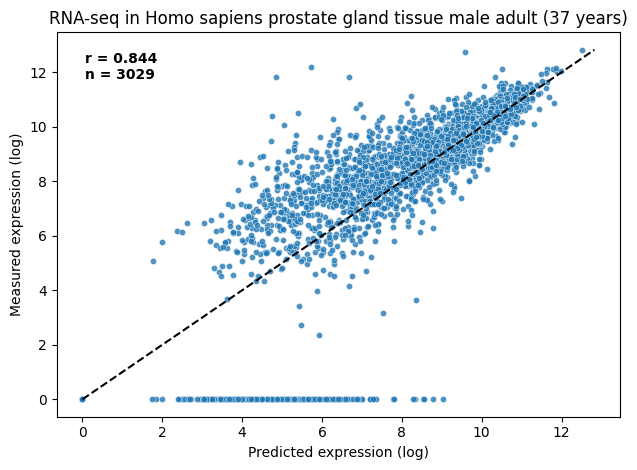

['ADAD1', 'AFM', 'AFP', 'AGTR2', 'AIPL1', 'AMBN', 'ANXA10', 'APOC4', 'ARL5C', 'ATOH1', 'ATP1A3', 'ATP2B3', 'ATP4A', 'BHLHA9', 'BPIFC', 'BRS3', 'C22orf42', 'C4orf17', 'C9orf57', 'CABP5', 'CACNG2', 'CACNG7', 'CACNG8', 'CD40LG', 'CEACAM16', 'CEACAM18', 'CEACAM20', 'CEACAM7', 'CEACAM8', 'CENPVL3', 'CFAP95', 'CFAP97D1', 'CLC', 'CLDN24', 'CNDP1', 'CNGA2', 'CRX', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL10', 'CYP2A13', 'CYP2B6', 'CYP2F1', 'DCX', 'DERL3', 'DGKK', 'DHRS7C', 'DLL3', 'DMP1', 'DNAAF6', 'DSPP', 'ERICH4', 'ERVV-1', 'EXOC1L', 'EZHIP', 'F11', 'FABP2', 'FAM187B', 'FAM216B', 'FAM25G', 'FDCSP', 'FFAR1', 'FGA', 'FGB', 'FGF21', 'FGG', 'FOXD4L3', 'FPR2', 'FRMD7', 'FSTL5', 'GABRQ', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GC', 'GDA', 'GDF2', 'GFAP', 'GGTLC2', 'GIMD1', 'GLRA3', 'GPR101', 'GPR119', 'GPR50', 'GSDMA', 'GSTT2', 'GSX2', 'GUCY2F', 'GY

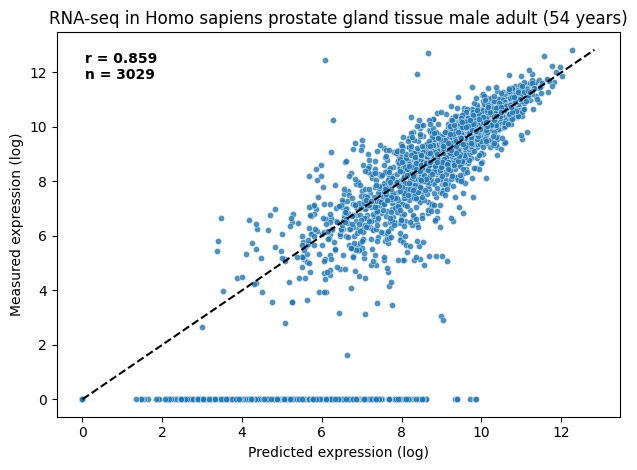

['ACP7', 'ADH7', 'AGTR2', 'AIPL1', 'AMTN', 'APELA', 'ARHGAP36', 'ARL5C', 'ASB5', 'BHLHA9', 'BMP3', 'BPIFC', 'BRS3', 'C4orf17', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CARTPT', 'CCDC42', 'CCDC92B', 'CEACAM5', 'CEACAM7', 'CFAP299', 'CFAP97D1', 'CHST8', 'CNFN', 'CNTNAP5', 'COX6B2', 'CRHR1', 'CRYBB2', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CYP2F1', 'DCAF12L1', 'DCAF12L2', 'DGKK', 'DHRS7C', 'DLL3', 'DMP1', 'DMRTC2', 'DNAAF6', 'DNAH9', 'DRP2', 'ENTHD1', 'EPHA5', 'ERVV-1', 'EZHIP', 'F8A3', 'FAM156B', 'FAM216B', 'FAM25G', 'FBXO47', 'FDCSP', 'FFAR1', 'FGF5', 'FOXD4L3', 'FRMD7', 'FRMPD3', 'FSTL5', 'FXYD7', 'GABRA3', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR3', 'GAST', 'GGTLC2', 'GIMD1', 'GNG8', 'GPR101', 'GPR42', 'GRID2', 'GSTT4', 'GSX2', 'GUCY2F', 'HCRT', 'HES7', 'HIGD1B', 'HMX1', 'HSFX4', 'HTN3', 'HTR2C', 'IBSP', 'IGFL1', 'IL11', 'IRGC', 'IRS4'

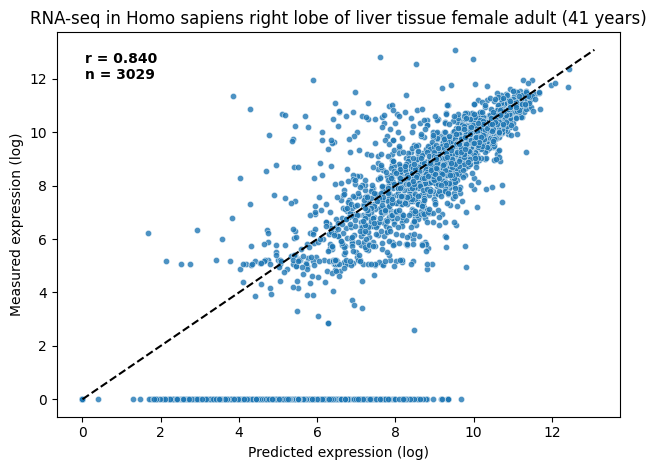

['ACP7', 'ADAD1', 'ADAM29', 'AGPAT4', 'AGTR2', 'AIPL1', 'ALOX12B', 'ALOXE3', 'AMBN', 'AMTN', 'ANKRD34B', 'APELA', 'ARHGAP36', 'ATP1A3', 'ATP1B4', 'ATP2B3', 'BHLHA9', 'BMP3', 'BPIFC', 'BRS3', 'C19orf81', 'C22orf42', 'C9orf57', 'CABP5', 'CACNA1F', 'CACNA1I', 'CACNG2', 'CACNG6', 'CACNG7', 'CARTPT', 'CCDC160', 'CEACAM5', 'CEACAM6', 'CEACAM7', 'CFAP299', 'CFAP95', 'CFAP97D1', 'CLC', 'CNFN', 'CNTNAP5', 'CRHR1', 'CRYBA4', 'CSF3', 'CSN3', 'CT45A1', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL5', 'CYP27C1', 'DCAF12L1', 'DCAF12L2', 'DDTL', 'DGKK', 'DHRS7C', 'DIPK1C', 'DLL3', 'DMC1', 'DMP1', 'DMRTC2', 'DNAAF6', 'DPF1', 'DSPP', 'EPHA5', 'EREG', 'ERICH4', 'ERVV-1', 'EZHIP', 'F8A3', 'FAM156B', 'FAM187B', 'FAM216B', 'FAM25G', 'FDCSP', 'FFAR1', 'FFAR3', 'FGF5', 'FOXD1', 'FOXD4L3', 'FRMPD3', 'FSTL5', 'FXYD3', 'GABRA3', 'GABRQ', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E'

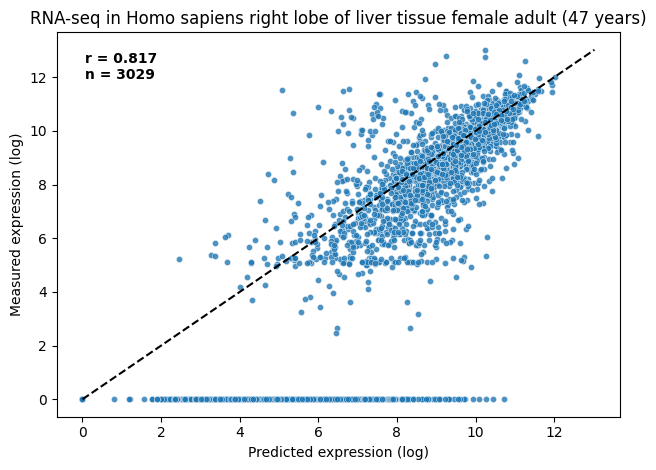

['ADGRG4', 'AGTR2', 'ALOX12B', 'AMBN', 'ANKRD34B', 'APELA', 'ARHGAP36', 'ATP1A3', 'ATP1B4', 'BMP3', 'BPIFC', 'BRS3', 'CACNG2', 'CACNG6', 'CACNG7', 'CARTPT', 'CBLN2', 'CCDC42', 'CCDC92B', 'CCER2', 'CEACAM5', 'CEACAM8', 'CFAP299', 'CHRNA7', 'CLC', 'CNTNAP5', 'COX6B2', 'CRHR1', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CXCL17', 'DCAF12L1', 'DCAF12L2', 'DGKK', 'DLL3', 'EPHA5', 'ERICH4', 'EZHIP', 'FAM133A', 'FDCSP', 'FFAR1', 'FGF5', 'FXYD7', 'GABRA3', 'GABRQ', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GALR3', 'GAPDHS', 'GDF10', 'GRIA2', 'GRID2', 'GSX2', 'GUCY2F', 'GYPA', 'HES7', 'HMX1', 'HTR2C', 'IGLL1', 'IL11', 'IL17REL', 'IRGC', 'IRS4', 'ISX', 'ITIH6', 'KIRREL2', 'KLK1', 'KLK12', 'KLK13', 'KLK14', 'KLK4', 'KLK5', 'KLK6', 'KLK7', 'KLK8', 'KRT12', 'KRT14', 'KRT15', 'KRT16', 'KRT17', 'KRT24', 'KRT31', 'KRT32', 'KRT33B', 'KRT34', 'K

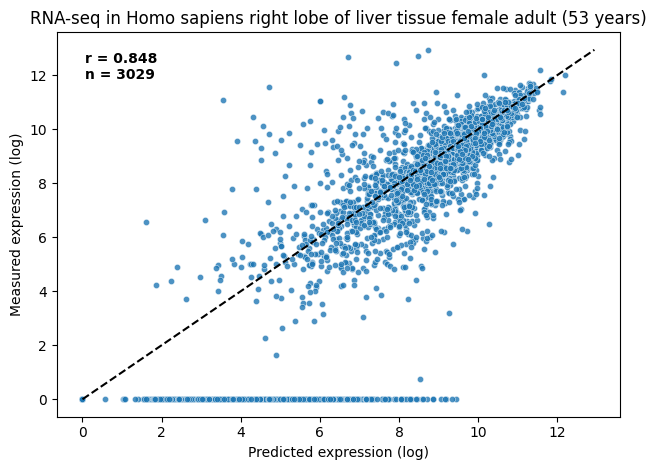

['ACP7', 'AGPAT4', 'AGTR2', 'AIPL1', 'ALOXE3', 'AMBN', 'AMTN', 'ANKRD34B', 'APELA', 'AREG', 'ARHGAP36', 'ARL5C', 'ASB5', 'BMP3', 'BRS3', 'C22orf42', 'C4orf17', 'CABP5', 'CACNG6', 'CACNG7', 'CACNG8', 'CARTPT', 'CCDC160', 'CEACAM20', 'CEACAM7', 'CFAP299', 'CFAP95', 'CHRNA7', 'CNTNAP5', 'CRHR1', 'CRYBA4', 'CSF3', 'CSN3', 'CT45A1', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CYP2F1', 'DCAF12L1', 'DCAF12L2', 'DHRS7C', 'DIPK1C', 'DKK2', 'DLL3', 'DMP1', 'DMRTC2', 'DNAAF6', 'DRP2', 'DSPP', 'EGF', 'EPHA5', 'EREG', 'ERFL', 'ERICH4', 'ERVV-1', 'F8A3', 'FAM133A', 'FAM156B', 'FAM187B', 'FAM216B', 'FAM25G', 'FDCSP', 'FFAR1', 'FFAR3', 'FGF5', 'FOXD1', 'FOXD4L3', 'FXYD7', 'GABRA3', 'GABRQ', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GAST', 'GFAP', 'GIMD1', 'GLRA3', 'GNG8', 'GPR101', 'GPR50', 'GRIA2', 'GRID2', 'GSDMA', 'GSTT4', 'HAPLN1', 'HAS1', 'HES7',

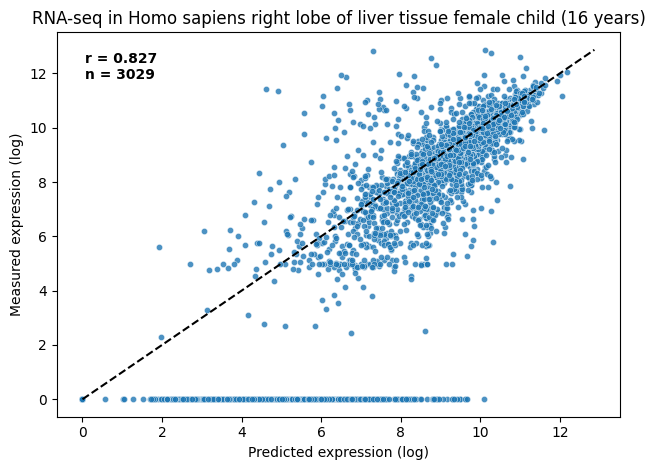

['ADAM29', 'CABP5', 'CABS1', 'CARTPT', 'CFAP95', 'CRYBA4', 'CSF3', 'CSN1S1', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47A1', 'CT47A12', 'CT47A2', 'CT47B1', 'DMP1', 'DMRTC2', 'DNAAF6', 'ERAS', 'ERICH4', 'F8A3', 'FAM187B', 'FDCSP', 'FGF21', 'FOXD4L3', 'GAGE1', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GDF2', 'GGTLC2', 'GJA8', 'GPR119', 'GPR50', 'GSG1L2', 'GSTT4', 'GSX2', 'HTN3', 'ISX', 'KRT24', 'LGALS13', 'MAGEC1', 'MAGEC2', 'MGAT4D', 'MIOX', 'NEUROG2', 'NKX6-1', 'NLRP11', 'NLRP13', 'NLRP5', 'NLRP8', 'NXF2', 'OPRPN', 'OR13H1', 'PNMA6F', 'PPY', 'PYY', 'RIMBP3C', 'SAGE1', 'SBK3', 'SERPINA7', 'SLC13A5', 'SMIM45', 'SMIM9', 'SOX3', 'SPEM3', 'SSX2B', 'STATH', 'SULT2A1', 'TBC1D3', 'TCP11X1', 'TCP11X2', 'TEX13C', 'TEX13D', 'TEX28', 'TFDP3', 'TM4SF5', 'TRIM60', 'UGT1A10', 'UGT2B10', 'UGT2B15', 'UGT2B17', 'UGT2B7', 'UPK3A', 'USP26', 'USP29', 'VN1R2']


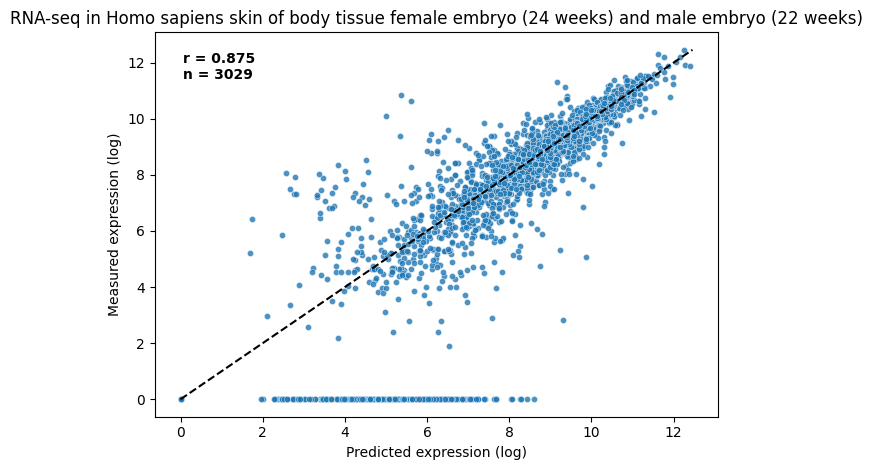

['ADH1A', 'AFP', 'AGTR2', 'ANKRD34B', 'ANXA10', 'APELA', 'APOBEC3B', 'APOBEC3D', 'ARHGAP36', 'ARL5C', 'ASB5', 'ATP2B3', 'BHLHA9', 'BRS3', 'C17orf114', 'C4orf17', 'C4orf45', 'C4orf54', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CACNG8', 'CCDC158', 'CCDC42', 'CEACAM16', 'CEACAM20', 'CEACAM21', 'CFAP95', 'CGB8', 'CLC', 'CLDN24', 'CLGN', 'CNTNAP5', 'CRHBP', 'CSN3', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT83', 'CXCL10', 'CXCL11', 'CXCL17', 'CXCL5', 'CXCL6', 'CYP2A7', 'CYP2F1', 'DCAF12L1', 'DCAF12L2', 'DCX', 'DGKK', 'DMP1', 'DOK6', 'ENAM', 'EOMES', 'ERAS', 'ETNPPL', 'EZHIP', 'FAM133A', 'FAM187B', 'FAM216B', 'FDCSP', 'FFAR1', 'FFAR3', 'FGA', 'FGB', 'FGF21', 'FGF5', 'FGG', 'FOXD4L3', 'FXYD7', 'G6PC1', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR3', 'GARIN5B', 'GATA1', 'GDF2', 'GFAP', 'GLRA3', 'GPR42', 'GPR50', 'GRID2', 'GYPA', 'HAMP', 'HCST', 'HMX1', 'HORMAD

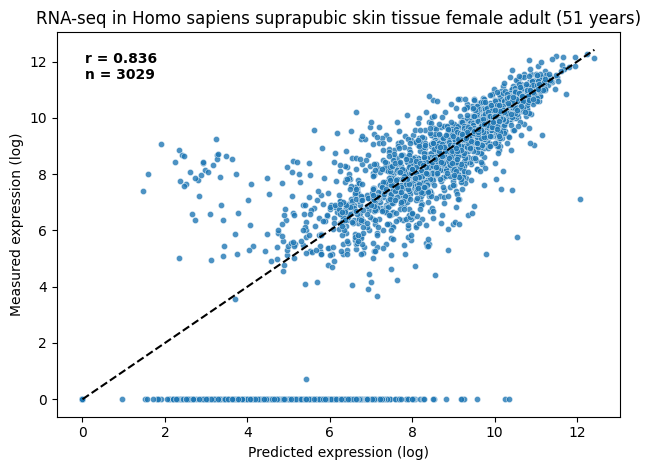

['ADAD1', 'ADAM29', 'ADGRG4', 'AFP', 'AGTR2', 'AIPL1', 'AMBN', 'AMTN', 'ANKRD34B', 'APELA', 'APOBEC3A', 'APOL5', 'ARHGAP36', 'ASB5', 'ATP1A3', 'ATP1B4', 'BHLHA9', 'BRS3', 'C22orf42', 'C4orf51', 'C4orf54', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CARTPT', 'CBLN2', 'CCDC42', 'CD22', 'CEACAM18', 'CEACAM3', 'CFAP299', 'CFAP95', 'CLC', 'CNGA2', 'CNTNAP5', 'CSF3', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT83', 'CXCL10', 'CXCL11', 'CXCL5', 'CXCL6', 'CYP2A13', 'CYP2B6', 'CYP2F1', 'DCAF12L1', 'DCAF12L2', 'DCX', 'DGKK', 'DHRS7C', 'DKKL1', 'DLL3', 'DMP1', 'DNAAF6', 'DSPP', 'ENPP6', 'EOMES', 'ERVV-1', 'ERVV-2', 'ETNPPL', 'EXOC1L', 'F11', 'FABP2', 'FAM216B', 'FBXO47', 'FDCSP', 'FFAR1', 'FFAR3', 'FGF5', 'FPR2', 'FSTL5', 'G6PC1', 'GABRQ', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GARIN5B', 'GAST', 'GDF2', 'GGTLC2', 'GPR42', 'GPR50', 'GRID2', 'GYPA'

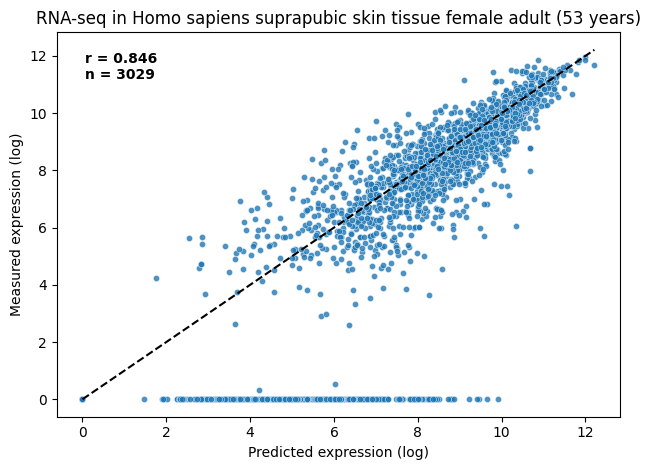

['AFP', 'AGTR2', 'ANKRD34B', 'ANXA10', 'APOL5', 'ARHGAP36', 'ASB5', 'ATOH1', 'ATP1A3', 'ATP1B4', 'BHLHA9', 'BRS3', 'C19orf85', 'C22orf42', 'C4orf54', 'CABP5', 'CACNG2', 'CACNG6', 'CACNG7', 'CARTPT', 'CCDC42', 'CD22', 'CEACAM20', 'CFAP95', 'CGB8', 'CHRNA7', 'CLC', 'CNGA2', 'CRX', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT83', 'CXCL10', 'CXCL11', 'CXCL6', 'CXCL8', 'CYP2F1', 'DCAF12L1', 'DGKK', 'DHDH', 'DMP1', 'DSPP', 'ENAM', 'ERAS', 'ERICH4', 'ERVV-1', 'ERVV-2', 'ETNPPL', 'EZHIP', 'FAM187B', 'FAM216B', 'FDCSP', 'FFAR1', 'FFAR3', 'FGB', 'FGF21', 'FGG', 'FOXA3', 'FPR2', 'FREM3', 'FSTL5', 'G6PC1', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GALR1', 'GARIN5B', 'GAST', 'GATA1', 'GC', 'GDF2', 'GGTLC2', 'GJA8', 'GPR101', 'GPR42', 'GPR50', 'GUCY2F', 'GYPE', 'HES7', 'HIPK4', 'HMX1', 'HORMAD2', 'HSFX4', 'HTN1', 'HTN3', 'IFNL1', 'IGLL5', 'IGSF23',

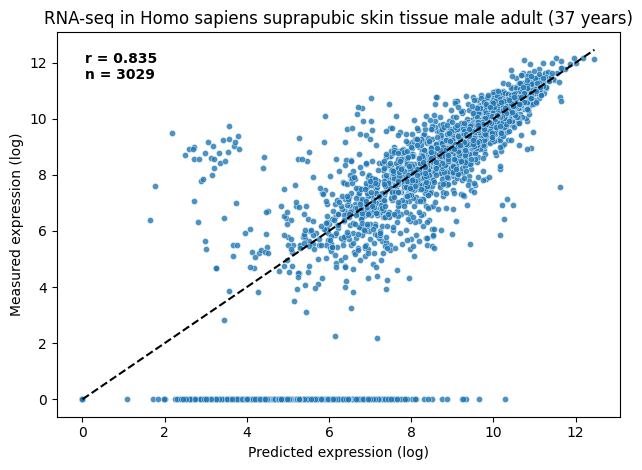

['AFP', 'AIPL1', 'AMBN', 'AMTN', 'ANKRD34B', 'ANXA10', 'APOBEC3H', 'ARHGAP36', 'ATP1B4', 'BRS3', 'C22orf42', 'C4orf17', 'C9orf57', 'CACNG7', 'CARTPT', 'CCDC42', 'CEACAM18', 'CEACAM20', 'CEACAM3', 'CFAP299', 'CFAP95', 'CGB8', 'CLDND2', 'CNGA2', 'CRX', 'CSF3', 'CSN3', 'CT45A10', 'CT45A2', 'CT45A3', 'CT45A5', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47B1', 'CT83', 'CXCL5', 'CXCL6', 'CYP2A13', 'CYP2F1', 'DCAF12L1', 'DGKK', 'DHRS7C', 'DNAAF6', 'DSPP', 'ENAM', 'EOMES', 'ERAS', 'ERICH4', 'ETNPPL', 'EXOC1L', 'FAM216B', 'FBXO47', 'FFAR3', 'FGA', 'FGB', 'FGF21', 'FGG', 'FOXA3', 'FOXD4L3', 'FRMD7', 'FSTL5', 'GAGE1', 'GAGE10', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'GAGE12J', 'GAGE13', 'GAGE2A', 'GAGE2E', 'GARIN5B', 'GAST', 'GDF2', 'GGTLC2', 'GPR42', 'GPR50', 'GRID2', 'GSTT4', 'GYPA', 'GYPB', 'HMX1', 'HORMAD2', 'HSPB9', 'HTN1', 'HTN3', 'HTR2C', 'IBSP', 'IFNL1', 'IGLL1', 'IGSF23', 'IRGC', 'ISX', 'KIRREL2', 'KLKB1', 'LGALS13', 'LGALS14', 'LGALS16', 'MAGEA11', 

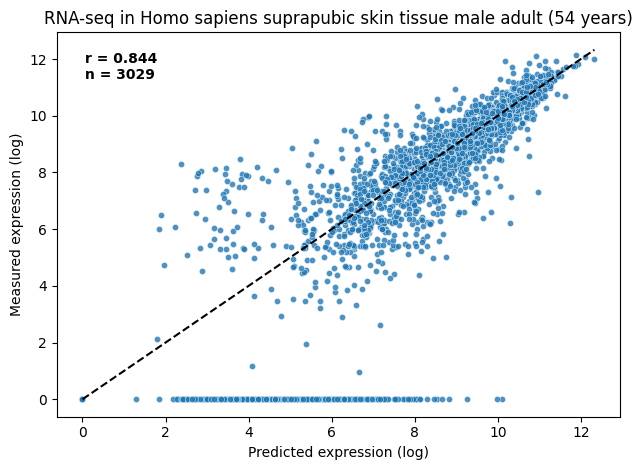

['CT45A2', 'CT45A6', 'CT45A7', 'CT45A8', 'CT45A9', 'CT47A1', 'CT47A10', 'CT47A11', 'CT47A12', 'CT47A2', 'CT47A3', 'CT47A4', 'CT47A5', 'CT47A6', 'CT47A7', 'CT47A8', 'CT47A9', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE12H', 'UGT2B17']


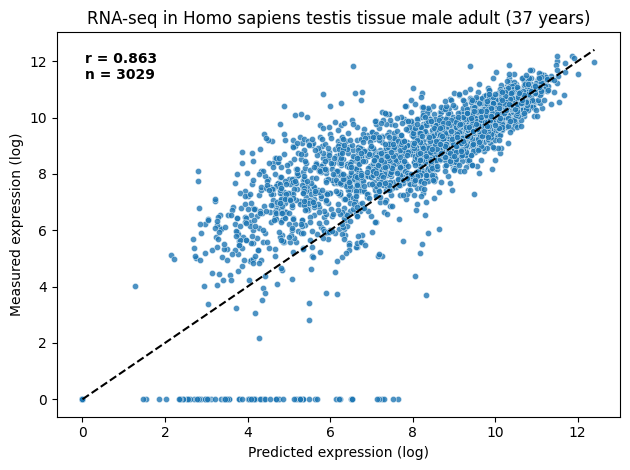

['AGTR2', 'APELA', 'ATOH1', 'CT45A2', 'CT45A6', 'CT45A7', 'CT45A8', 'CT47A1', 'CT47A10', 'CT47A11', 'CT47A12', 'CT47A2', 'CT47A3', 'CT47A4', 'CT47A5', 'CT47A8', 'CT47A9', 'FAM156B', 'GAGE12B', 'GAGE12C', 'GAGE12D', 'GAGE12E', 'GAGE12F', 'GAGE12G', 'GAGE13', 'ITIH6', 'LIF', 'MAGED4', 'MAGED4B', 'PF4', 'RFPL2', 'SSX2B', 'UGT2A3']


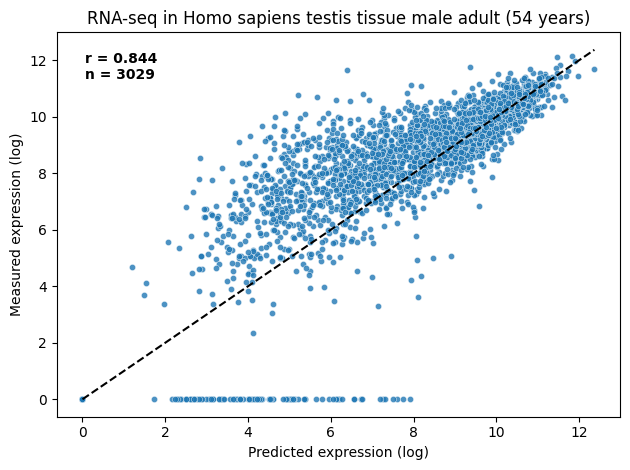

In [6]:
cors = []
cors_df = {}
for col in range(encode.shape[1]):
    sample_idx = int(encode.columns[col].split('_')[0])
    y = encode.iloc[:, col]
    x = grt.iloc[:, col]
    r, _ = pearsonr(x, y)
    n = len(x)

    print([encode.index[i] for i in range(len(encode)) if encode.iloc[i, col] < 1 and grt.iloc[i, col] > 5])
    cors.append(r)
    cors_df[encode.columns[col]] = r
    sns.scatterplot(x=x, y=y, s=20, alpha=0.8)
    min_val = min(x.min(), y.min())
    max_val = max(x.max(), y.max())
    plt.plot([min_val, max_val], [min_val, max_val], linestyle='--', color='black')
    plt.text(
        0.05, 0.95,
        f"r = {r:.3f}\nn = {n}",
        transform=plt.gca().transAxes,
        fontsize=10,
        weight='bold',
        verticalalignment='top'
    )
    plt.xlabel('Predicted expression (log)')
    plt.ylabel('Measured expression (log)')
    plt.title(f"RNA-seq in {cells.loc[sample_idx, 'tissue_name']}")
    plt.tight_layout()
    plt.show()

In [7]:
with open('/project/deeprna_data/benchmark/gene_level_cross_celltype/correlations_fixed.pk', 'wb') as f:
    pickle.dump(cors_df, f)
print(cors_df)

{'46_rna_total_encode': 0.8586435226409735, '47_rna_polya_encode': 0.8768052964349459, '47_rna_total_encode': 0.8614724512231567, '49_rna_total_encode': 0.8465926422239798, '50_rna_total_encode': 0.8574920341373692, '54_rna_polya_encode': 0.8712177682334551, '105_rna_total_encode': 0.8624964731565322, '159_rna_polya_encode': 0.8605733207319631, '159_rna_total_encode': 0.872733604234223, '160_rna_polya_encode': 0.8573793025128079, '160_rna_total_encode': 0.8707827873176566, '161_rna_polya_encode': 0.8502151045535922, '161_rna_total_encode': 0.8629835722315938, '174_rna_total_encode': 0.8621813906237968, '202_rna_total_encode': 0.8638646126941018, '203_rna_polya_encode': 0.8747674540686233, '211_rna_total_encode': 0.8549218130048878, '212_rna_total_encode': 0.8615494882866055, '213_rna_total_encode': 0.8465473981575747, '214_rna_total_encode': 0.8394356207616485, '239_rna_total_encode': 0.8557529616262898, '267_rna_total_encode': 0.8438288023213, '268_rna_total_encode': 0.859303422553001

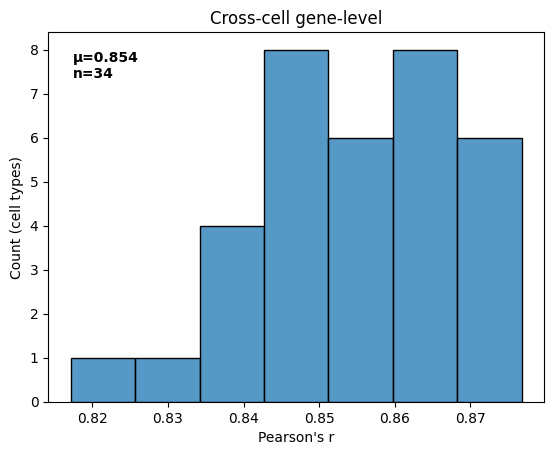

In [8]:
mu = np.mean(cors)
sns.histplot(cors)
plt.text(
    0.05, 0.95,
    f'μ={round(mu, 3)}\nn={len(cors)}',
    transform=plt.gca().transAxes,
    fontsize=10,
    weight='bold',
    verticalalignment='top')
plt.title("Cross-cell gene-level")
plt.xlabel("Pearson's r")
plt.ylabel("Count (cell types)")
plt.show()

## Cross-sequence

In [9]:
## Cross-sequence
encode = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_region/all_true_log_expr.csv', index_col=0, header='infer')
grt = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_region/all_predicted_log_expr.csv', index_col=0, header='infer')

encode = encode.loc[encode.index.isin(coding_genes.Symbol)]
grt = grt.loc[grt.index.isin(coding_genes.Symbol)]

cors = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_region/correlations.csv', header='infer')
cors[['pearson','log_pearson','spearman']].mean(axis=0)

pearson        0.804879
log_pearson    0.885515
spearman       0.895394
dtype: float64

['ADAM18', 'ADAM2', 'ALKAL1', 'BMP10', 'EVA1A', 'FRMD1', 'IDO2', 'KCNU1', 'MROH2B', 'NOX3', 'OR2A4', 'OR5AS1', 'OR8J2', 'ORM1', 'POTEA', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'PRSS38', 'RAET1L', 'SLC15A1', 'SLC35D3', 'SLCO6A1', 'SMIM28', 'SPATA31D1', 'SPATA31D3', 'TAAR1', 'TNFSF11', 'UGT3A1', 'ULBP1', 'VGLL2']


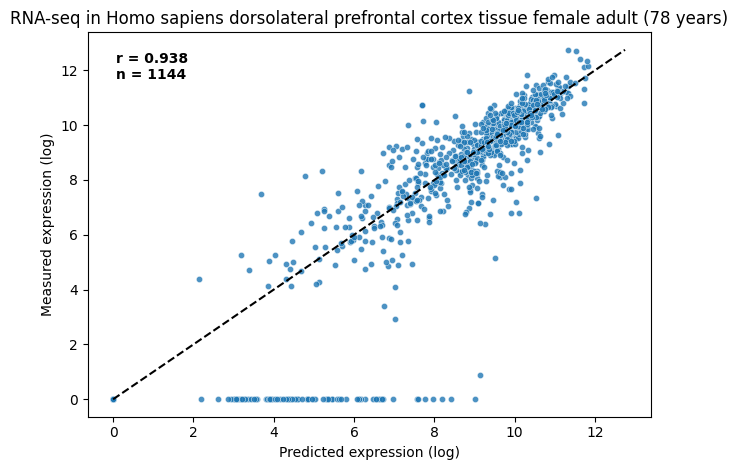

['ACOD1', 'ADAM18', 'ADAM2', 'AGXT2', 'ALKAL1', 'C2orf78', 'CBY2', 'IDO1', 'IDO2', 'KCNU1', 'LCN9', 'MROH2B', 'NOX3', 'OR2A4', 'OR5AS1', 'OR8J2', 'ORM1', 'POTEA', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'RAET1L', 'SLC15A1', 'SLC22A16', 'SLC28A3', 'SPATA31C2', 'SPATA31D1', 'SPATA31D3', 'TAAR1', 'TNFSF11', 'UGT3A1', 'WNT3A']


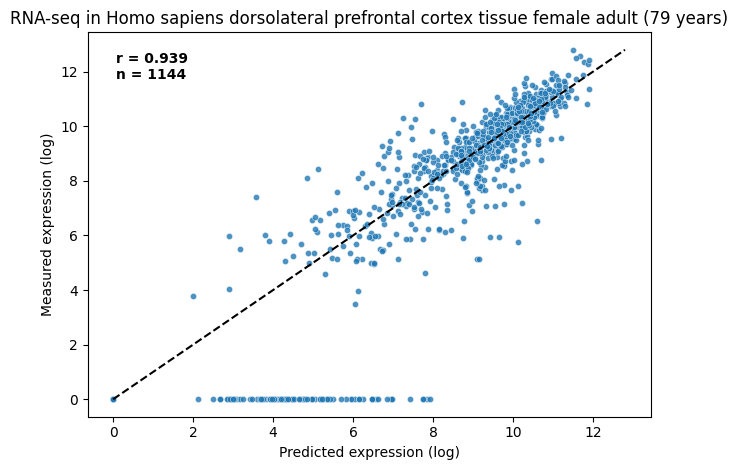

['ACTL7B', 'ADAM18', 'ADAM7', 'AGXT2', 'ANKRD30B', 'BMP10', 'C6orf118', 'CDH18', 'CNMD', 'CTNNA2', 'DIRAS2', 'FABP7', 'FAM216B', 'FBXO16', 'FOXI3', 'FSHB', 'GABBR2', 'GPR6', 'GRIN3A', 'H2AL3', 'H2AP', 'H3Y1', 'HS3ST5', 'KCNA4', 'KLHL1', 'LCN9', 'LRRTM4', 'MARCHF11', 'MAS1', 'MCHR2', 'MYMK', 'NYX', 'OPRK1', 'OPRM1', 'OR2A4', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'REG3G', 'ROS1', 'SIAH3', 'SLITRK1', 'SMIM28', 'SOHLH1', 'SPATA31E1', 'TAAR1', 'TAS2R1', 'TMEM270', 'TXNDC8', 'UGT3A1', 'UGT3A2']


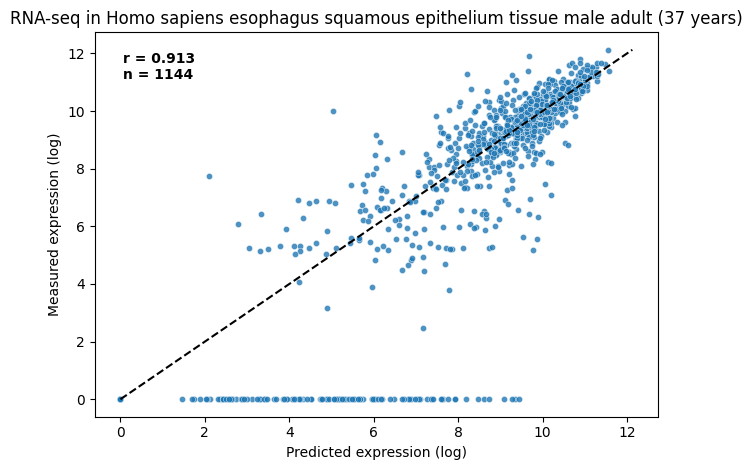

['ACTL7A', 'ACTL7B', 'ADAM7', 'AGBL2', 'ALKAL1', 'ANO3', 'ARL4AP5', 'BBOX1', 'BDNF', 'BMP10', 'BRINP1', 'C5', 'C6orf118', 'CALN1', 'CCDC180', 'CCDC73', 'CDCA2', 'CDH10', 'CDH18', 'CLDN20', 'CTNND2', 'CTSV', 'DBH', 'DCDC1', 'DCT', 'DIAPH3', 'DIRAS2', 'DKK4', 'EFHC2', 'FAM163B', 'FAM216B', 'FBXO16', 'FOXI3', 'FRRS1L', 'GABBR2', 'GJC2', 'GPC5', 'GRM1', 'HS3ST5', 'HTRA4', 'KCNA4', 'KCTD4', 'KLHL1', 'LCN9', 'LRRC4C', 'LRRTM1', 'LZTS1', 'MARCHF11', 'MAS1', 'MBOAT4', 'MROH2B', 'MUC15', 'MYMK', 'NALCN', 'NDP', 'NUTM1', 'NYX', 'OPRK1', 'ORM1', 'ORM2', 'PCDH8', 'PPP1R2C', 'PRR20E', 'RAET1G', 'RGS20', 'ROPN1L', 'RP1', 'SCEL', 'SCML4', 'SLC22A16', 'SLC22A2', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SLITRK6', 'SMIM28', 'SMLR1', 'SOHLH1', 'SPDYE21', 'ST18', 'SUSD3', 'SYT10', 'TAAR1', 'TMEM181', 'TNFSF8', 'TSPAN18', 'ULBP1', 'ULBP2', 'VNN2', 'WNT3A', 'XKR4']


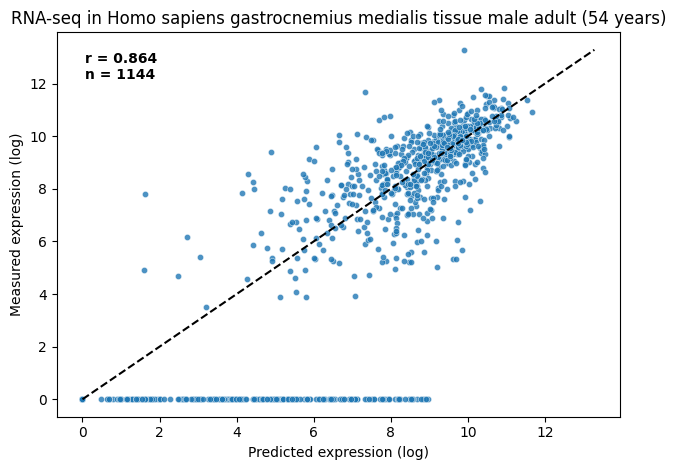

['ACOD1', 'ADAM18', 'ADAM7', 'ADGB', 'AGXT2', 'ANKRD30B', 'C5', 'C6orf118', 'CALN1', 'CDH18', 'DBH', 'DCDC1', 'DIRAS2', 'EXTL3', 'FABP7', 'FAM163B', 'FAM216B', 'FBP2', 'FCN2', 'FOXI3', 'GPR6', 'H3Y1', 'HS3ST5', 'HTRA4', 'IYD', 'KCNT1', 'KIF12', 'KIF25', 'LCN9', 'LZTS1', 'MARCHF11', 'MAS1', 'MCHR2', 'MYMK', 'NDP', 'NPBWR1', 'NUTM1', 'NYX', 'OPRK1', 'ORM1', 'ORM2', 'PACRG', 'PCDH8', 'PLPPR1', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'REG3G', 'ROS1', 'RP1', 'SAMD3', 'SIAH3', 'SLC22A2', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SMIM28', 'SMLR1', 'SOHLH1', 'SPATA31C1', 'TAAR1', 'TEX53', 'TRDN', 'UGT3A1', 'VGLL2']


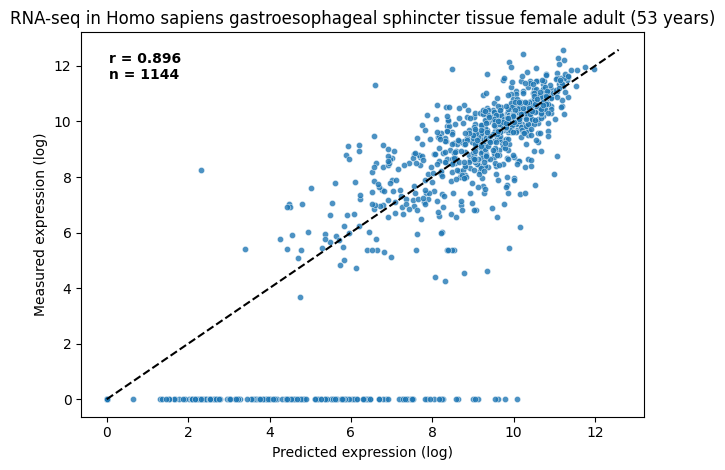

['ACOD1', 'ACTL7B', 'ADAM7', 'AGXT2', 'ALKAL1', 'ANKRD30B', 'BMP10', 'CLDN3', 'EVA1A', 'FAM163B', 'FAM216B', 'FOXI3', 'GPR6', 'H2AL3', 'H2AP', 'HS3ST5', 'IDO1', 'KIF12', 'KIF25', 'LCN9', 'MARCHF11', 'MAS1', 'MCHR2', 'MYMK', 'NDP', 'NYX', 'PPDPFL', 'PPP1R14C', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'REG3G', 'SIAH3', 'SLC35D3', 'SLCO6A1', 'SLITRK1', 'SOHLH1', 'SPATA31C1', 'TAAR1', 'TAS2R1', 'UNC5D', 'VGLL2', 'WNT3A']


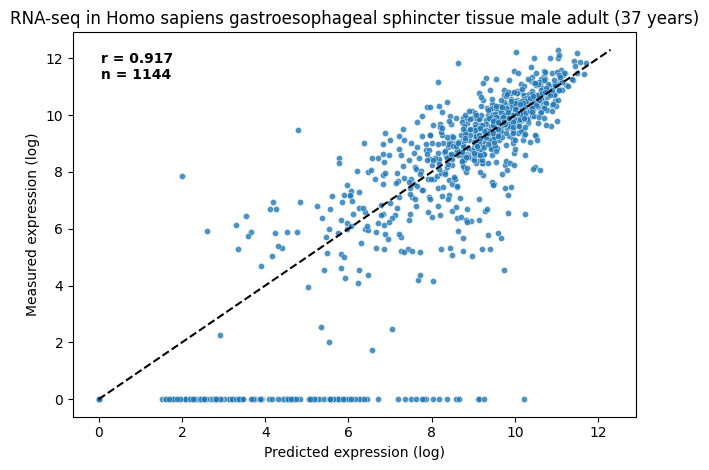

['ADAM7', 'AGXT2', 'ALKAL1', 'ANKRD30B', 'C6orf118', 'CALN1', 'CAPSL', 'CDH10', 'CDH18', 'CDH9', 'CTAGE9', 'CTNNA2', 'DIRAS2', 'DKK4', 'FABP7', 'FOXI3', 'GKN1', 'GPR6', 'H3Y1', 'HS3ST5', 'IYD', 'KLHL1', 'LCN9', 'LRRTM1', 'MCHR2', 'MROH2B', 'MUC15', 'NAT8', 'NEFL', 'NEFM', 'NPBWR1', 'NUTM1', 'NXNL2', 'NYX', 'OPRK1', 'OPRM1', 'OR2A4', 'ORM1', 'OXGR1', 'PLPPR1', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'RASEF', 'ROS1', 'SCEL', 'SLC15A1', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SMIM28', 'SOHLH1', 'SPATA31C1', 'SPATA31E1', 'SYT10', 'TAAR1', 'TAS2R1', 'TEX48', 'TEX53', 'TNFSF11', 'UGT3A1', 'WNT3A']


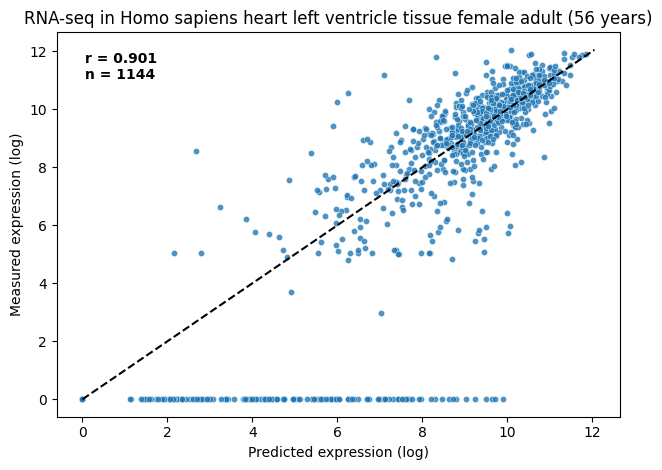

['ACTL7A', 'ADAM18', 'ADAM7', 'ALKAL1', 'AMBP', 'ANO3', 'APBA2', 'C5', 'C6orf118', 'CDH10', 'CDH12', 'CDH18', 'CDH9', 'DIRAS2', 'DKK4', 'ENTREP2', 'FOXI3', 'FRMD1', 'GPR6', 'HS3ST5', 'HTR2A', 'IYD', 'KLHL1', 'LCN9', 'LRRTM1', 'MAS1', 'MCHR2', 'MUC15', 'MYMK', 'NAT8', 'NPBWR1', 'NXNL2', 'NYX', 'OPRK1', 'OPRM1', 'ORM1', 'ORM2', 'PCDH8', 'PLPPR1', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'REG3G', 'ROPN1L', 'RP1', 'SLC15A1', 'SLC22A2', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SMIM28', 'SPATA31C1', 'SPATA31E1', 'TEX53', 'TMEM181', 'TMEM200A', 'TNFSF11', 'UNC5D']


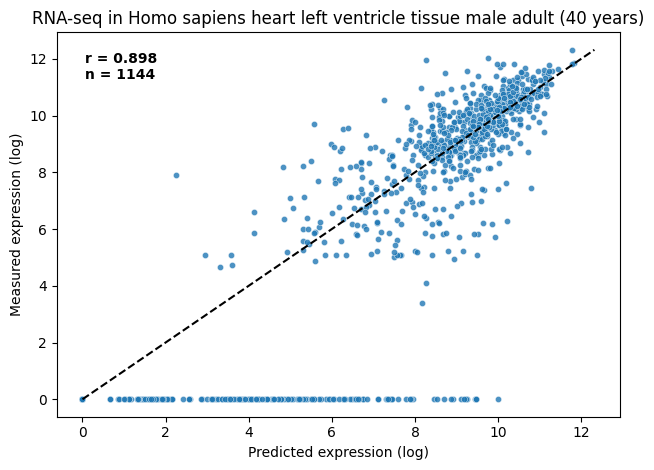

['ACOD1', 'ACTL7B', 'ADAM2', 'ALKAL1', 'C6orf118', 'CBY2', 'FABP7', 'FOXI3', 'FSHB', 'GKN2', 'H3Y1', 'KCNU1', 'KLHL1', 'LCN9', 'MCHR2', 'MYMK', 'NYX', 'OR13C2', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20E', 'RAET1L', 'REG1A', 'REG3G', 'SLC35D3', 'SLITRK1', 'SOHLH1', 'SPATA31C1', 'TEX48', 'TMEM68', 'WNT3A']


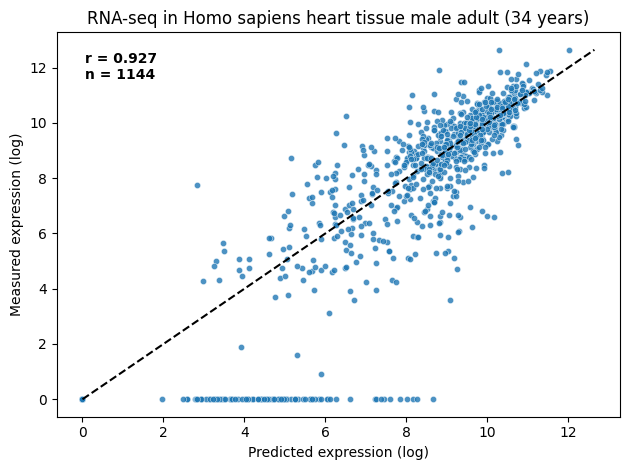

['ACTG2', 'ADAM7', 'AGXT2', 'ANO3', 'BBOX1', 'C6orf118', 'CCDC180', 'CDH12', 'CDH9', 'CLDN3', 'CTAGE9', 'DACT2', 'EGFLAM', 'FCN2', 'FIBIN', 'FOXI3', 'FRRS1L', 'GABBR2', 'GHR', 'GPR31', 'GRIN3A', 'HTR2A', 'IDO2', 'IL20RA', 'KCNA4', 'LCN9', 'LRRTM1', 'LRRTM4', 'LZTS1', 'MAOB', 'MROH2B', 'MXRA5', 'MYCT1', 'NALCN', 'NEFL', 'NPBWR1', 'OR2A4', 'PCDH20', 'PCDH8', 'PPP1R2C', 'RAB32', 'ROS1', 'SERP2', 'SFRP1', 'SLCO4C1', 'SLCO6A1', 'SOHLH1', 'SPATA31C1', 'SPIN3', 'SVEP1', 'TCIM', 'THEMIS', 'TJP1', 'TMEM181', 'UGGT2', 'VIP']


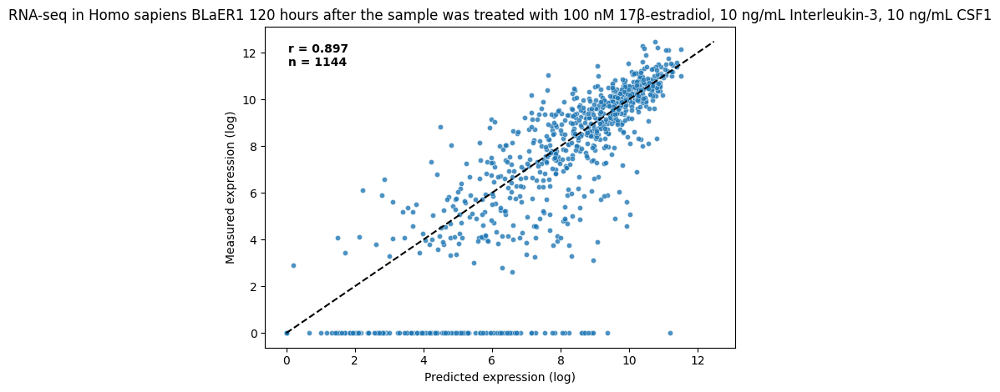

['ACTL7B', 'ADAM18', 'ADAM7', 'AGXT2', 'ALKAL1', 'BMP10', 'C5', 'CALN1', 'CDH10', 'CDH12', 'CDH18', 'CDH9', 'CNMD', 'CTNNA2', 'FABP7', 'FAM163B', 'FOXI3', 'GABBR2', 'GPR6', 'GRIN3A', 'H2AL3', 'H2AP', 'HS3ST5', 'IYD', 'KLHL1', 'LCN9', 'MARCHF11', 'NEFL', 'NPBWR1', 'NYX', 'OLFM4', 'OPRK1', 'OPRM1', 'OR2A4', 'PLPPR1', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'RAET1L', 'REG1A', 'REG3G', 'SLC22A2', 'SLC35D3', 'SLCO6A1', 'SLITRK1', 'SLITRK6', 'SOHLH1', 'SYT10', 'TAAR1', 'TAS2R1', 'TNFSF11', 'ULBP1', 'VGLL2', 'WNT3A']


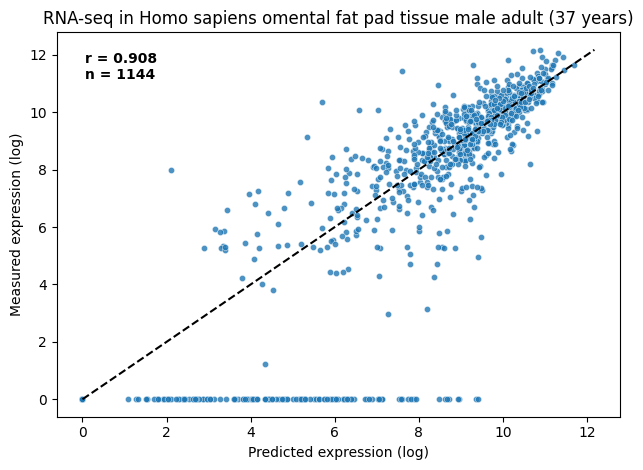

['ACOD1', 'ADAM18', 'ADGB', 'AGXT2', 'ALKAL1', 'ANKRD30B', 'BBOX1', 'BRINP1', 'C2orf78', 'CDH9', 'CLVS2', 'CNMD', 'CORO2A', 'CTSV', 'DACT2', 'DIRAS2', 'FABP7', 'FOXI3', 'GABBR2', 'GPR6', 'H2AL3', 'H3Y1', 'HS3ST5', 'IYD', 'KCNA4', 'KLHL1', 'LCN9', 'MCHR2', 'MUC15', 'MYMK', 'NPBWR1', 'NYX', 'OPRM1', 'OR2A4', 'ORM1', 'PLPPR1', 'PNOC', 'POPDC3', 'PPDPFL', 'PPP1R14C', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'RAET1L', 'REG1A', 'REG3G', 'ROPN1L', 'SCEL', 'SLC15A1', 'SLC22A16', 'SLC22A2', 'SLC28A3', 'SLC35D3', 'SLCO6A1', 'SLITRK1', 'SLITRK6', 'SMIM28', 'SPATA31C2', 'SPATA31D1', 'SPATA31E1', 'ST18', 'SYT10', 'SYTL5', 'TNFSF11', 'ULBP2', 'UNC5D']


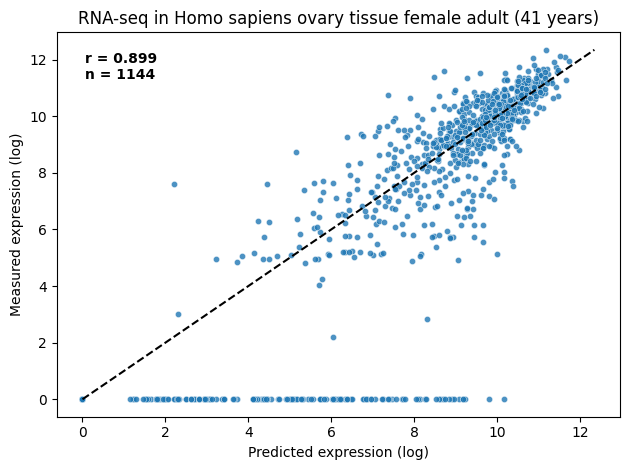

['ACOD1', 'ADAM18', 'ADGB', 'AGXT2', 'C2orf78', 'CBY2', 'CDH9', 'FSHB', 'GKN1', 'GKN2', 'GPR31', 'H2AL3', 'H3Y1', 'MCHR2', 'NYX', 'OPRK1', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'SLCO6A1', 'SPATA31C1', 'SPATA31D3', 'SPATA31E1', 'SYT10', 'UGT3A2', 'VGLL2']


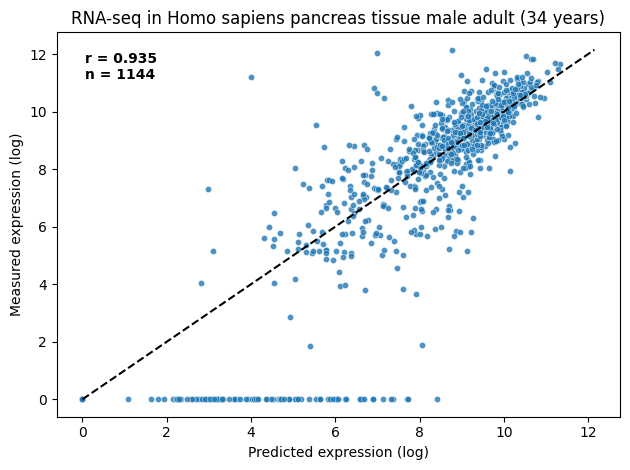

['ACTL7B', 'ADAM7', 'AMBP', 'C2orf78', 'C6orf118', 'CDH10', 'CDH9', 'FAM216B', 'FCN2', 'FSHB', 'GRIN3A', 'KCNU1', 'LCN9', 'LRRC4C', 'NEFL', 'NOX3', 'OR13C2', 'OR13C3', 'OR13C4', 'OR13C5', 'OR13C9', 'OR1J4', 'OR1L1', 'OR1N1', 'OR5AS1', 'OR8H1', 'OR8J2', 'OR8K3', 'OTC', 'PNOC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'RAET1L', 'REG1A', 'REG1B', 'REG3A', 'SLITRK5', 'SPATA31D1', 'SPATA31D3', 'TAAR1', 'TAAR2', 'TAAR5', 'TAAR6', 'TAAR8', 'TAAR9', 'UGT3A1']


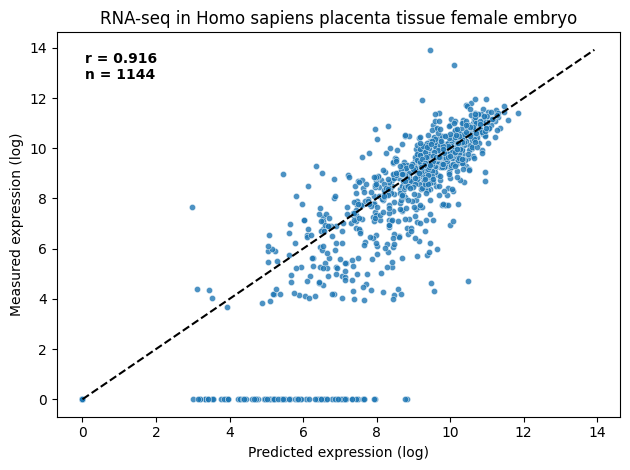

['ACTL7A', 'ADAM18', 'ADAM2', 'ADAM7', 'AGXT2', 'ALKAL1', 'ANKRD30B', 'C2orf78', 'CALN1', 'CAPSL', 'CBY2', 'CDH12', 'CDH9', 'FOXI3', 'GKN2', 'GPR6', 'H2AL3', 'H3Y1', 'HS3ST5', 'KLHL1', 'MCHR2', 'NPBWR1', 'NYX', 'OR2A4', 'PCDH8', 'PLPPR1', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'REG3G', 'SIAH3', 'SPATA31C1', 'SPATA31D1', 'SPATA31E1', 'TAAR1', 'TNFSF11', 'UGT3A1', 'WNT3A']


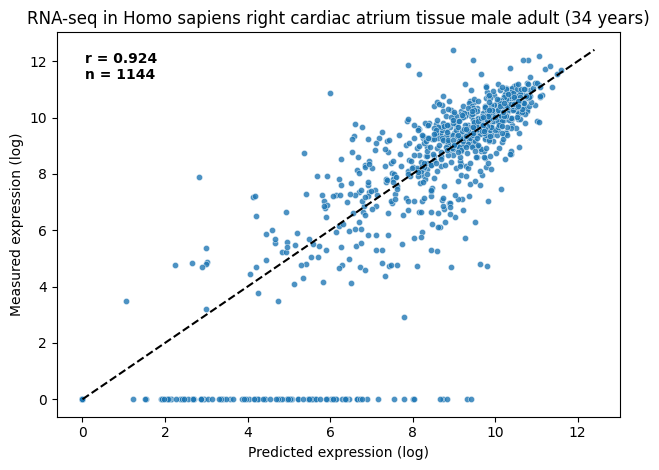

['ACOD1', 'ADAM7', 'ADGB', 'BBOX1', 'CAPSL', 'CCDC180', 'DCT', 'DIRAS2', 'DNAH5', 'FCN2', 'FSHB', 'GJC2', 'GNRH1', 'GRIN3A', 'H3Y1', 'ITGBL1', 'KLHL1', 'LCN9', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MBOAT4', 'MUC15', 'MYMK', 'NAT8', 'NKAIN2', 'NOX3', 'NPBWR1', 'NYX', 'OPRK1', 'PCDH8', 'POPDC3', 'PPP1R2C', 'PRR20A', 'RANBP3L', 'REG3G', 'ROS1', 'SLC22A16', 'SMLR1', 'SOHLH1', 'SPATA31E1', 'TAAR1', 'UGT3A1', 'UGT3A2', 'VIP', 'WNT3A', 'ZNF750']


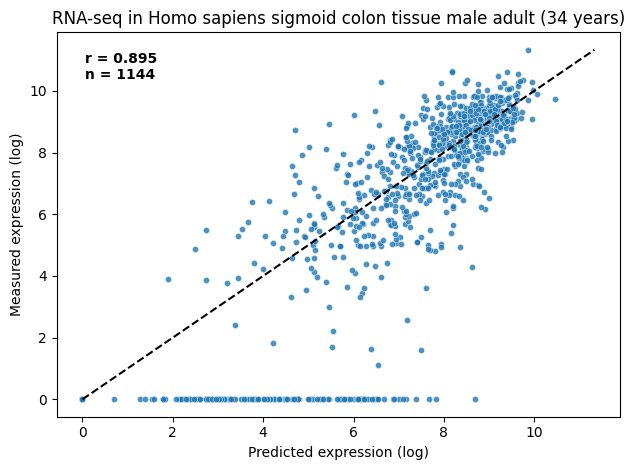

['ACOD1', 'ACTL7B', 'ADAM18', 'ADAM2', 'ALKAL1', 'C2orf78', 'CBY2', 'CYLC2', 'GKN2', 'GPR31', 'H3Y1', 'IYD', 'MYMK', 'OR2A4', 'OR8J2', 'POTEA', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'REG1A', 'SPATA31D1', 'SPATA31D3', 'TAAR6']


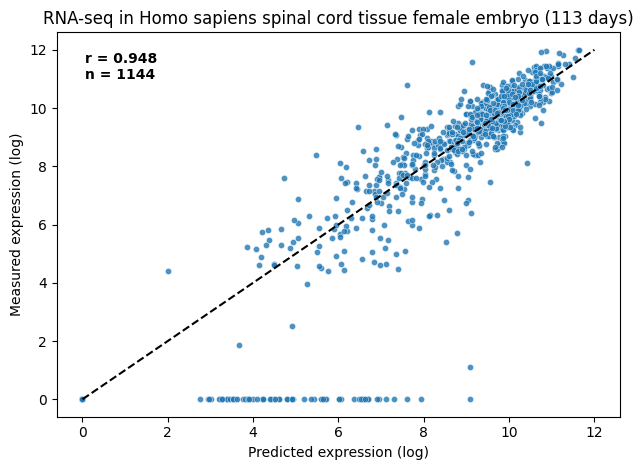

['ACTL7B', 'ADAM18', 'BMP10', 'C2orf78', 'CBY2', 'CYLC2', 'GKN1', 'H3Y1', 'LCN9', 'MYMK', 'OR5AS1', 'OR5T1', 'OR5T2', 'OR8H1', 'OR8H2', 'OR8J2', 'OR8J3', 'OR8K3', 'POTEA', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'REG1A', 'SPATA31D1', 'SPATA31D3', 'TAAR1', 'TAAR8', 'TAAR9']


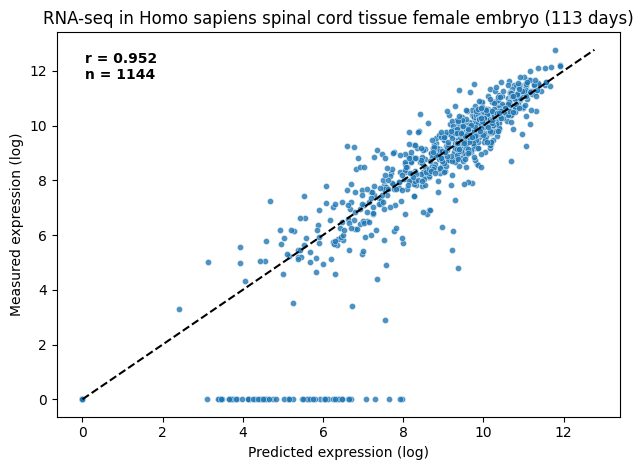

['ADAM18', 'ALKAL1', 'ANO3', 'C2orf78', 'C6orf118', 'CDH18', 'CLVS2', 'DIRAS2', 'EXTL3', 'FOXI3', 'GRIN3A', 'H3Y1', 'HS6ST3', 'KCNA4', 'LCN9', 'LRRTM1', 'MARCHF11', 'NMBR', 'OPRM1', 'OR2A4', 'PCDH8', 'PDZD2', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'RAET1L', 'SLC35D3', 'SLC5A12', 'SLITRK1', 'SMIM2', 'SPATA31C1', 'SPATA31E1', 'SYT10', 'SYTL5', 'TAAR1', 'TMEM181', 'TMEM270']


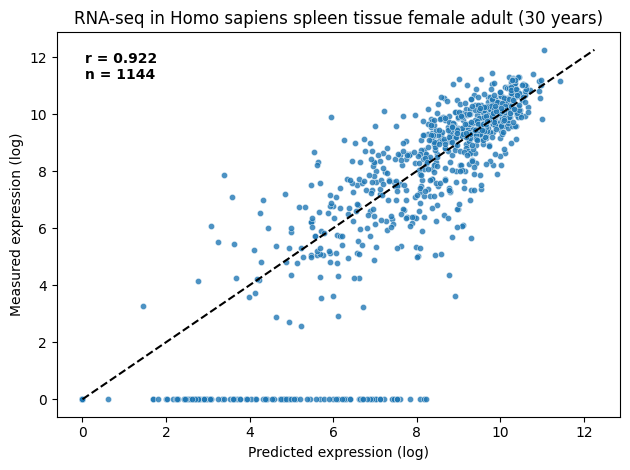

['ACTG2', 'ACTL7B', 'ADAM18', 'ALKAL1', 'C6orf118', 'C9orf152', 'CHST1', 'DACT2', 'DIRAS2', 'EVA1A', 'FABP7', 'FOXI3', 'GABBR2', 'GDNF', 'HS3ST5', 'IYD', 'KIF12', 'KIF25', 'KLHL1', 'LIMK1', 'LRRTM1', 'OLFM4', 'OR2A4', 'PBOV1', 'PCDH8', 'PHYHIP', 'POPDC3', 'PPP1R2C', 'ROS1', 'SLC15A1', 'SLC5A12', 'SLITRK5', 'SPATA31C1', 'TAAR1', 'TMEM181']


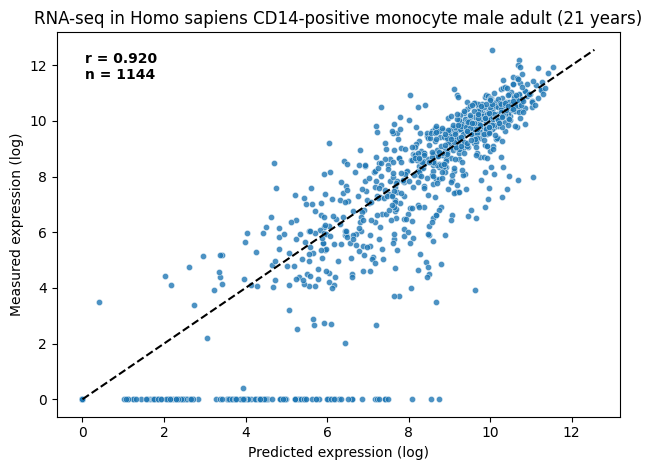

['ADAM18', 'ADAM7', 'ADAMDEC1', 'AGXT2', 'ALKAL1', 'BBOX1', 'BMP10', 'BRINP1', 'CCDC73', 'CDCA2', 'CDH10', 'CDH12', 'CDH18', 'CDH9', 'CORO2A', 'CTNND2', 'CTSV', 'CYP26B1', 'DBH', 'DIAPH3', 'DKK4', 'ENTREP2', 'EXTL3', 'FABP7', 'FAM163B', 'FBP2', 'FOXI3', 'GPC5', 'GPR6', 'GRIN3A', 'GRM1', 'HS3ST5', 'HTRA4', 'IYD', 'KCNA4', 'KIF18A', 'KLHL1', 'LCN9', 'LRRC4C', 'LRRTM1', 'LZTS1', 'MARCHF11', 'MCHR2', 'MUC15', 'MYMK', 'NAT8', 'NEFL', 'NEFM', 'NPBWR1', 'NUTM1', 'NYX', 'OLFM4', 'OPRK1', 'OPRM1', 'OR2A4', 'ORM1', 'OXGR1', 'PCDH8', 'PEBP4', 'PLPPR1', 'PPP1R14C', 'PPP1R2C', 'RAET1G', 'REG1A', 'REG3G', 'RETREG1', 'ROS1', 'SARDH', 'SCEL', 'SERAC1', 'SLC15A1', 'SLC16A10', 'SLC22A16', 'SLC22A2', 'SLC28A3', 'SLC35D3', 'SLC5A12', 'SLCO4C1', 'SLCO6A1', 'SLITRK1', 'SLITRK6', 'SMLR1', 'SOHLH1', 'ST18', 'SYT10', 'TEX53', 'THEMIS', 'TMEM181', 'TNFSF11', 'ULBP1', 'ULBP3', 'VGLL2', 'VNN1', 'WNT3A']


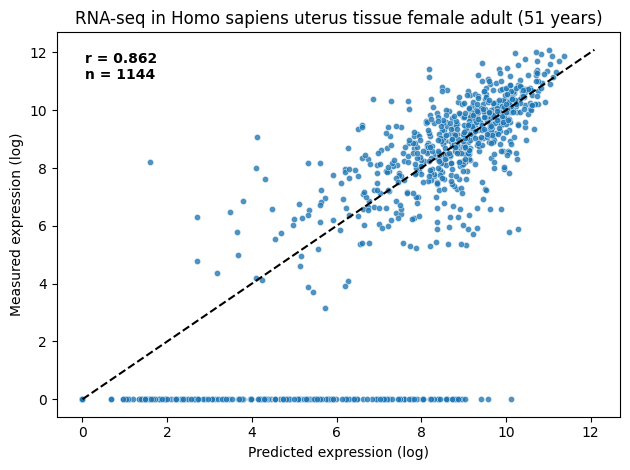

['ACOD1', 'ADAM18', 'ADAM7', 'ADAMDEC1', 'ADRA1A', 'ALKAL1', 'ANKRD30B', 'ANO3', 'BBOX1', 'C2orf78', 'C6', 'C6orf118', 'CDH9', 'CLVS2', 'CTAGE9', 'CTNNA2', 'DACT2', 'DBH', 'DIRAS2', 'EFHC2', 'FABP7', 'FBP2', 'FOXI3', 'FRMD1', 'GALNT17', 'GPR6', 'GRIN3A', 'H2AL3', 'H2AP', 'IYD', 'KCNA4', 'KLHL1', 'LIMK1', 'LRRC4C', 'LRRTM4', 'LZTS1', 'MAOB', 'MCHR2', 'MUC15', 'NYX', 'OLFM4', 'OPRK1', 'OR2A4', 'ORM1', 'OXGR1', 'PCDH20', 'PCDH8', 'PPP1R14C', 'PPP1R2C', 'PRLR', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'ROS1', 'SCML4', 'SLC28A3', 'SLC35D3', 'SLC5A12', 'SLCO4C1', 'SLCO6A1', 'SLITRK1', 'SLITRK5', 'SLITRK6', 'SOHLH1', 'SPATA31E1', 'ST18', 'SYT10', 'TAAR1', 'THEMIS', 'TNFSF11', 'TRDN', 'UNC5D', 'VGLL2', 'VNN2', 'XKR4']


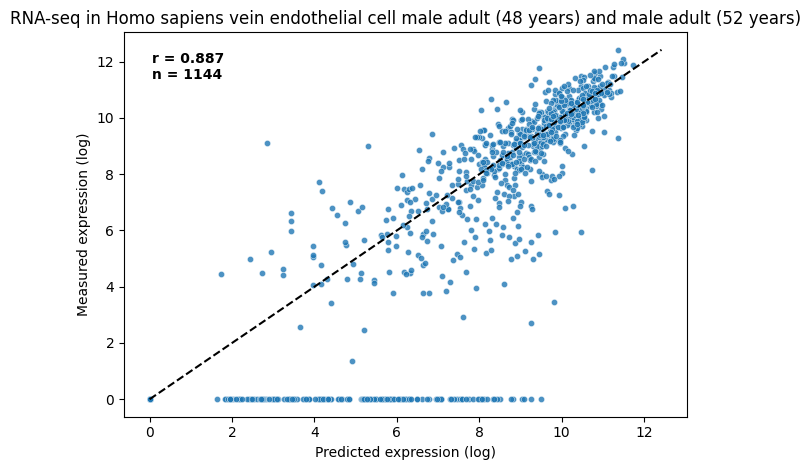

['ADAM18', 'ADAM2', 'ALKAL1', 'C5', 'CORO2A', 'H2AP', 'KCNU1', 'MYMK', 'NOX3', 'NYX', 'OR2A4', 'OR5AS1', 'OR8J2', 'ORM1', 'POTEA', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'RAET1L', 'SLCO6A1', 'SMIM28', 'SPATA31D1', 'SPATA31D3', 'TAAR1', 'TAAR6', 'UGT3A1', 'WNT3A']


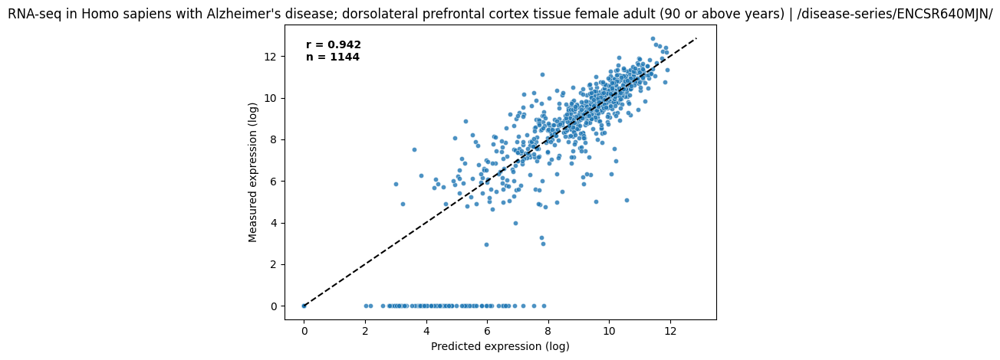

['ADAM18', 'ADAM2', 'AGXT2', 'BMP10', 'FAM216B', 'FRMD1', 'H2AL3', 'IDO1', 'IDO2', 'IYD', 'KCNU1', 'NOX3', 'OR13C4', 'OR13C8', 'OR13C9', 'OR2A4', 'OR5AS1', 'OR8J2', 'OR8J3', 'ORM1', 'POTEA', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'PRSS38', 'RAET1L', 'SLC22A2', 'SMIM28', 'SPATA31D1', 'SPATA31D3', 'TAAR1', 'TAAR5', 'TNFSF11', 'UGT3A1', 'VGLL2']


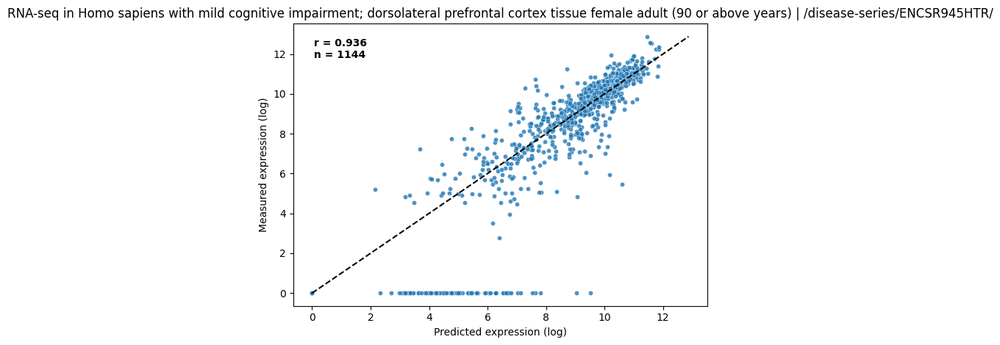

['ACOD1', 'ACTL7B', 'ADAMDEC1', 'ADAMTSL2', 'ADGB', 'ADRA1A', 'ANGPTL2', 'ANO3', 'C2orf78', 'CALN1', 'CDH18', 'CTAGE9', 'CTNND2', 'DBH', 'DKK4', 'FABP7', 'FAM163B', 'FAM216B', 'FIBIN', 'FOXI3', 'GPR183', 'HS3ST5', 'HS6ST3', 'HTR2A', 'KLHL1', 'LCN9', 'LRRC4C', 'LRRTM1', 'MARCHF11', 'MCHR2', 'MPPED2', 'MXRA5', 'NYX', 'OPRK1', 'OPRM1', 'ORM1', 'PAMR1', 'PCDH20', 'PCDH8', 'PLN', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'SAMD3', 'SCML4', 'SIAH3', 'SLC1A3', 'SLC22A16', 'SLC5A12', 'SLITRK1', 'SMOC2', 'SOHLH1', 'SYT10', 'TAAR1', 'THBS2', 'THEMIS', 'THNSL2', 'TMEM181', 'TNFSF11', 'VIP', 'WNT3A']


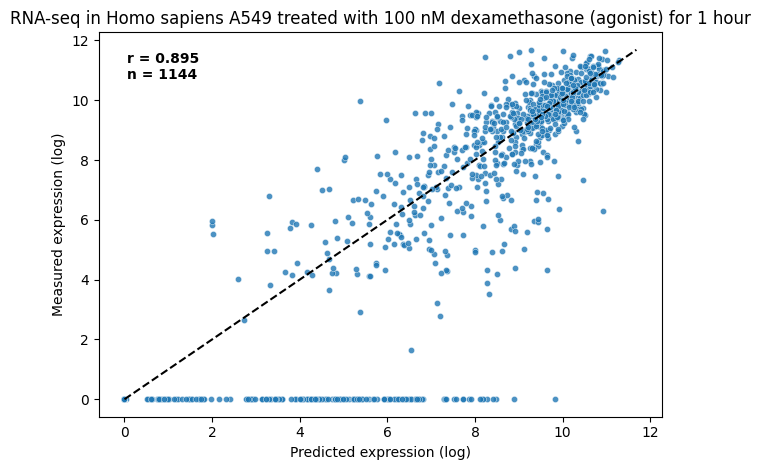

['ADAM18', 'ADAM7', 'ADAMDEC1', 'ADRA1A', 'ALKAL1', 'BMP10', 'BRINP1', 'C5', 'CBY2', 'CDH10', 'CDH9', 'CTAGE9', 'CTNNA2', 'DACT2', 'DBH', 'DKK4', 'ENPP3', 'FAAH2', 'FABP7', 'FAM163B', 'FAM216B', 'FCN1', 'GALNT17', 'GGTA1', 'GHR', 'GPR6', 'GRIN3A', 'GRM1', 'H2AP', 'HS3ST5', 'IER5L', 'KCNU1', 'KIF25', 'LCN9', 'LRRC4C', 'LRRTM1', 'MCHR2', 'MYMK', 'NUTM1', 'NYX', 'OLFM4', 'OPRM1', 'OR8J2', 'ORM2', 'PACRG', 'PLPPR1', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'RSPO3', 'SAMD3', 'SCML4', 'SLC15A1', 'SLC22A16', 'SLC5A12', 'SLCO4C1', 'SLITRK6', 'SMOC2', 'SPATA31C1', 'SPATA31D3', 'SPATA31E1', 'SPIN2A', 'ST18', 'SYT10', 'TAAR1', 'THEMIS', 'THNSL2', 'TMEM181', 'TMEM200A', 'TNFSF11', 'UGT3A1', 'VGLL2', 'WNT3A']


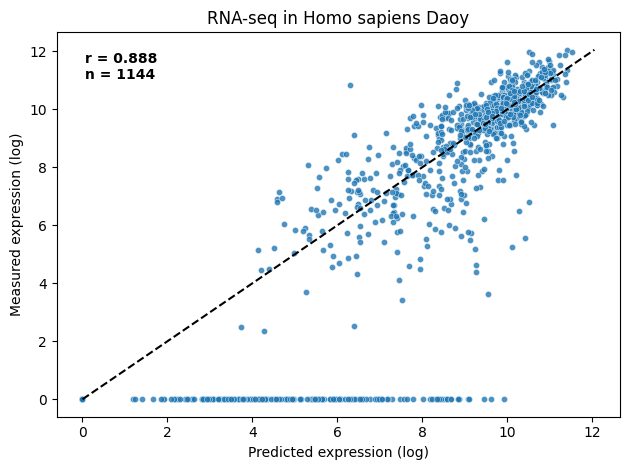

['ACOD1', 'ACTL7B', 'ADAMDEC1', 'ADRA1A', 'C6orf118', 'CBY2', 'CYBB', 'DIRAS2', 'FAM163B', 'H2AL3', 'H2AP', 'H3Y1', 'IDO1', 'KLHL1', 'LANCL3', 'LCN9', 'LRRTM4', 'MARCHF11', 'MYMK', 'NAT8', 'NPBWR1', 'OLFM4', 'OXGR1', 'PCDH20', 'PCDH8', 'PNOC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'SCEL', 'SLCO4C1', 'SLCO6A1', 'SMIM28', 'SPATA31D3', 'SYK', 'SYT10', 'TEX53', 'THNSL2', 'TRDN', 'WNT3A', 'XKR4']


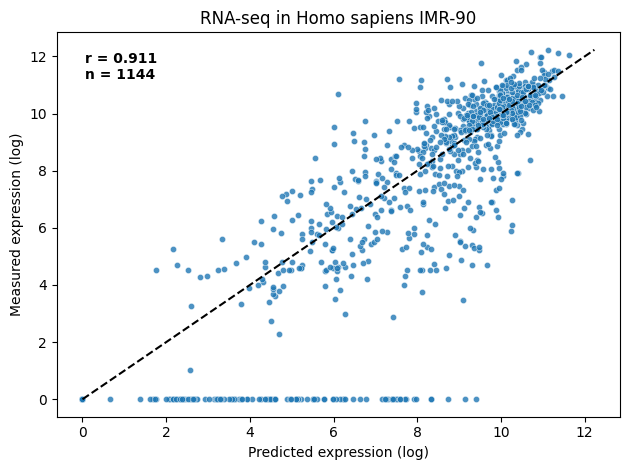

['ADAM18', 'ADAM7', 'ADAMDEC1', 'ADRA1A', 'AGXT2', 'ANKRD30B', 'BMP10', 'CBY2', 'CLVS2', 'CTAGE9', 'DACT2', 'DAPK1', 'DIRAS2', 'FABP7', 'FBP1', 'FBP2', 'FGD3', 'FOXI3', 'GALNT17', 'GRIN3A', 'HS6ST3', 'IDO1', 'IYD', 'KCNA4', 'KLHL1', 'LRRC63', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MROH2B', 'MUC15', 'MYMK', 'NPBWR1', 'NYX', 'OPRK1', 'OPRM1', 'OR13C9', 'OR2A4', 'PBOV1', 'PCDH20', 'PCDH8', 'PDZD2', 'PLPPR1', 'PNOC', 'PPP1R14C', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'SCEL', 'SIAH3', 'SLC22A16', 'SLC35D3', 'SLC5A12', 'SLCO4C1', 'SLCO6A1', 'SMOC2', 'SOHLH1', 'SPATA31C1', 'SPATA31D1', 'SPATA31D3', 'ST18', 'SYK', 'SYT10', 'TAAR1', 'TEX48', 'THNSL2', 'TNFSF11', 'TRDN', 'TSPAN7', 'UNC5D', 'VGLL2', 'WNK2', 'WNT3A']


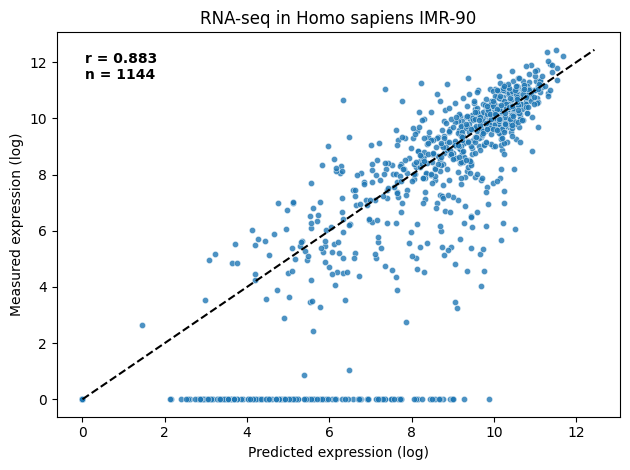

['ACOD1', 'ADAM7', 'ADAMDEC1', 'ADRA1A', 'ALKAL1', 'ANKRD30B', 'AUTS2', 'BRINP1', 'C5', 'C6', 'C6orf118', 'CAPSL', 'CCN2', 'CDH10', 'CLDN10', 'CYLC2', 'DIRAS2', 'EVA1A', 'FAM163B', 'FAM216B', 'FBP1', 'FCN2', 'FNDC1', 'FOXI3', 'FSHB', 'GDNF', 'GHR', 'GKN1', 'GKN2', 'GPR6', 'GRIN3A', 'H3Y1', 'HS3ST5', 'HS6ST3', 'HTR2A', 'IL20RA', 'KCNA4', 'KCNU1', 'KIF12', 'LACC1', 'LRRC4C', 'LZTS1', 'MARCHF11', 'MAS1', 'MCHR2', 'MOXD1', 'MROH2B', 'MXRA5', 'MYMK', 'NAT8', 'NDP', 'NEFL', 'NPBWR1', 'OLFM4', 'OR10AG1', 'OR13C2', 'OR13C3', 'OR13C9', 'OR1J4', 'OR1N1', 'OR4C11', 'OR5AS1', 'OR8H1', 'OR8J2', 'OR8K3', 'ORM2', 'PAMR1', 'PCDH17', 'PCDH20', 'PCDH8', 'PLPPR1', 'PPP1R2C', 'PRLR', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'PTPN3', 'REG1A', 'REG1B', 'REG3A', 'SCEL', 'SCML4', 'SFRP1', 'SIAH3', 'SLC15A1', 'SLC22A16', 'SLC28A3', 'SLC35D3', 'SMIM28', 'SPATA31D1', 'SPATA31D3', 'ST18', 'TAAR1', 'TAAR9', 'TCIM', 'THEMIS', 'THNSL2', 'TMEM270', 'TNFRSF10C', 'TXNDC8', 'UGT3A2', 'VGLL2', 'WNT3A']

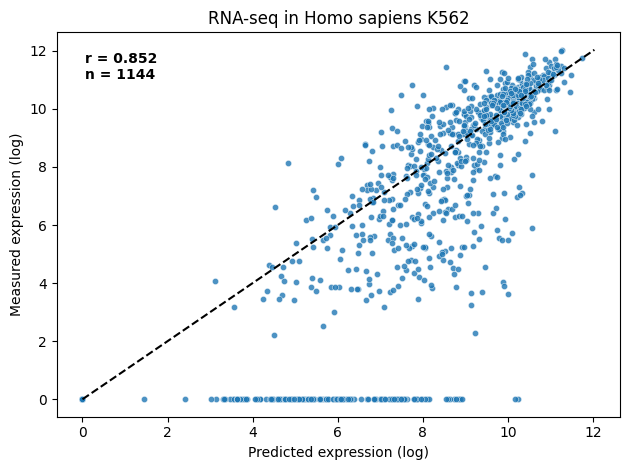

['ACOD1', 'ADAM2', 'ADAM7', 'AGXT2', 'ALKAL1', 'C5', 'C6orf118', 'CAPSL', 'CYLC2', 'FAM163B', 'FSHB', 'GHR', 'GKN2', 'GPR6', 'GRIN3A', 'H2AL3', 'H3Y1', 'HS3ST5', 'HS6ST3', 'HTR2A', 'KCNU1', 'LCN9', 'LRRC4C', 'LZTS1', 'MARCHF11', 'MAS1', 'MROH2B', 'MUSK', 'MYMK', 'NPBWR1', 'OR10AG1', 'OR13C2', 'OR13C3', 'OR13C9', 'OR1N1', 'OR4C11', 'OR4S2', 'OR5AS1', 'OR5F1', 'OR5T1', 'OR5T2', 'OR8H1', 'OR8H2', 'OR8J2', 'OR8J3', 'OR8K3', 'PCDH8', 'PDE7B', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'SIAH3', 'SLC35D3', 'SMIM28', 'SPATA31D1', 'SPATA31D3', 'TAAR1', 'TAAR9', 'TAS2R1', 'TNFSF11', 'TXNDC8', 'UGT3A1', 'VGLL2']


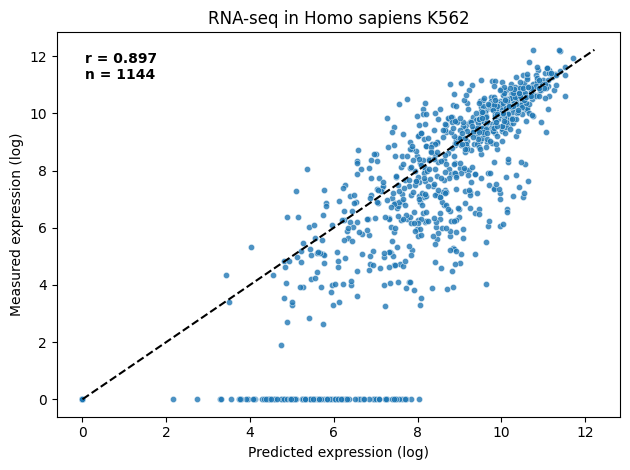

['ACTL7B', 'ADAM18', 'ADGB', 'ALKAL1', 'ANKRD30B', 'ANO3', 'BMP10', 'C2orf78', 'DCT', 'EXTL3', 'FABP7', 'FAM163B', 'FCN1', 'GALNT17', 'GDNF', 'GPR6', 'H2AL3', 'H2AP', 'HTR2A', 'LCN9', 'LRRTM1', 'LZTS1', 'MARCHF11', 'MYMK', 'PCDH8', 'PNOC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'SIAH3', 'SLC28A3', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SOHLH1', 'SPATA31C1', 'SPATA31C2', 'SPATA31E1', 'SYT10', 'TNFSF11', 'UNC5D', 'VGLL2', 'VIP']


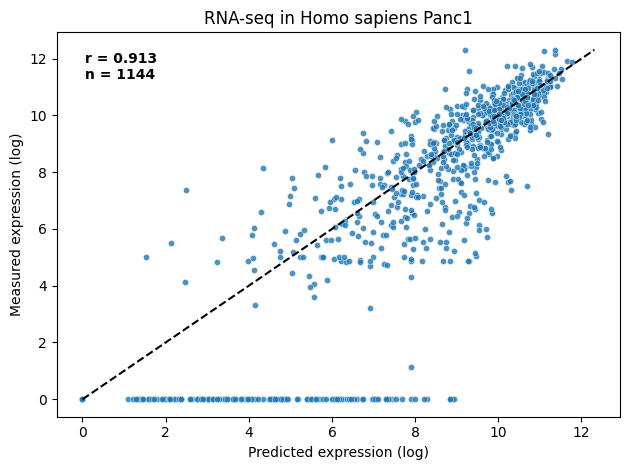

['ACOD1', 'ACTL7B', 'ADAMDEC1', 'ADRA1A', 'BBOX1', 'C2orf78', 'C6', 'C9orf152', 'CNMD', 'COL15A1', 'CTAGE9', 'CYBB', 'CYLC2', 'DACT2', 'FCN1', 'FCN2', 'FNDC1', 'FOXI3', 'FRMD1', 'FSHB', 'GDNF', 'GHR', 'GPR31', 'KIF12', 'LCN9', 'MAOB', 'MCHR2', 'NDP', 'NOX3', 'OLFM4', 'OR2A4', 'OR5AS1', 'OR8J2', 'ORM2', 'OTC', 'PEBP4', 'PPDPFL', 'PPP1R14C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRG4', 'PRSS38', 'PTGS1', 'RAB32', 'RAET1L', 'REG1A', 'ROPN1L', 'RP1', 'RSPO3', 'SAMD3', 'SAMD5', 'SLC15A1', 'SLC28A3', 'SOHLH1', 'SPATA31D3', 'STX11', 'SYK', 'TAAR1', 'TAAR6', 'THBS2', 'THEMIS', 'TLR4', 'TNFSF15', 'TNFSF8', 'VGLL2', 'WNT3A']


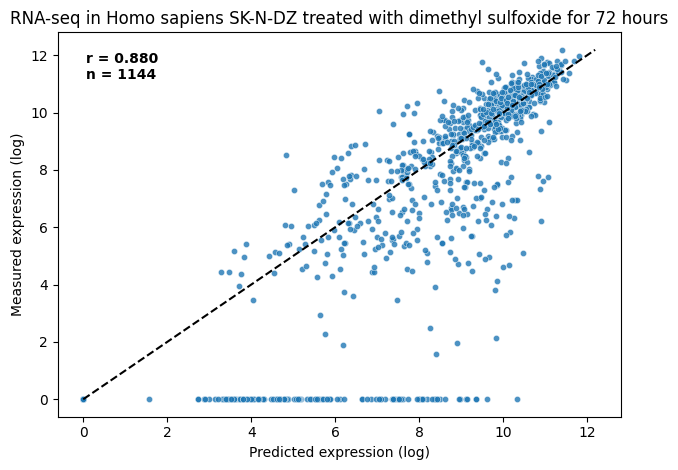

['ACTL7B', 'ADAM18', 'ADGB', 'ADRA1A', 'AGXT2', 'ALKAL1', 'ANKRD30B', 'BMP10', 'C6orf118', 'CDH12', 'CDH9', 'CLDN20', 'CLVS2', 'COL10A1', 'DIRAS2', 'DKK4', 'EXTL3', 'FABP7', 'FAM163B', 'FAM216B', 'FCN2', 'FOXI3', 'GABBR2', 'GDNF', 'GPR18', 'GPR6', 'H3Y1', 'HS3ST5', 'KCNA4', 'KLHL1', 'LCN9', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MAS1', 'MCHR2', 'MYMK', 'NEFL', 'NKAIN2', 'NPBWR1', 'NUTM1', 'NYX', 'OPRK1', 'OXGR1', 'PACRG', 'PCDH8', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'ROPN1L', 'ROR2', 'SCML4', 'SLC28A3', 'SLITRK1', 'SLITRK6', 'SMIM28', 'SMLR1', 'SOHLH1', 'SPATA31C1', 'SPATA31E1', 'ST18', 'SYT10', 'TAAR1', 'TEX53', 'THEMIS', 'TMEM181', 'TNFSF11', 'TSPAN18', 'UGT3A1', 'ULBP1', 'VGLL2']


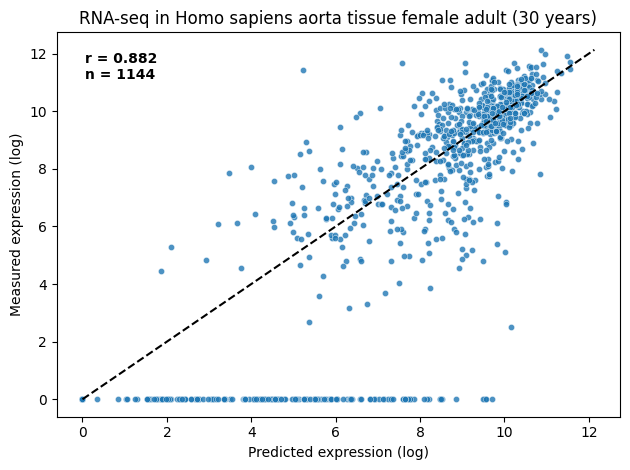

In [10]:
cors = []
cors_df = {}
for col in range(encode.shape[1]):
    sample_idx = int(encode.columns[col].split('_')[0][6:])
    y = encode.iloc[:, col]
    x = grt.iloc[:, col]
    r, _ = pearsonr(x, y)
    n = len(x)

    print([encode.index[i] for i in range(len(encode)) if encode.iloc[i, col] < 1 and grt.iloc[i, col] > 5])
    cors.append(r)
    cors_df[encode.columns[col]] = r
    sns.scatterplot(x=x, y=y, s=20, alpha=0.8)
    min_val = min(x.min(), y.min())
    max_val = max(x.max(), y.max())
    plt.plot([min_val, max_val], [min_val, max_val], linestyle='--', color='black')
    plt.text(
        0.05, 0.95,
        f"r = {r:.3f}\nn = {n}",
        transform=plt.gca().transAxes,
        fontsize=10,
        weight='bold',
        verticalalignment='top'
    )
    plt.xlabel('Predicted expression (log)')
    plt.ylabel('Measured expression (log)')
    plt.title(f"RNA-seq in {cells.loc[sample_idx, 'tissue_name']}")
    plt.tight_layout()
    plt.show()

In [11]:
with open('/project/deeprna_data/benchmark/gene_level_cross_region/correlations_fixed.pk', 'wb') as f:
    pickle.dump(cors_df, f)
print(cors_df)

{'tissue118_rna_total': 0.9375251667849795, 'tissue119_rna_total': 0.9391415203247077, 'tissue147_rna_total': 0.9127111374342508, 'tissue167_rna_total': 0.8643543191272357, 'tissue169_rna_total': 0.8959572879592822, 'tissue170_rna_total': 0.9166268260645924, 'tissue178_rna_total': 0.9007273281836661, 'tissue181_rna_total': 0.8981814247764389, 'tissue199_rna_total': 0.9273378904557648, 'tissue23_rna_polya': 0.8972898874317478, 'tissue245_rna_total': 0.9076267219778984, 'tissue249_rna_total': 0.8987402855863903, 'tissue257_rna_polya': 0.934588471990117, 'tissue262_rna_total': 0.9162378682994843, 'tissue274_rna_polya': 0.9235719879007054, 'tissue281_rna_polya': 0.895413283271521, 'tissue294_rna_polya': 0.9479309270834351, 'tissue294_rna_total': 0.9518091908858134, 'tissue295_rna_polya': 0.9217897474877769, 'tissue34_rna_polya': 0.9198329489499276, 'tissue352_rna_total': 0.8615186516727502, 'tissue356_rna_total': 0.8873344578897865, 'tissue372_rna_total': 0.9424714106127365, 'tissue390_rna

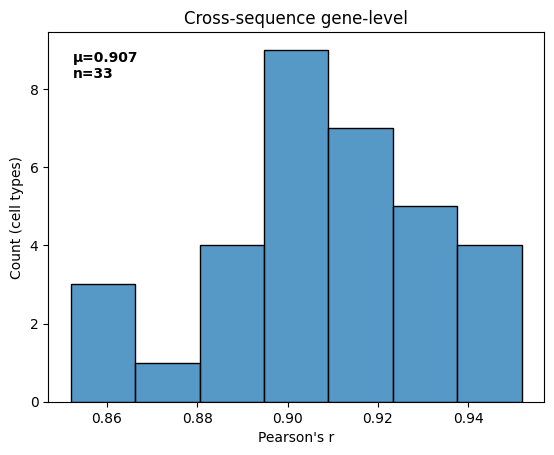

In [12]:
mu = np.mean(cors)
sns.histplot(cors)
plt.text(
    0.05, 0.95,
    f'μ={round(mu, 3)}\nn={len(cors)}',
    transform=plt.gca().transAxes,
    fontsize=10,
    weight='bold',
    verticalalignment='top')
plt.title("Cross-sequence gene-level")
plt.xlabel("Pearson's r")
plt.ylabel("Count (cell types)")
plt.show()

## Cross-both

In [13]:
## Cross-both
encode = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_both/all_true_log_expr.csv', index_col=0, header='infer')
grt = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_both/all_predicted_log_expr.csv', index_col=0, header='infer')

encode = encode.loc[encode.index.isin(coding_genes.Symbol)]
grt = grt.loc[grt.index.isin(coding_genes.Symbol)]

cors = pd.read_csv('/project/deeprna_data/benchmark/gene_level_cross_both/correlations.csv', header='infer')
cors[['pearson','log_pearson','spearman']].mean(axis=0)

pearson        0.840059
log_pearson    0.884118
spearman       0.899294
dtype: float64

['ACOD1', 'ADAM2', 'ADGB', 'ADRA1A', 'AGXT2', 'ANKRD30B', 'CBY2', 'CDH9', 'FAM216B', 'FSHB', 'GKN2', 'GPR6', 'GRIN3A', 'H3Y1', 'IDO1', 'IDO2', 'ITGBL1', 'IYD', 'KCNU1', 'KLHL1', 'LCN9', 'MAS1', 'MCHR2', 'MUC15', 'OLFM4', 'OPRM1', 'OR2A4', 'OR8J2', 'OTC', 'PBOV1', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'REG1A', 'REG3G', 'ROS1', 'SCML4', 'SLC15A1', 'SLITRK1', 'SMIM28', 'SPATA31C1', 'SPATA31D1', 'SPATA31E1', 'ST18', 'SUSD3', 'TAAR1', 'THEMIS', 'TNFSF15', 'TNFSF8', 'VGLL2', 'VIP', 'VNN1', 'VNN2']


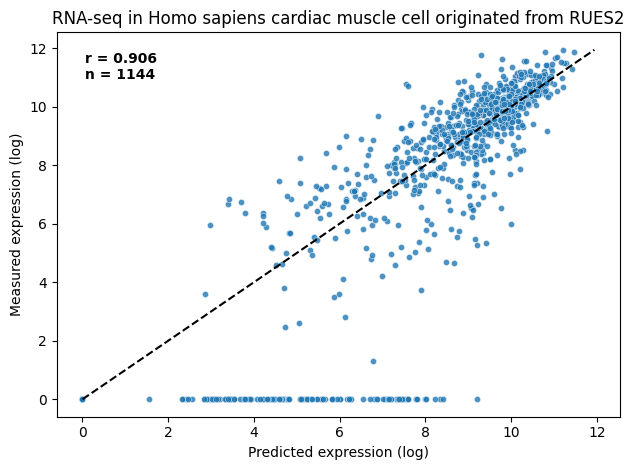

['ACTL7A', 'ACTL7B', 'ADAM28', 'ADAM7', 'ADAMDEC1', 'ADGB', 'ADRA1A', 'ANKRD30B', 'C5', 'C6orf118', 'C7', 'CALN1', 'CDH9', 'CLDN3', 'CTNNA2', 'DBH', 'DIRAS2', 'ELN', 'EYA4', 'FAM163B', 'FAM216B', 'FRMD1', 'FSHB', 'GALNT17', 'GGTA1', 'GKN2', 'GPR183', 'GPR82', 'GRIN3A', 'HS3ST5', 'HTR2A', 'IDO1', 'IPCEF1', 'IYD', 'KLHL1', 'LRRC4C', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MCHR2', 'MPPED2', 'MYCT1', 'NDP', 'NPR3', 'OLFM4', 'OPRK1', 'OPRM1', 'ORM1', 'ORM2', 'PBOV1', 'PCDH8', 'PLCXD3', 'PLN', 'PLPP7', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'REG1A', 'RSPO3', 'SCML4', 'SLC22A2', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SOHLH1', 'ST18', 'SYT10', 'TAAR1', 'TACR1', 'TCIM', 'THEMIS', 'TLR4', 'TMEM181', 'TNFSF11', 'TRDN', 'UNC5D', 'VGLL2', 'VIP']


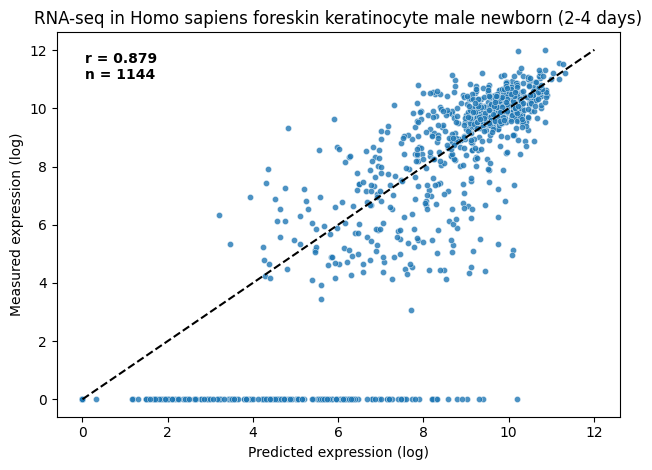

['ACTL7B', 'ADAM28', 'ADAM7', 'ADAMDEC1', 'ADAMTSL2', 'ADGB', 'ADRA1A', 'ANKRD30B', 'C5', 'C6orf118', 'CALN1', 'CDH9', 'CLVS2', 'CTNNA2', 'DBH', 'DIRAS2', 'FAM163B', 'FAM216B', 'FCN1', 'FRMD1', 'FSHB', 'GALNT17', 'GGTA1', 'GRIN3A', 'H2AL3', 'H2AP', 'HS3ST5', 'HTR2A', 'IPCEF1', 'KCNA4', 'KLHL1', 'LRRC4C', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MCHR2', 'MPPED2', 'MYCT1', 'NDP', 'OLFM4', 'OPRK1', 'OPRM1', 'ORM1', 'PBOV1', 'PCDH8', 'PDE10A', 'PLCXD3', 'PLPP7', 'PNOC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'REG1A', 'RSPO3', 'SCML4', 'SLC22A2', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SOHLH1', 'SPATA31C1', 'ST18', 'SYT10', 'TAAR1', 'TLR4', 'TMEM181', 'TNFSF11', 'TRDN', 'UGT3A1', 'UNC5D', 'VGLL2', 'VIP']


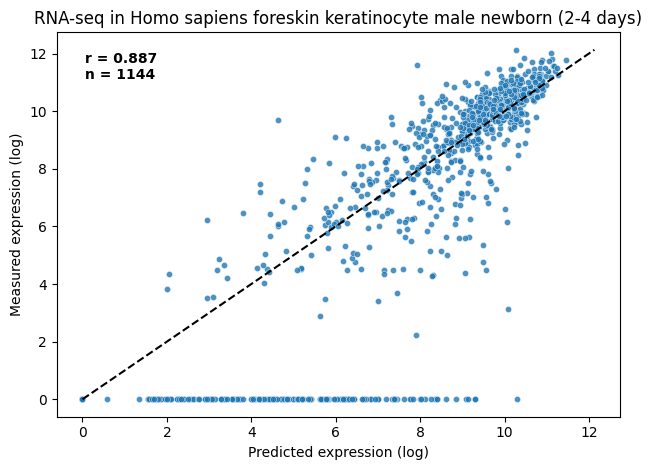

['ACOD1', 'ACTL7A', 'ACTL7B', 'ADAM28', 'ADAM7', 'ADAMDEC1', 'ADAMTS12', 'ADGB', 'ALKAL1', 'BMP10', 'C6orf118', 'C7', 'CDH9', 'CLDN20', 'CLVS2', 'CTNNA2', 'DBH', 'EYA4', 'FAM163B', 'FAM216B', 'FCN1', 'FNDC1', 'FSHB', 'GPR183', 'GRIN3A', 'GRM1', 'HS3ST5', 'HTR2A', 'ITGBL1', 'KLHL1', 'LRRC4C', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MAS1', 'MCHR2', 'METTL24', 'MPPED2', 'MUSK', 'OLFM4', 'OPRK1', 'OPRM1', 'ORM1', 'PBOV1', 'PCDH20', 'PCDH8', 'PDE10A', 'PLCXD3', 'PLN', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'REG1A', 'RSPO3', 'SCML4', 'SLC22A2', 'SLC35D3', 'SLC35F1', 'SLCO6A1', 'SLITRK1', 'SMLR1', 'SOBP', 'SOHLH1', 'ST18', 'SVEP1', 'SYT10', 'TAAR1', 'TCIM', 'THEMIS', 'TLR4', 'TMEM181', 'TMEM270', 'TNFSF8', 'UGT3A1', 'VGLL2', 'VNN2', 'XKR4']


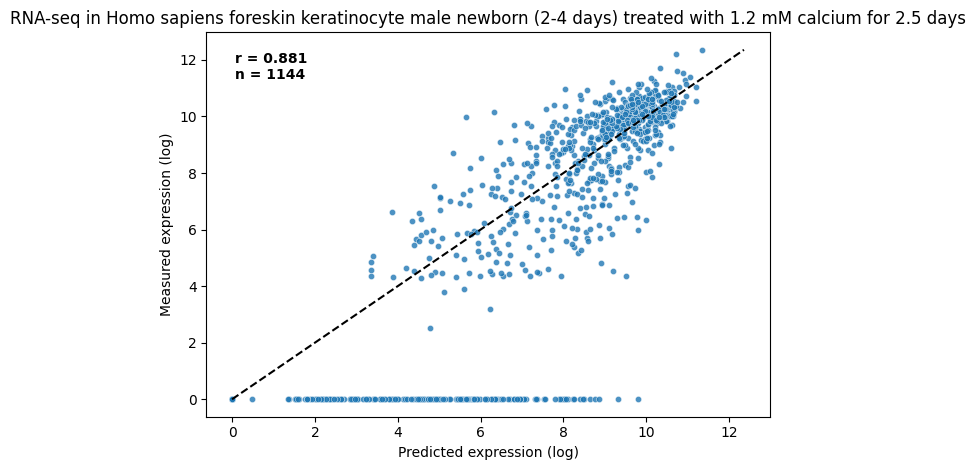

['ACOD1', 'ADAM7', 'ADAMDEC1', 'ADAMTS12', 'ADGB', 'ALKAL1', 'BMP10', 'C2orf78', 'C6', 'C6orf118', 'C7', 'CDH12', 'CDH9', 'CLDN3', 'CLVS2', 'COL15A1', 'CTNNA2', 'DBH', 'ENTREP2', 'FAM163B', 'FAM216B', 'FCN1', 'FNDC1', 'FRMD1', 'GALNT17', 'GKN2', 'GRIN3A', 'HS3ST5', 'HTR2A', 'ITGBL1', 'KLHL1', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'NYX', 'OPRK1', 'OPRM1', 'ORM2', 'PCDH8', 'PLCXD3', 'PLPP7', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'RSPO3', 'SCML4', 'SLC35D3', 'SLCO6A1', 'SLITRK1', 'SOHLH1', 'ST18', 'SYT10', 'TAAR1', 'THEMIS', 'TLR4', 'UGT3A1', 'VGLL2', 'XKR4']


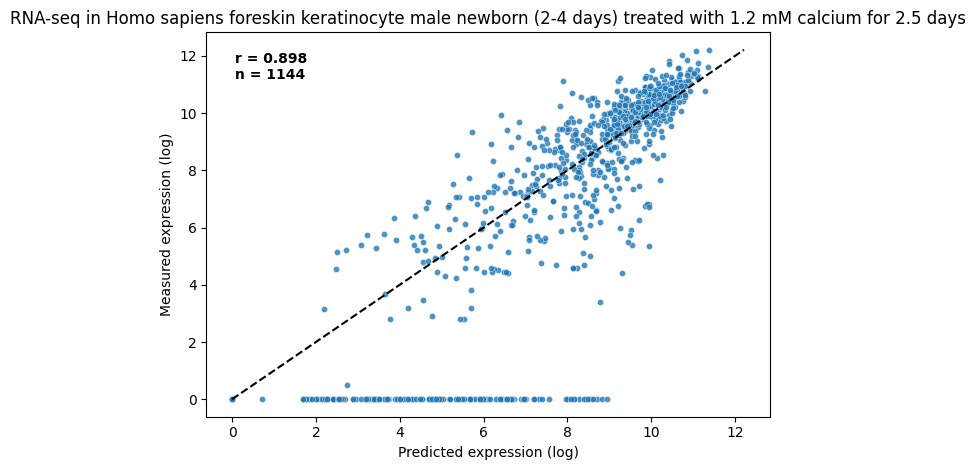

['ACOD1', 'ACTL7A', 'ADAM28', 'ADAM7', 'ADAMDEC1', 'ADAMTSL2', 'ADRA1A', 'ALKAL1', 'AMBP', 'C2orf78', 'C5', 'C6orf118', 'CCDC180', 'CDH9', 'CLDN20', 'CLVS2', 'CTNNA2', 'DBH', 'ENPP3', 'FAM216B', 'FBP2', 'FCN1', 'FSHB', 'GALNT17', 'GKN2', 'GPR34', 'IYD', 'KCNA4', 'KLHL1', 'LRRC4C', 'LRRC63', 'LRRTM1', 'LRRTM4', 'MCHR2', 'MUSK', 'NYX', 'OLFM4', 'OPRK1', 'OPRM1', 'ORM1', 'PBOV1', 'PLCXD3', 'PLN', 'PLPP7', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'REG1A', 'RSPO3', 'RUBCNL', 'SARDH', 'SCML4', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SMLR1', 'SOHLH1', 'ST18', 'SYT10', 'TAAR1', 'TLR4', 'TMEM270', 'UGT3A1', 'UNC5D', 'VGLL2']


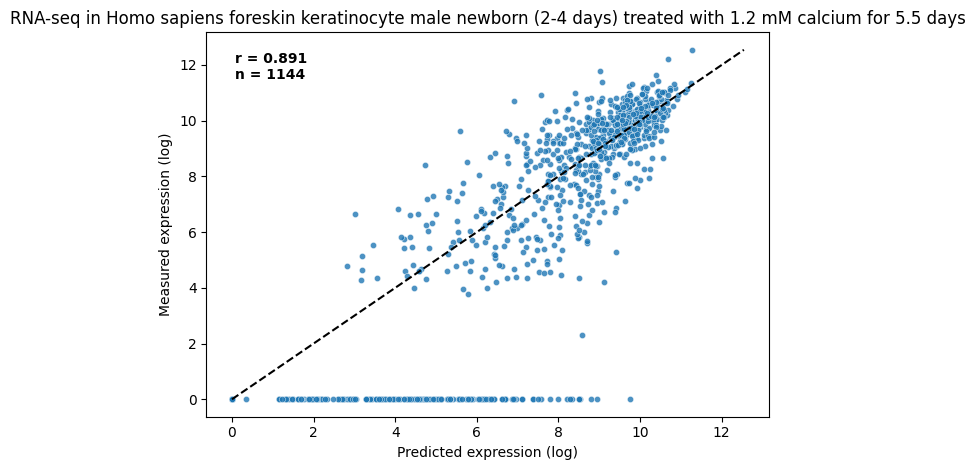

['ACOD1', 'ADAM28', 'ADAM7', 'ADAMDEC1', 'ADAMTSL2', 'ADRA1A', 'ALKAL1', 'AMBP', 'BMP10', 'C6orf118', 'CDH9', 'CTNNA2', 'DBH', 'ELN', 'ENPP3', 'ENTREP2', 'FAM163B', 'FAM216B', 'FCN1', 'FSHB', 'HS3ST5', 'KCNA4', 'KLHL1', 'LRRC4C', 'LRRC63', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MCHR2', 'OLFM4', 'OPRK1', 'PBOV1', 'PLPP7', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'RANBP3L', 'REG1A', 'RSPO3', 'SCML4', 'SLCO6A1', 'SOHLH1', 'TLR4', 'TSPAN18', 'UGT3A1', 'VGLL2']


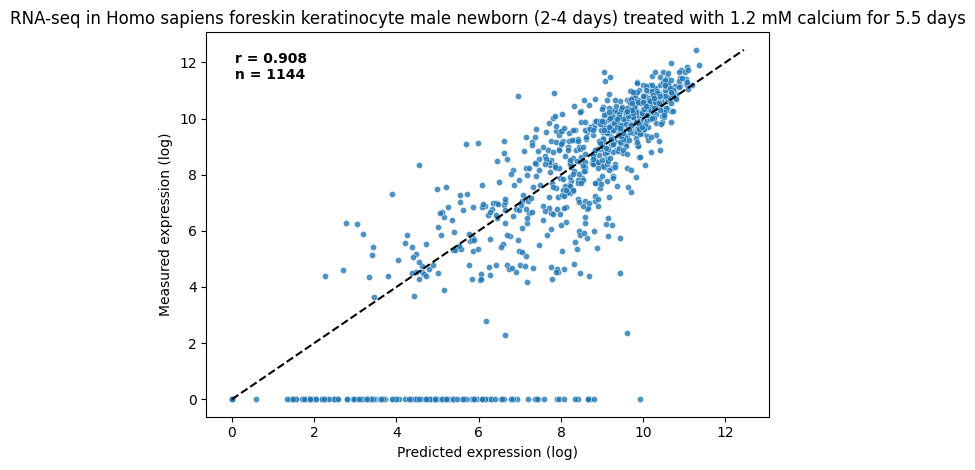

['ACOD1', 'ACTL7B', 'ADAM7', 'ADAMDEC1', 'ADAMTSL2', 'ADGB', 'ADRA1A', 'AMBP', 'ANKRD30B', 'BBOX1', 'BMP10', 'C2orf78', 'C5', 'C6orf118', 'CALN1', 'CCDC73', 'CDH12', 'CDH18', 'CDH9', 'CLDN3', 'CLVS2', 'CTNNA2', 'DBH', 'DCDC1', 'DCT', 'DIRAS2', 'DKK4', 'ELN', 'ENPP3', 'ENTREP2', 'EYA4', 'FABP7', 'FAM163B', 'FAM216B', 'FBP1', 'FBP2', 'FOXI3', 'FRMD1', 'FRRS1L', 'GALNT17', 'GGTA1', 'GRIN3A', 'GRM1', 'HTR2A', 'IYD', 'KCNA4', 'KLHL1', 'LRRTM1', 'LRRTM4', 'MAOB', 'MARCHF11', 'MCHR2', 'MPPED2', 'NYX', 'OLFM4', 'OPRK1', 'OPRM1', 'ORM1', 'ORM2', 'PBOV1', 'PCDH8', 'PLCXD3', 'PNMA2', 'PPP1R2C', 'PRLR', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRRT1B', 'REG1A', 'ROR2', 'RSPO3', 'SCML4', 'SLC16A10', 'SLC1A2', 'SLC22A16', 'SLC22A2', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SMLR1', 'SOHLH1', 'ST18', 'SYT10', 'TAAR1', 'THEMIS', 'TLR4', 'TMEM181', 'TNFSF8', 'TRDN', 'TSPAN18', 'VGLL2', 'VIP', 'VNN2', 'WNK2', 'WNT3A']


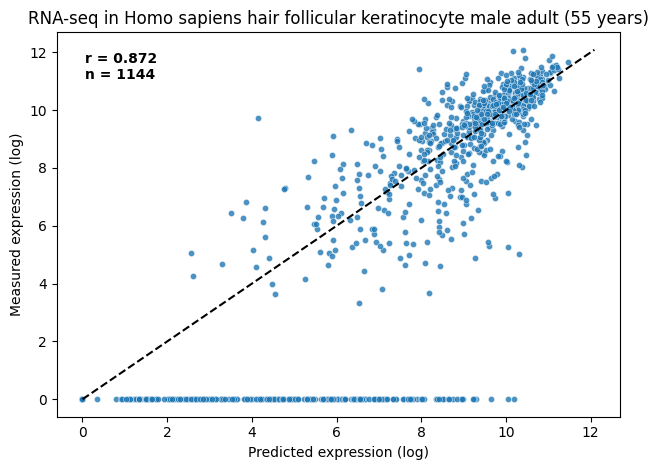

['ACOD1', 'ACTL7B', 'ANKRD30B', 'CAPSL', 'CBY2', 'FCN1', 'FCN2', 'GKN2', 'GPR6', 'H3Y1', 'KCNU1', 'MAS1', 'MYMK', 'NOX3', 'NYX', 'OR13C2', 'OR13C9', 'OR8J2', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'RAET1L', 'SLC22A16', 'SLC35D3', 'SMIM28', 'SOHLH1', 'SPATA31D1', 'TEX48', 'VGLL2', 'VIP']


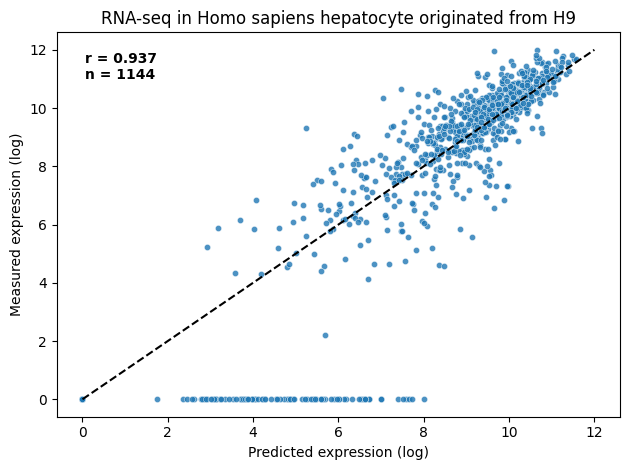

['ADAM7', 'ADRA1A', 'C2orf78', 'C6orf118', 'CDH9', 'CLVS2', 'CTNNA2', 'DBH', 'FAM163B', 'FAM216B', 'FRMD1', 'GALNT17', 'GRIN3A', 'KCNA4', 'LRRC4C', 'LRRTM1', 'NYX', 'OPRK1', 'OPRM1', 'ORM1', 'ORM2', 'PCDH17', 'PCDH8', 'PLCXD3', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'RSPO3', 'SCML4', 'SLCO6A1', 'SOBP', 'SOHLH1', 'TMEM270', 'UGT3A1', 'VGLL2']


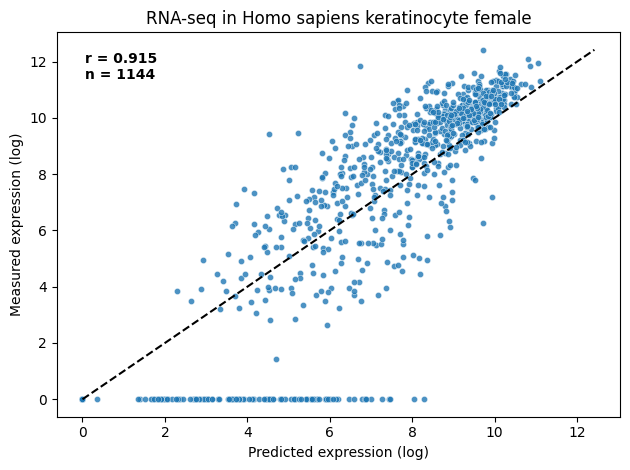

['ADAM2', 'CDH9', 'DKK4', 'FABP7', 'FAM216B', 'FOXI3', 'GKN1', 'H3Y1', 'HS6ST3', 'KLHL1', 'LCN9', 'MCHR2', 'MUC15', 'NDP', 'NEFL', 'NEFM', 'NOX3', 'NYX', 'OPRK1', 'OR5AS1', 'OR8J2', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'REG1B', 'SCEL', 'SLC22A2', 'SOHLH1', 'SPATA31D1', 'SPATA31D3', 'TMEM270', 'VGLL2', 'WNT3A']


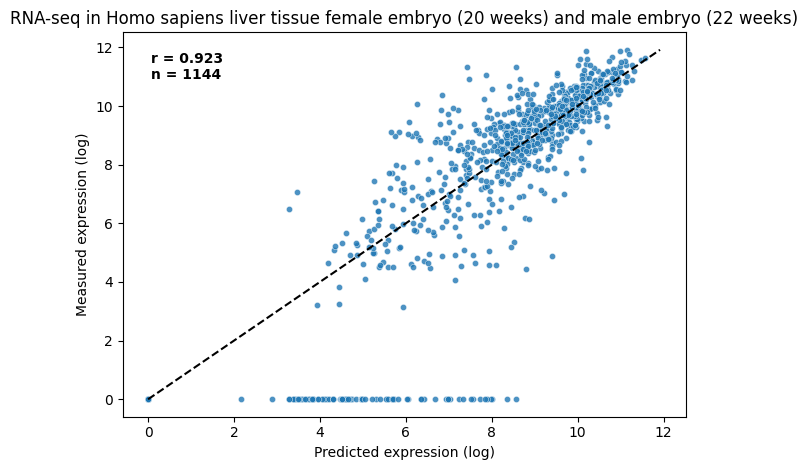

['ACTL7B', 'ADAM18', 'ADAM7', 'AGXT2', 'ALKAL1', 'AMBP', 'ANKRD30B', 'BMP10', 'C5', 'C6orf118', 'CDH10', 'CDH9', 'DBH', 'DKK4', 'EPSTI1', 'EYA4', 'FAM163B', 'FCN2', 'FRRS1L', 'FSHB', 'GKN1', 'GKN2', 'GPR6', 'GRIN3A', 'H2AL3', 'H2AP', 'H3Y1', 'HS3ST5', 'HTR2A', 'KLHL1', 'LCN9', 'LRRC63', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MAS1', 'MCHR2', 'MROH2B', 'MYMK', 'NOX3', 'NUTM1', 'NXNL2', 'NYX', 'OPRK1', 'OPRM1', 'ORM1', 'PBOV1', 'PCDH8', 'PNOC', 'POPDC3', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'PRSS38', 'REG1A', 'REG1B', 'REG3G', 'SAMD3', 'SERP2', 'SLC22A16', 'SLC22A2', 'SLC35D3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SYT10', 'TAAR1', 'TEX48', 'TEX53', 'TMEM270', 'TNFSF15', 'TRDN', 'TSPAN18', 'UGT3A1', 'VGLL2']


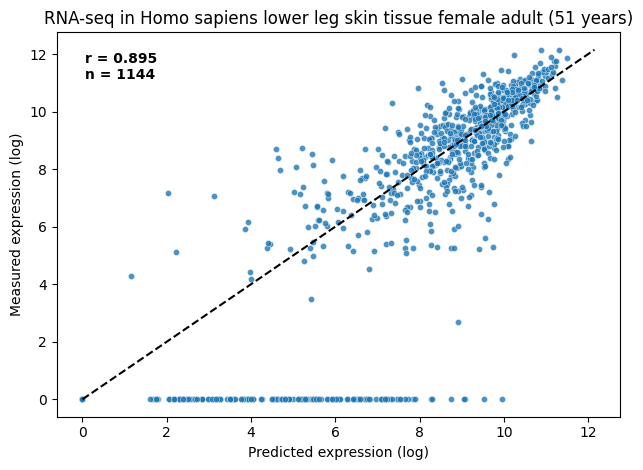

['ACOD1', 'ACTL7B', 'ADAM18', 'ADAM7', 'ALKAL1', 'AMBP', 'ANKRD30B', 'BMP10', 'BRINP1', 'C5', 'C6orf118', 'CCDC180', 'CDH9', 'CTNNA2', 'DBH', 'DKK4', 'FAM163B', 'FAM216B', 'FBXO16', 'FSHB', 'GABBR2', 'GKN1', 'GKN2', 'GPR6', 'GRIN3A', 'GRM1', 'H3Y1', 'HS3ST5', 'KCNA4', 'KLHL1', 'LCN9', 'LRRC63', 'LRRTM1', 'MARCHF11', 'MCHR2', 'MSANTD3-TMEFF1', 'MYMK', 'NDP', 'NEFM', 'NOX3', 'NYX', 'OPRM1', 'OR2A4', 'ORM1', 'ORM2', 'PBOV1', 'PEBP4', 'PLPP7', 'PLPPR1', 'POPDC3', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'REG1A', 'ROPN1L', 'SLC22A2', 'SLC2A6', 'SLC35D3', 'SLCO6A1', 'SLITRK1', 'SMLR1', 'SOHLH1', 'SPATA31E1', 'SYTL5', 'TAAR1', 'TMEM181', 'TMEM270', 'TNFSF11', 'TRDN', 'TSPAN18', 'UGT3A1', 'VGLL2', 'VIP']


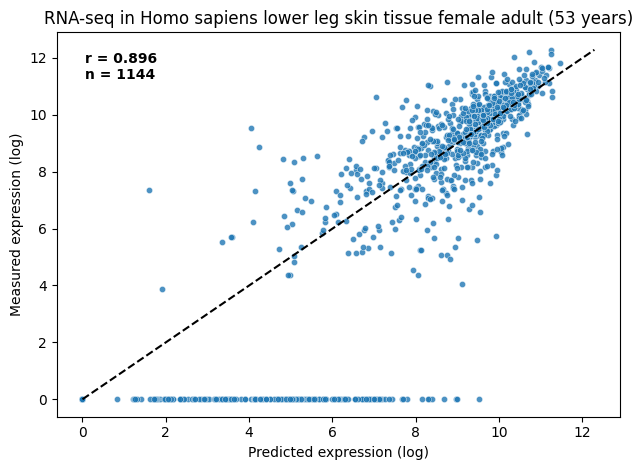

['ACOD1', 'ACTL7A', 'ACTL7B', 'ADAM18', 'C2orf78', 'C6orf118', 'CAPSL', 'CDH9', 'FAM163B', 'FAM216B', 'FSHB', 'GKN1', 'GKN2', 'GPR6', 'H2AL3', 'H2AP', 'H3Y1', 'KCNU1', 'KLHL1', 'LCN9', 'LRRTM4', 'MARCHF11', 'MAS1', 'MCHR2', 'MROH2B', 'MYMK', 'NEFM', 'NOX3', 'NYX', 'OPRK1', 'OPRM1', 'OR13C9', 'OR2A4', 'ORM1', 'OTC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'SLC22A2', 'SLC35D3', 'SLCO6A1', 'SLITRK1', 'SMIM28', 'SMLR1', 'SPATA31C1', 'SPATA31D1', 'SPATA31E1', 'ST18', 'TAAR1', 'TAS2R1', 'TEX48', 'TMEM270', 'TXNDC8', 'ULBP1', 'VGLL2', 'VNN2']


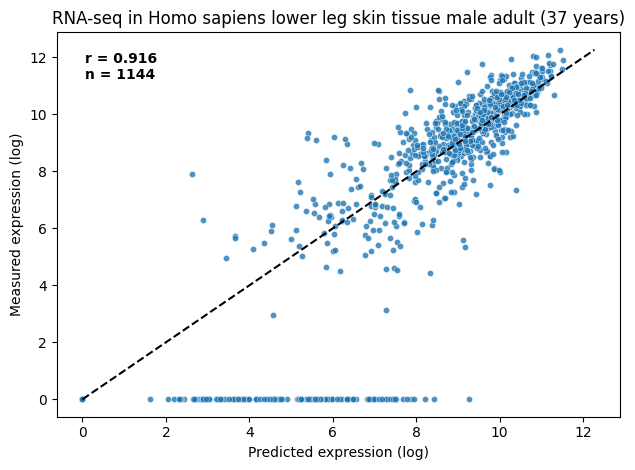

['ACOD1', 'ADAM18', 'ADAM2', 'AGXT2', 'ANKRD30B', 'BMP10', 'C5', 'C6', 'C7', 'CYLC2', 'DDO', 'FAM216B', 'FCN1', 'FCN2', 'GKN2', 'H2AP', 'H3Y1', 'IDO2', 'IL20RA', 'IL7R', 'ITGBL1', 'KCNU1', 'KLHL1', 'MAS1', 'MCHR2', 'MROH2B', 'MYMK', 'NOX3', 'OLFM4', 'OR13C2', 'OR2A4', 'OR5AS1', 'OR8H1', 'OR8J2', 'OR8K3', 'OTC', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'RAET1E', 'RAET1L', 'RGCC', 'ROPN1L', 'ROS1', 'RP1', 'SCEL', 'SIAH3', 'SLC15A1', 'SLC22A16', 'SLC22A2', 'SMIM28', 'SOHLH1', 'SPATA31D1', 'SPATA31D3', 'ST18', 'TAAR1', 'TAAR6', 'TEX48', 'THEMIS', 'TNFSF15', 'TNFSF8', 'ULBP2', 'VGLL2', 'VIP', 'VNN1', 'VNN2']


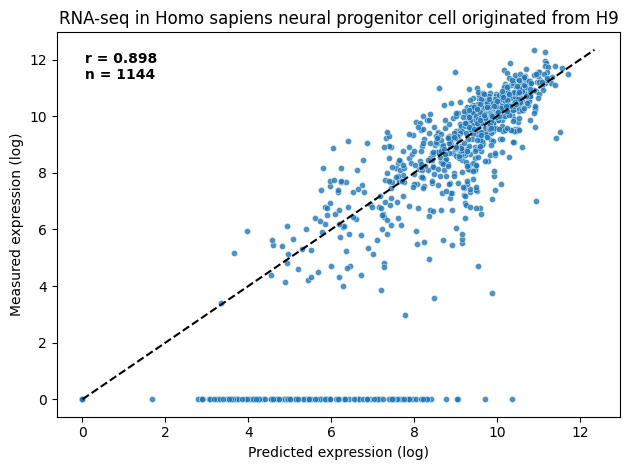

['DKK4', 'GPR6', 'H2AL3', 'H3Y1', 'LCN9', 'MCHR2', 'OR8H1', 'OR8J2', 'ORM1', 'OXGR1', 'PLPPR1', 'PNOC', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'SLC22A2', 'SLITRK1', 'SPATA31D3', 'TAAR1', 'TMEM68']


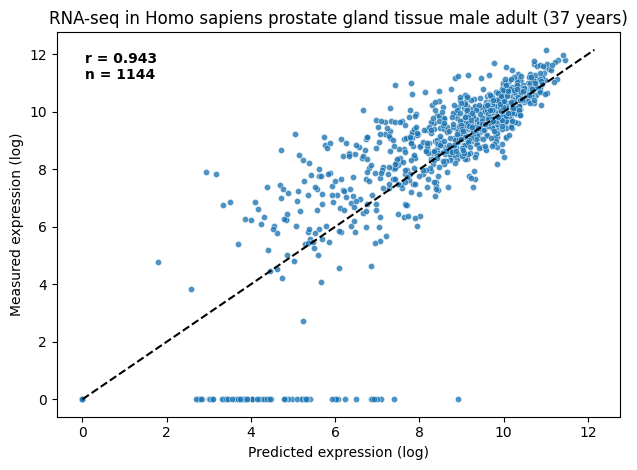

['ACOD1', 'ACTL7A', 'ADAM18', 'ADGB', 'AGXT2', 'ALKAL1', 'ANKRD30B', 'BMP10', 'C2orf78', 'C5', 'C6orf118', 'CAPSL', 'CDH9', 'CNMD', 'DKK4', 'FABP7', 'FAM163B', 'FAM216B', 'FOXI3', 'GABBR2', 'GKN2', 'GPR6', 'GRM1', 'H2AL3', 'H2AP', 'H3Y1', 'HS3ST5', 'KCNA4', 'KLHL1', 'LCN9', 'LRRTM1', 'MARCHF11', 'MAS1', 'MCHR2', 'MROH2B', 'MYMK', 'NALCN', 'NEFM', 'NOX3', 'NUTM1', 'NYX', 'OPRM1', 'OR13C2', 'OR13C9', 'OR2A4', 'ORM1', 'PNOC', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'REG1A', 'REG3G', 'SAMD3', 'SLC28A3', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SMLR1', 'SOHLH1', 'SPATA31C1', 'SPATA31D1', 'SPATA31E1', 'TAS2R1', 'TMEM181', 'TNFSF11', 'TRABD2A', 'TXNDC8', 'ULBP1', 'VGLL2', 'VIP', 'XKR4']


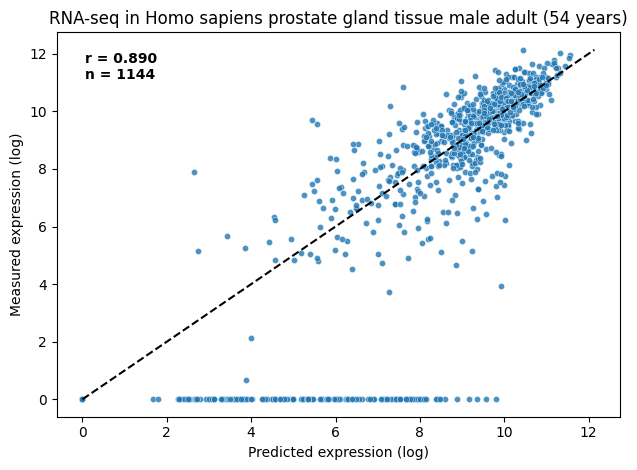

['ACTL7A', 'ADAM18', 'ADAM7', 'ADGB', 'ALKAL1', 'ANKRD30B', 'C6orf118', 'CDH10', 'CDH18', 'CDH9', 'FABP7', 'FAM216B', 'FOXI3', 'FRRS1L', 'FSHB', 'GABBR2', 'GKN1', 'GKN2', 'GPR6', 'H3Y1', 'HS3ST5', 'HS6ST3', 'IDO1', 'KCNA4', 'KLHL1', 'LCN9', 'MARCHF11', 'MCHR2', 'MYMK', 'NEFL', 'NOX3', 'NUTM1', 'NYX', 'OPRK1', 'OPRM1', 'OR2A4', 'PCDH8', 'POPDC3', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1B', 'REG3G', 'SCEL', 'SIAH3', 'SLC35D3', 'SLCO6A1', 'SLITRK1', 'SMIM28', 'SOHLH1', 'SPATA31C1', 'TEX48', 'TMEM181', 'VGLL2']


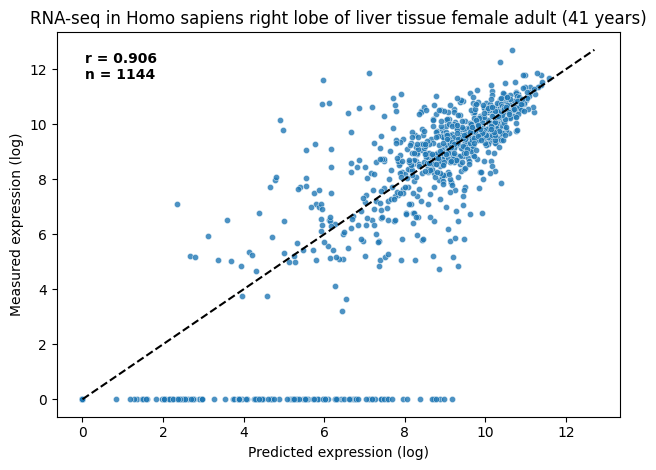

['ACOD1', 'ACTL7A', 'ADAM18', 'ADAM2', 'ADAM7', 'ADGB', 'ANKRD30B', 'ARL4AP5', 'C2orf78', 'C6orf118', 'CAPSL', 'CDH10', 'CDH18', 'CDH9', 'CNMD', 'CTAGE9', 'DKK4', 'FABP7', 'FAM216B', 'FOXI3', 'FSHB', 'GABBR2', 'GKN1', 'GKN2', 'GPR6', 'H2AL3', 'H3Y1', 'HS3ST5', 'HS6ST3', 'HTRA4', 'KCNA4', 'KCNU1', 'KLHL1', 'LANCL3', 'LCN9', 'LRRTM1', 'LZTS1', 'MARCHF11', 'MCHR2', 'MYMK', 'NDP', 'NEFM', 'NMBR', 'NOX3', 'NUTM1', 'NYX', 'OPRM1', 'OR2A4', 'OXGR1', 'PBOV1', 'PCDH8', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20E', 'PRSS38', 'RAET1L', 'REG1B', 'REG3G', 'SAMD3', 'SCEL', 'SIAH3', 'SLC22A16', 'SLC35D3', 'SLC35F1', 'SLCO6A1', 'SLITRK1', 'SPATA31C1', 'SPATA31D1', 'TAAR1', 'TEX48', 'TMEM181', 'TMEM200A', 'UNC5D', 'VGLL2', 'WNT3A']


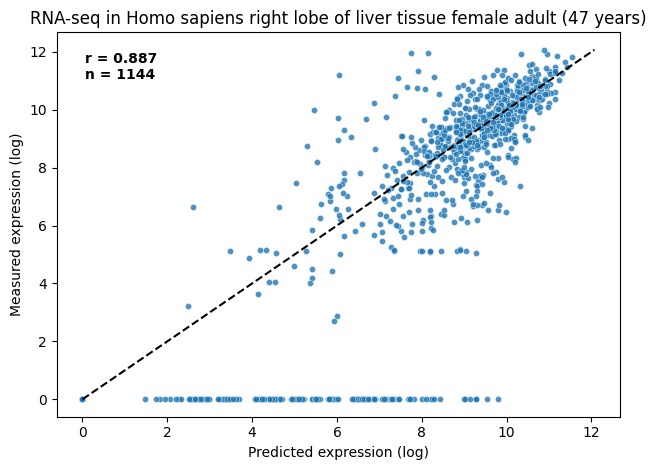

['ACOD1', 'ACTL7A', 'ADAM18', 'ADAM7', 'ANKRD30B', 'CDH10', 'CDH12', 'CDH18', 'CDH9', 'CLVS2', 'CTNNA2', 'EFHC2', 'ENTREP2', 'FABP7', 'FOXI3', 'FSHB', 'GABBR2', 'GPR6', 'GRM1', 'HS3ST5', 'KCNA4', 'KIF25', 'KLHL1', 'LCN9', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MCHR2', 'NDP', 'NEFL', 'NEFM', 'NOX3', 'NUTM1', 'OLFM4', 'OPRK1', 'OPRM1', 'PBOV1', 'PCDH8', 'PNOC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'RAET1L', 'REG3G', 'SIAH3', 'SLC22A16', 'SLC35D3', 'SLCO6A1', 'SLITRK1', 'SOHLH1', 'SPATA31C1', 'TAAR1', 'TEX48', 'TMEM181', 'UNC5D', 'VGLL2', 'WNT3A']


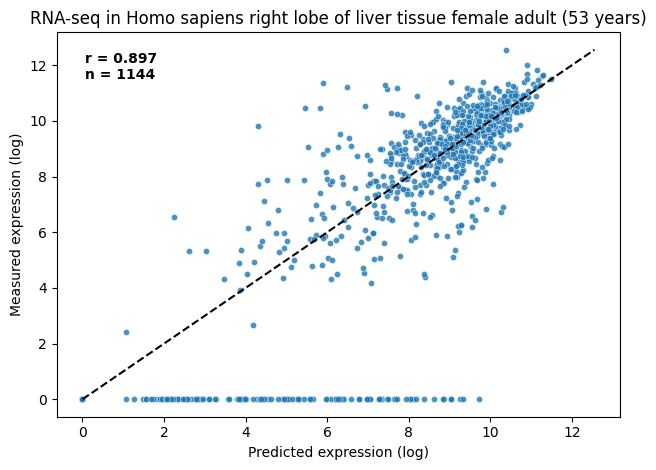

['ACOD1', 'ACTL7A', 'ADAM18', 'ADAM7', 'ADGB', 'ALKAL1', 'C6orf118', 'CDH10', 'CDH18', 'CDH9', 'CTNNA2', 'DKK4', 'FABP7', 'FAM216B', 'FOXI3', 'FSHB', 'GABBR2', 'GKN1', 'GKN2', 'GPR6', 'H3Y1', 'HS3ST5', 'KCNA4', 'KLHL1', 'LCN9', 'MARCHF11', 'MCHR2', 'NDP', 'NEFL', 'NEFM', 'NOX3', 'NUTM1', 'OPRK1', 'OPRM1', 'OR2A4', 'OXGR1', 'PCDH8', 'PEBP4', 'PNOC', 'POPDC3', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20E', 'RAET1L', 'REG1B', 'REG3G', 'SCEL', 'SIAH3', 'SLC35D3', 'SLCO6A1', 'SLITRK5', 'SMIM28', 'SOHLH1', 'SPATA31C1', 'SPATA31D1', 'TEX48', 'TMEM181', 'UNC5D', 'VGLL2', 'WNT3A']


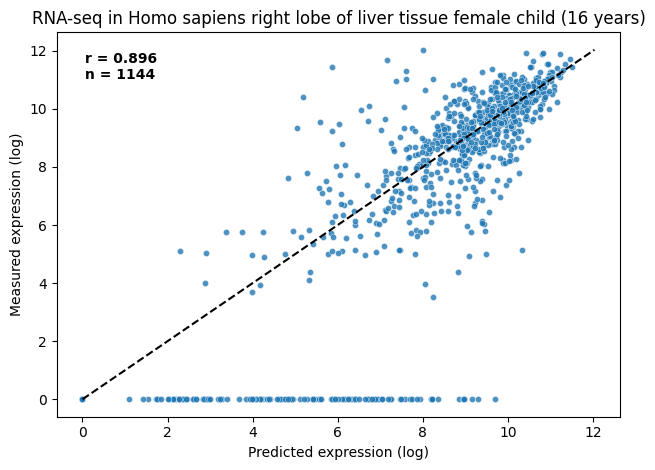

['AGXT2', 'C2orf78', 'GPR31', 'H2AL3', 'H2AP', 'H3Y1', 'LCN9', 'MARCHF11', 'MCHR2', 'NYX', 'OR5AS1', 'OR8J2', 'OTC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'REG3G', 'SOHLH1', 'SPATA31E1', 'TAAR1', 'TMEM270']


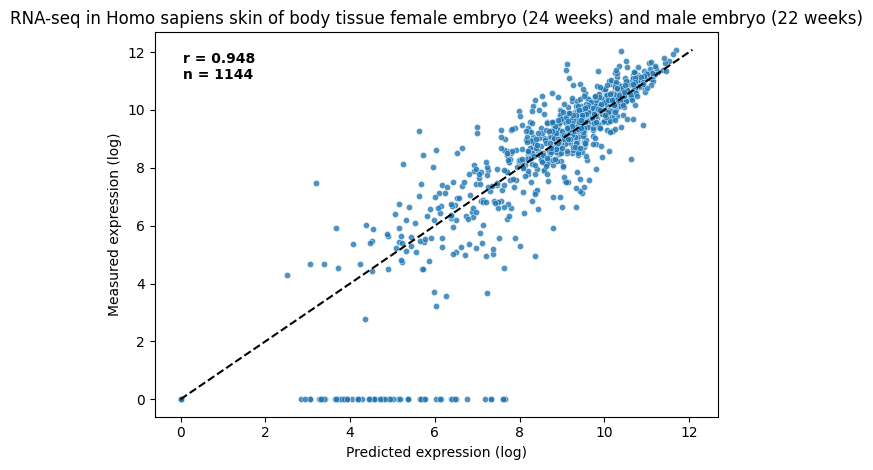

['ACOD1', 'ACTL7A', 'ACTL7B', 'ADAM18', 'ADAM7', 'ALKAL1', 'ANKRD30B', 'BMP10', 'C5', 'C6orf118', 'CDH10', 'CDH9', 'DBH', 'DKK4', 'FAM163B', 'FAM216B', 'FCN2', 'FOXI3', 'FSHB', 'GABBR2', 'GKN1', 'GKN2', 'GPR6', 'GRM1', 'H2AL3', 'H2AP', 'H3Y1', 'HS3ST5', 'HTRA4', 'KLHL1', 'LCN9', 'LRRC63', 'LRRTM1', 'LRRTM4', 'MARCHF11', 'MCHR2', 'MROH2B', 'MYMK', 'NAT8', 'NDP', 'NMBR', 'NOX3', 'NYX', 'OPRM1', 'OR2A4', 'ORM1', 'PBOV1', 'PNOC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20D', 'PRR20E', 'PRSS38', 'REG1B', 'REG3G', 'SAMD3', 'SLC22A16', 'SLC22A2', 'SLCO6A1', 'SLITRK1', 'SMLR1', 'SOHLH1', 'SPATA31E1', 'TAAR1', 'TEX48', 'TMEM270', 'TNFRSF10C', 'TNFSF11', 'VGLL2', 'VIP']


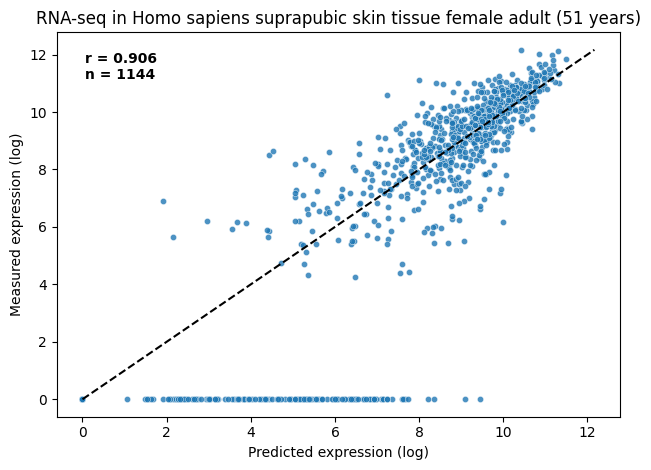

['ADAM18', 'ADAM2', 'ADAM7', 'BMP10', 'C2orf78', 'C6orf118', 'CAPSL', 'CDH10', 'CDH9', 'FAM163B', 'FAM216B', 'FCN2', 'FOXI3', 'FSHB', 'GKN1', 'GRIN3A', 'H2AL3', 'H2AP', 'H3Y1', 'HTR2A', 'KLHL1', 'LCN9', 'LRRC4C', 'LRRTM1', 'MARCHF11', 'MAS1', 'MCHR2', 'MROH2B', 'NEFL', 'NEFM', 'NOX3', 'OPRM1', 'OR13C2', 'OR2A4', 'OTC', 'PCDH8', 'POPDC3', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'REG1B', 'REG3G', 'SIAH3', 'SLC22A16', 'SLC22A2', 'SLCO6A1', 'SLITRK1', 'SOHLH1', 'SPATA31D1', 'SPATA31E1', 'SYT10', 'TAAR1', 'TAS2R1', 'TMEM181', 'TMEM270', 'TNFSF11', 'TRDN', 'TXNDC8', 'ULBP2', 'VGLL2']


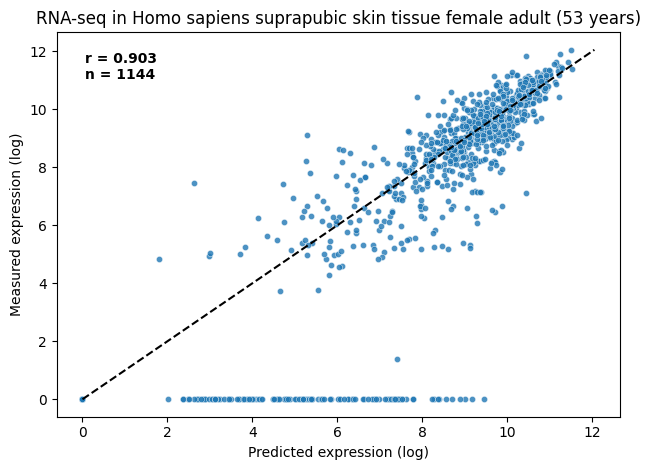

['ACOD1', 'ADAM18', 'ALKAL1', 'C2orf78', 'C5', 'C6orf118', 'CDH10', 'CDH9', 'FAM163B', 'FAM216B', 'FBXO16', 'FSHB', 'GKN2', 'GPR6', 'GRIN3A', 'H2AL3', 'H2AP', 'H3Y1', 'KLHL1', 'LCN9', 'LRRC63', 'LRRTM4', 'MARCHF11', 'MAS1', 'MCHR2', 'MROH2B', 'MYMK', 'NAT8', 'NEFL', 'NEFM', 'NOX3', 'NYX', 'OPRM1', 'OR2A4', 'ORM1', 'ORM2', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'REG1A', 'SLC5A12', 'SLCO6A1', 'SLITRK1', 'SMLR1', 'SOHLH1', 'SPATA31C1', 'SPATA31E1', 'SYT10', 'TAAR1', 'TEX48', 'TEX53', 'TMEM270', 'VGLL2']


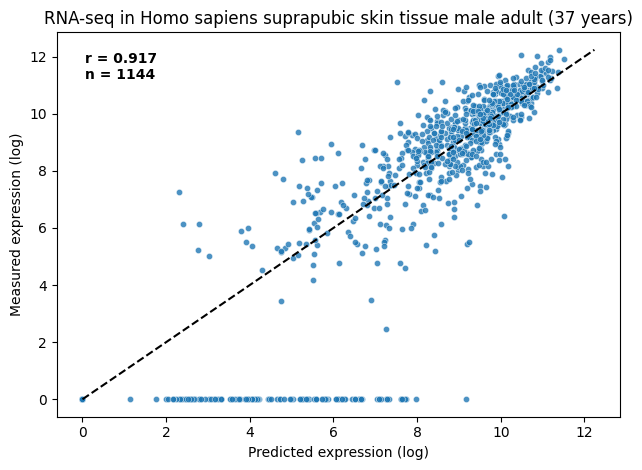

['ACOD1', 'ACTL7B', 'ADAM18', 'ADAM7', 'ALKAL1', 'ANKRD30B', 'C2orf78', 'C5', 'C6orf118', 'CCDC73', 'CDH9', 'CNMD', 'CTNNA2', 'FAM163B', 'FAM216B', 'FBXO16', 'GKN1', 'GKN2', 'H2AL3', 'H2AP', 'H3Y1', 'KLHL1', 'LCN9', 'LRRTM4', 'MARCHF11', 'MCHR2', 'MYMK', 'NEFM', 'NMBR', 'NOX3', 'NYX', 'OPRK1', 'OR13C9', 'OR2A4', 'ORM1', 'PEBP4', 'PLPPR1', 'PPDPFL', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'REG1A', 'SAMD3', 'SLITRK1', 'SMIM28', 'SPATA31C1', 'SYT10', 'TAAR1', 'TAS2R1', 'TMEM181', 'TMEM270', 'TNFSF11', 'TXNDC8']


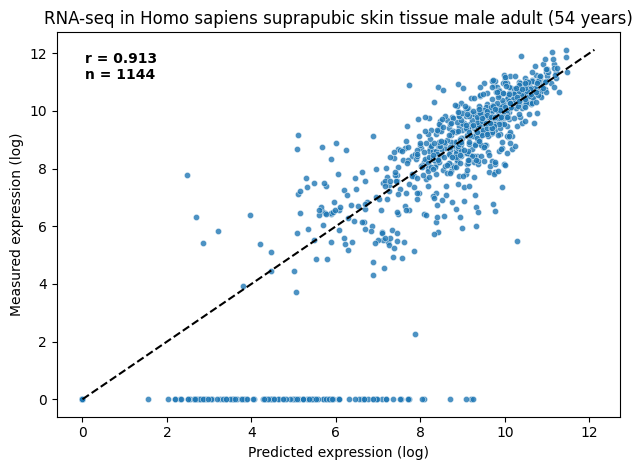

['PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'SLC35D3', 'TAAR1']


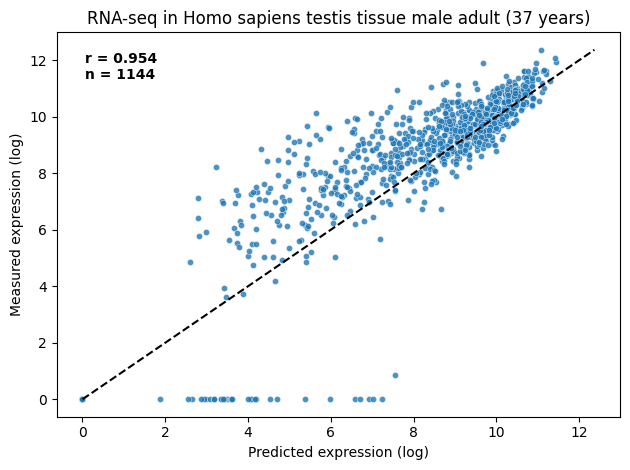

['OR8J2', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'REG1A', 'TAAR1']


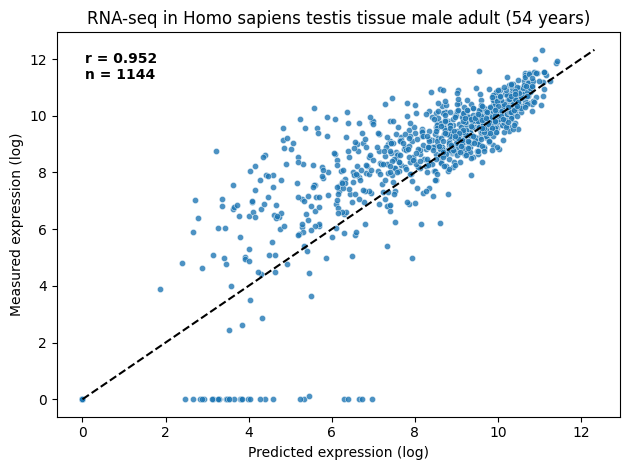

['ACOD1', 'ADAM18', 'BMP10', 'C5', 'CDH10', 'DKK4', 'FSHB', 'GKN2', 'H2AL3', 'H2AP', 'KCNA4', 'KLHL1', 'MCHR2', 'MYMK', 'OLFM4', 'OR13C2', 'OR13C9', 'OR2A4', 'OR5AS1', 'OR8J2', 'OR8K3', 'OTC', 'PDE7B', 'PNOC', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'RAET1G', 'RAET1L', 'REG1A', 'ROPN1L', 'RP1', 'SCML4', 'SLC28A3', 'SPATA31D1', 'ST18', 'TAAR1', 'TCIM', 'TEX48']


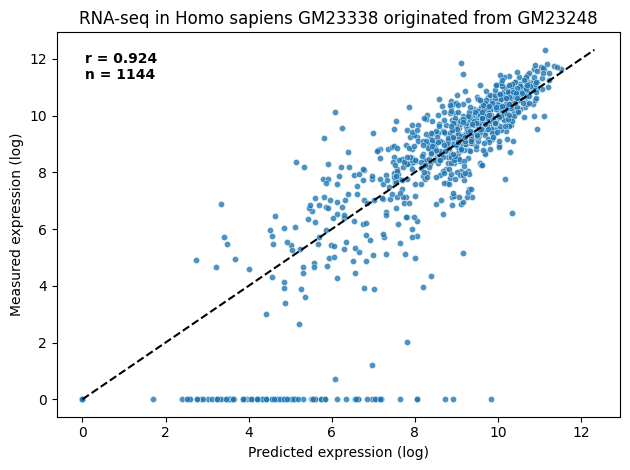

['ACOD1', 'AGXT2', 'C5', 'FSHB', 'MROH2B', 'OR2A4', 'OR8J2', 'PDE7B', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'SPATA31D1', 'TNFSF8', 'VNN2']


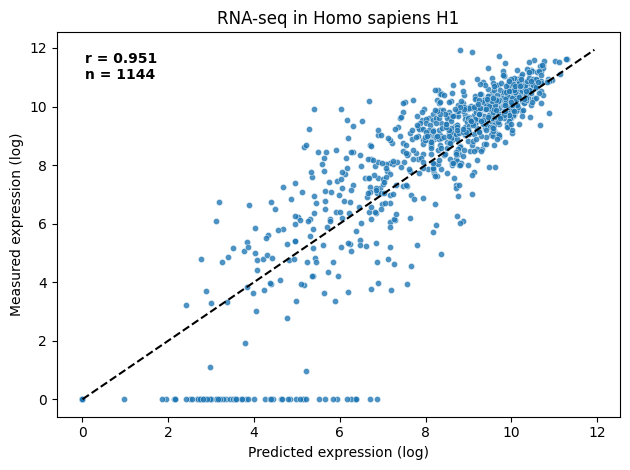

['ACOD1', 'ADAM18', 'ADAM7', 'ADAMDEC1', 'ADGB', 'C5', 'C6', 'FCN1', 'FSHB', 'GGTA1', 'GKN2', 'H2AL3', 'H2AP', 'H3Y1', 'HTR2A', 'KLHL1', 'MCHR2', 'MROH2B', 'MUC15', 'OLFM4', 'OR2A4', 'OR8J2', 'PDE7B', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'RAET1L', 'REG1A', 'ROS1', 'SCEL', 'SCML4', 'SLC22A16', 'SLC28A3', 'SPATA31D1', 'ST18', 'TAAR1', 'TEX48', 'TEX53', 'THEMIS', 'TMEM270', 'TNFSF8', 'ULBP2']


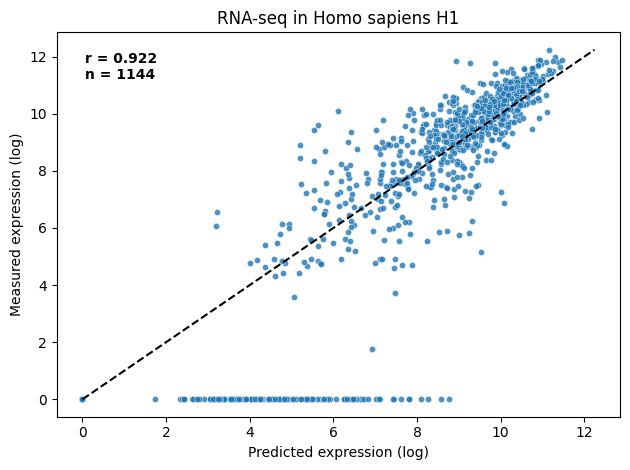

['ACOD1', 'ACTL7A', 'ACTL7B', 'ADAM2', 'ADAMDEC1', 'ADGB', 'AGXT2', 'ANKRD30B', 'BMP10', 'C5', 'C6', 'C6orf118', 'C6orf58', 'CYLC2', 'DDO', 'FCN1', 'FSHB', 'GRIN3A', 'H2AL3', 'H2AP', 'H3Y1', 'IL7R', 'ITGBL1', 'IYD', 'KCNU1', 'KLHL1', 'LRRC63', 'MROH2B', 'MUC15', 'MYMK', 'NDP', 'OR2A4', 'OR8J2', 'PBOV1', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'RAET1L', 'ROS1', 'RSPO3', 'SCEL', 'SCML4', 'SLC22A16', 'SOHLH1', 'SPATA31D1', 'TAAR1', 'TAS2R1', 'THEMIS', 'TNFSF15', 'TNFSF8', 'ULBP2', 'VGLL2', 'VIP', 'VNN1', 'VNN2']


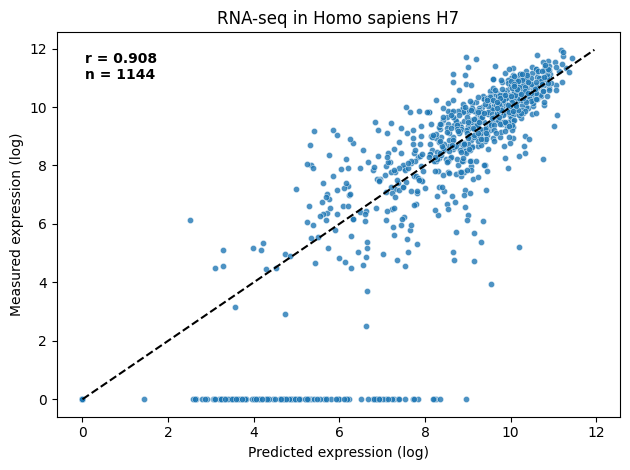

['ADAM18', 'ADAM2', 'ADAMDEC1', 'AGXT2', 'ANKRD30B', 'BMP10', 'C5', 'C6', 'DDO', 'FSHB', 'GKN2', 'GRIN3A', 'H2AL3', 'H2AP', 'H3Y1', 'KCNA4', 'KLHL1', 'MCHR2', 'MROH2B', 'MUC15', 'NAT8', 'NDP', 'NPR3', 'OLFM4', 'OR2A4', 'OR8J2', 'PDE7B', 'PPP1R2C', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'RAET1L', 'SIAH3', 'SLC22A16', 'SLC28A3', 'SMIM28', 'SPATA31D1', 'TAAR1', 'TCIM', 'TEX48', 'TNFSF8', 'VIP', 'VNN1', 'VNN2']


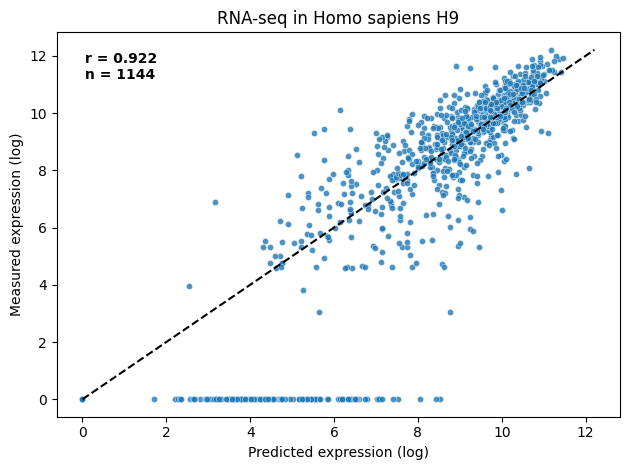

['ACOD1', 'ACTL7A', 'ACTL7B', 'ADAMDEC1', 'AGXT2', 'C5', 'CAPSL', 'CCDC73', 'CYLC2', 'FCN1', 'FCN2', 'FSHB', 'GGTA1', 'H3Y1', 'IDO2', 'ITGBL1', 'KCNA4', 'MROH2B', 'OR8J2', 'OTC', 'PEBP4', 'PRR20A', 'PRR20B', 'PRR20C', 'PRR20D', 'PRR20E', 'PRSS38', 'RAET1L', 'REG3G', 'ROS1', 'SMIM28', 'SOHLH1', 'SPATA31D1', 'SPATA31D3', 'TAAR1', 'TEX53', 'THEMIS', 'TNFSF8', 'VIP', 'VNN1', 'VNN2']


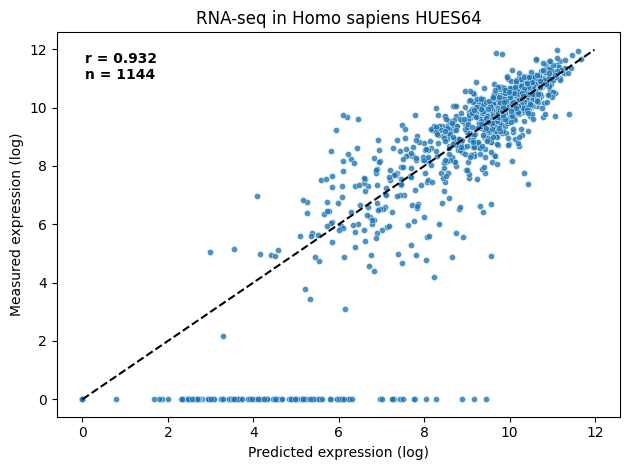

In [14]:
cors = []
cors_df = {}
for col in range(encode.shape[1]):
    sample_idx = int(encode.columns[col].split('_')[0][6:])
    y = encode.iloc[:, col]
    x = grt.iloc[:, col]
    r, _ = pearsonr(x, y)
    n = len(x)

    print([encode.index[i] for i in range(len(encode)) if encode.iloc[i, col] < 1 and grt.iloc[i, col] > 5])
    cors.append(r)
    cors_df[encode.columns[col]] = r
    sns.scatterplot(x=x, y=y, s=20, alpha=0.8)
    min_val = min(x.min(), y.min())
    max_val = max(x.max(), y.max())
    plt.plot([min_val, max_val], [min_val, max_val], linestyle='--', color='black')
    plt.text(
        0.05, 0.95,
        f"r = {r:.3f}\nn = {n}",
        transform=plt.gca().transAxes,
        fontsize=10,
        weight='bold',
        verticalalignment='top'
    )
    plt.xlabel('Predicted expression (log)')
    plt.ylabel('Measured expression (log)')
    plt.title(f"RNA-seq in {cells.loc[sample_idx, 'tissue_name']}")
    plt.tight_layout()
    plt.show()

In [15]:
with open('/project/deeprna_data/benchmark/gene_level_cross_both/correlations_fixed.pk', 'wb') as f:
    pickle.dump(cors_df, f)
print(cors_df)

{'tissue105_rna_total': 0.9056940278712308, 'tissue159_rna_polya': 0.8790788570201611, 'tissue159_rna_total': 0.8871419728021518, 'tissue160_rna_polya': 0.880726576383302, 'tissue160_rna_total': 0.8984280696461514, 'tissue161_rna_polya': 0.8907885434957605, 'tissue161_rna_total': 0.9081074345227096, 'tissue174_rna_total': 0.8716617819992782, 'tissue202_rna_total': 0.9365353271413001, 'tissue203_rna_polya': 0.9151584285275918, 'tissue211_rna_total': 0.9234899699439952, 'tissue212_rna_total': 0.895017764497367, 'tissue213_rna_total': 0.8958403592692867, 'tissue214_rna_total': 0.9158029609931154, 'tissue239_rna_total': 0.8982271338806975, 'tissue267_rna_total': 0.9428782231975658, 'tissue268_rna_total': 0.8900965019387601, 'tissue275_rna_total': 0.9058103484829344, 'tissue276_rna_total': 0.8872554894802318, 'tissue277_rna_total': 0.89674880158828, 'tissue278_rna_total': 0.8963109089705827, 'tissue288_rna_total': 0.9480304776059634, 'tissue318_rna_total': 0.9060248561700521, 'tissue319_rna

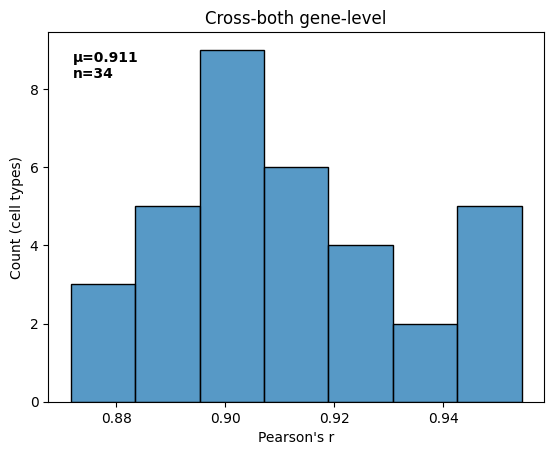

In [16]:
mu = np.mean(cors)
sns.histplot(cors)
plt.text(
    0.05, 0.95,
    f'μ={round(mu, 3)}\nn={len(cors)}',
    transform=plt.gca().transAxes,
    fontsize=10,
    weight='bold',
    verticalalignment='top')
plt.title("Cross-both gene-level")
plt.xlabel("Pearson's r")
plt.ylabel("Count (cell types)")
plt.show()

## Corgi vs Borzoi

In [243]:
## Cross-both
encode = pd.read_csv('/project/deeprna_data/benchmark/gene_level_grt_borzoi/all_expressions_encode.csv', index_col=0, header='infer')

encode = encode.loc[:,~encode.columns.str.contains('.1')]
grt = pd.read_csv('/project/deeprna_data/benchmark/gene_level_grt_borzoi/all_expressions_grt.csv', index_col=0, header='infer')
borzoi = pd.read_csv('/project/deeprna_data/benchmark/gene_level_grt_borzoi/all_expressions_borzoi.csv', index_col=0, header='infer')

encode = encode.loc[encode.index.isin(coding_genes.Symbol)]
grt = grt.loc[grt.index.isin(coding_genes.Symbol)]
borzoi = borzoi.loc[borzoi.index.isin(coding_genes.Symbol)]

cors = pd.read_csv('/project/deeprna_data/benchmark/gene_level_grt_borzoi/all_correlations.csv', header='infer')
cors.loc[cors.model == 'grt', ['pearson','log_pearson','spearman']].mean(axis=0)

pearson        0.837500
log_pearson    0.839292
spearman       0.795125
dtype: float64

In [228]:
cors.loc[cors.model == 'borzoi', ['pearson','log_pearson','spearman']].mean(axis=0)

pearson        0.862125
log_pearson    0.858333
spearman       0.799917
dtype: float64

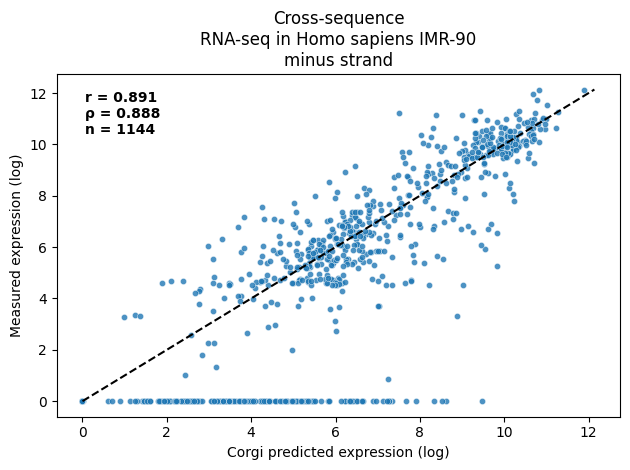

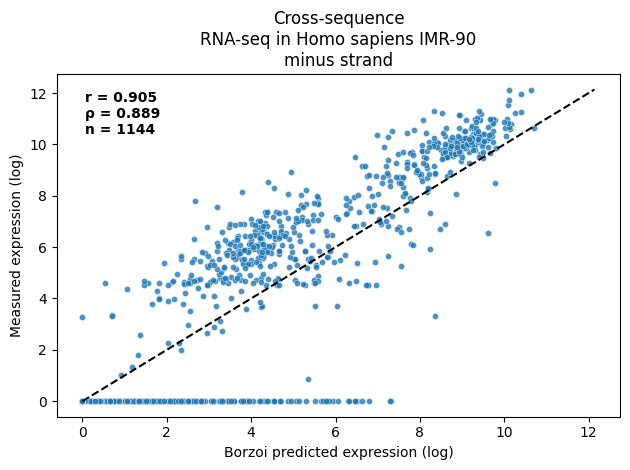

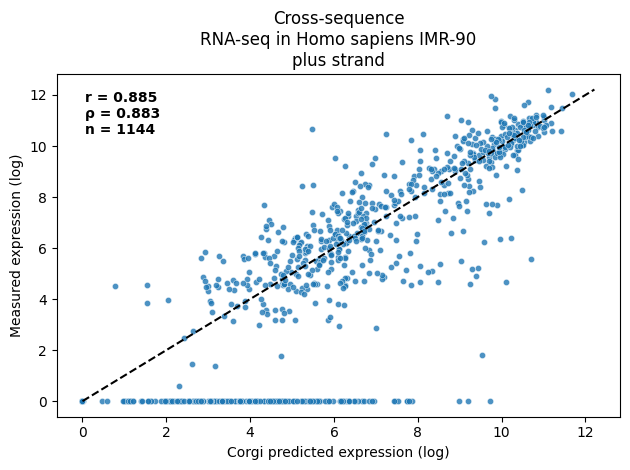

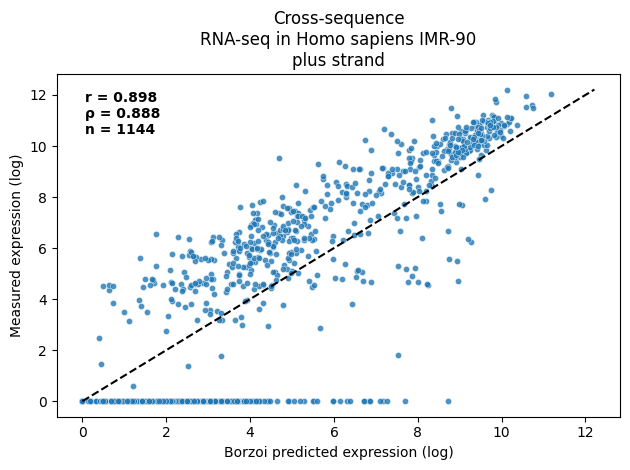

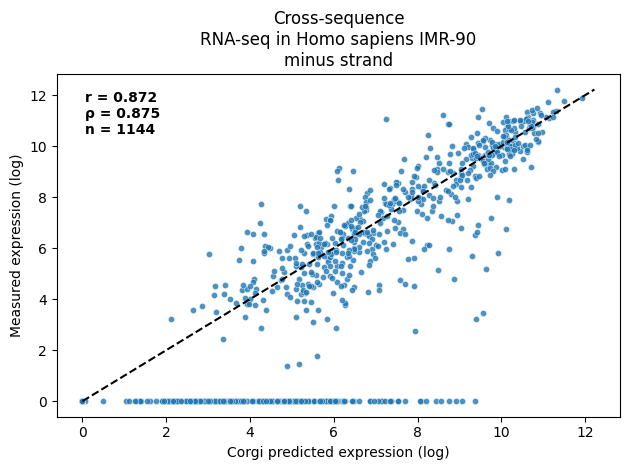

...

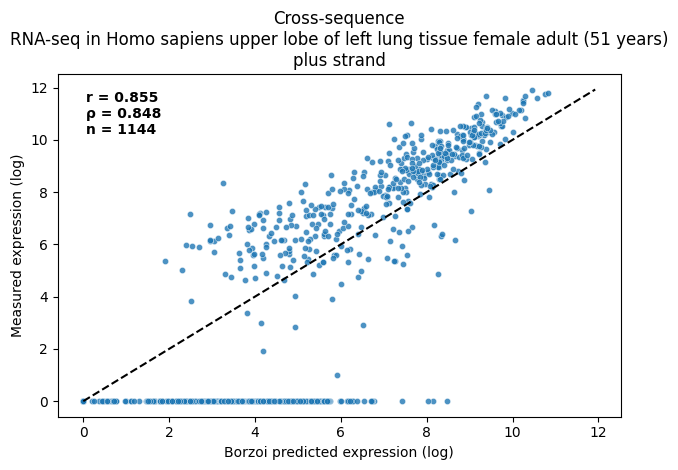

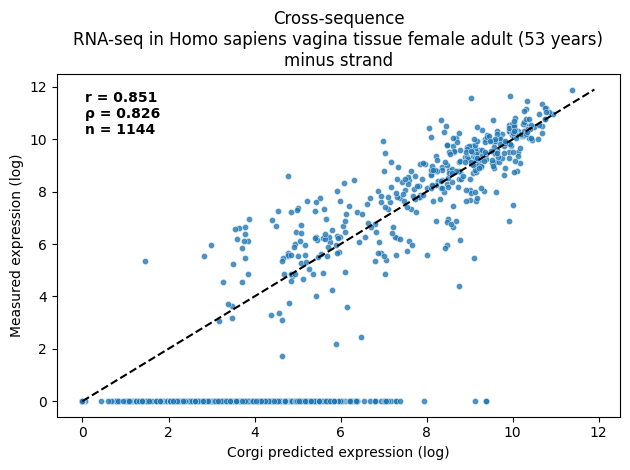

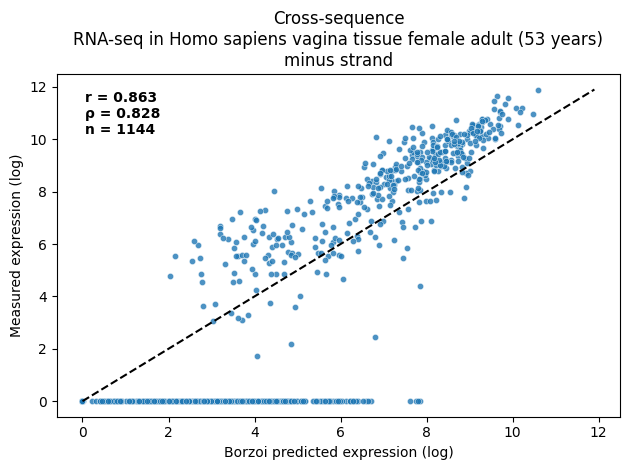

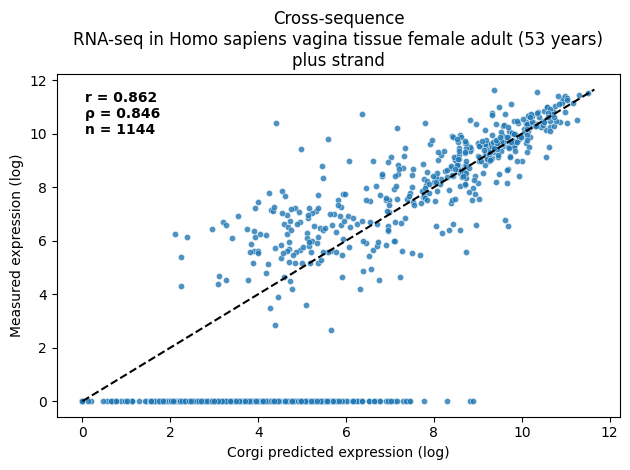

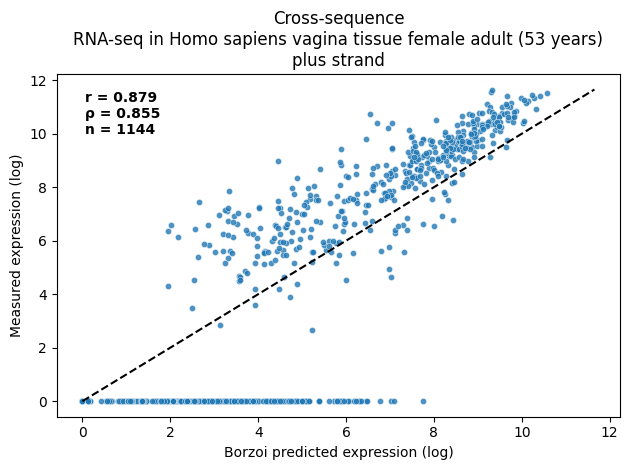

In [246]:
cors_grt_spearman = []
cors_borzoi_spearman = []
for col in range(encode.shape[1]):
    sample_idx = int(encode.columns[col].split('_')[0])
    strand = encode.columns[col].split('_')[3]
    y = encode.iloc[:, col]
    x = grt.iloc[:, col]
    r, _ = pearsonr(x, y)
    spr, _ = spearmanr(x, y)
    n = len(x)
    
    cors_grt_spearman.append(spr)
    sns.scatterplot(x=x, y=y, s=20, alpha=0.8)
    min_val = min(x.min(), y.min())
    max_val = max(x.max(), y.max())
    plt.plot([min_val, max_val], [min_val, max_val], linestyle='--', color='black')
    plt.text(
        0.05, 0.95,
        f"r = {r:.3f}\nρ = {spr:.3f}\nn = {n}",
        transform=plt.gca().transAxes,
        fontsize=10,
        weight='bold',
        verticalalignment='top'
    )
    plt.xlabel('Corgi predicted expression (log)')
    plt.ylabel('Measured expression (log)')
    plt.title(f"Cross-sequence\nRNA-seq in {cells.loc[sample_idx, 'tissue_name']}\n{strand} strand")
    plt.tight_layout()
    plt.show()

    # Borzoi
    y = encode.iloc[:, col]
    x = borzoi.iloc[:, col]
    r, _ = pearsonr(x, y)
    spr, _ = spearmanr(x, y)
    n = len(x)
    
    cors_borzoi_spearman.append(spr)
    sns.scatterplot(x=x, y=y, s=20, alpha=0.8)
    min_val = min(x.min(), y.min())
    max_val = max(x.max(), y.max())
    plt.plot([min_val, max_val], [min_val, max_val], linestyle='--', color='black')
    plt.text(
        0.05, 0.95,
        f"r = {r:.3f}\nρ = {spr:.3f}\nn = {n}",
        transform=plt.gca().transAxes,
        fontsize=10,
        weight='bold',
        verticalalignment='top'
    )
    plt.xlabel('Borzoi predicted expression (log)')
    plt.ylabel('Measured expression (log)')
    plt.title(f"Cross-sequence\nRNA-seq in {cells.loc[sample_idx, 'tissue_name']}\n{strand} strand")
    plt.tight_layout()
    plt.show()

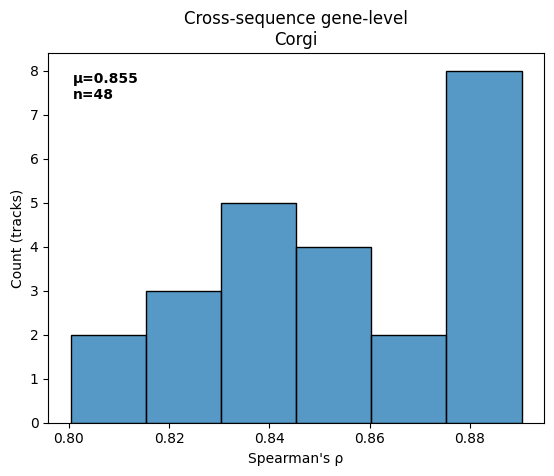

In [242]:
mu = np.mean(cors_grt_spearman)
sns.histplot(cors_grt_spearman)
plt.text(
    0.05, 0.95,
    f'μ={round(mu, 3)}\nn={len(cors)}',
    transform=plt.gca().transAxes,
    fontsize=10,
    weight='bold',
    verticalalignment='top')
plt.title("Cross-sequence gene-level\nCorgi")
plt.xlabel("Spearman's ρ")
plt.ylabel("Count (tracks)")
plt.show()

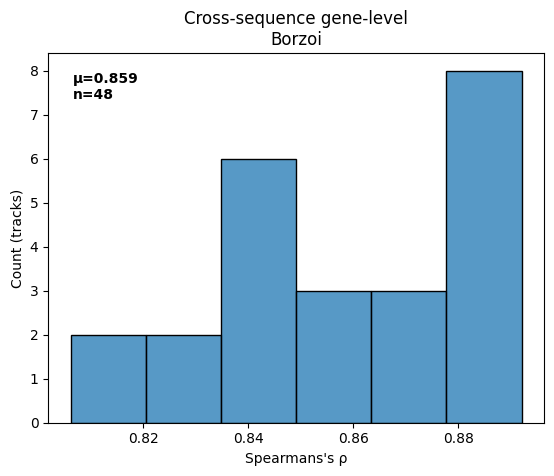

In [247]:
mu = np.mean(cors_borzoi_spearman)
sns.histplot(cors_borzoi_spearman)
plt.text(
    0.05, 0.95,
    f'μ={round(mu, 3)}\nn={len(cors)}',
    transform=plt.gca().transAxes,
    fontsize=10,
    weight='bold',
    verticalalignment='top')
plt.title("Cross-sequence gene-level\nBorzoi")
plt.xlabel("Spearmans's ρ")
plt.ylabel("Count (tracks)")
plt.show()

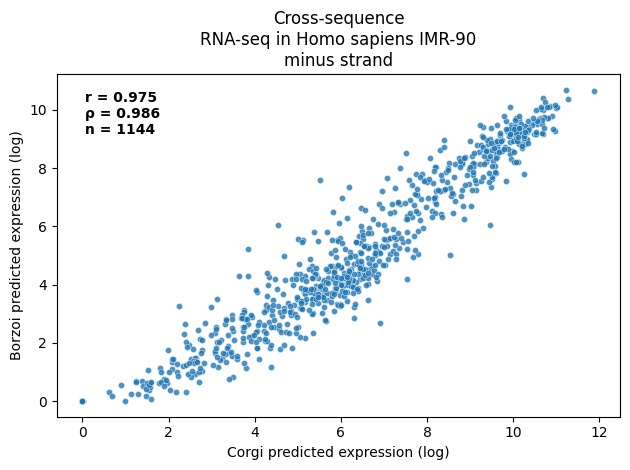

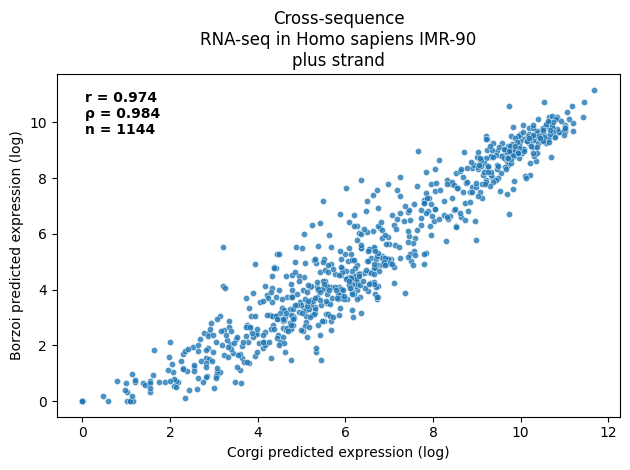

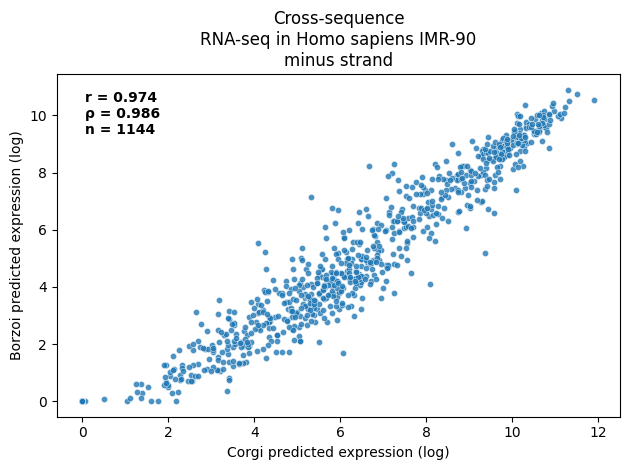

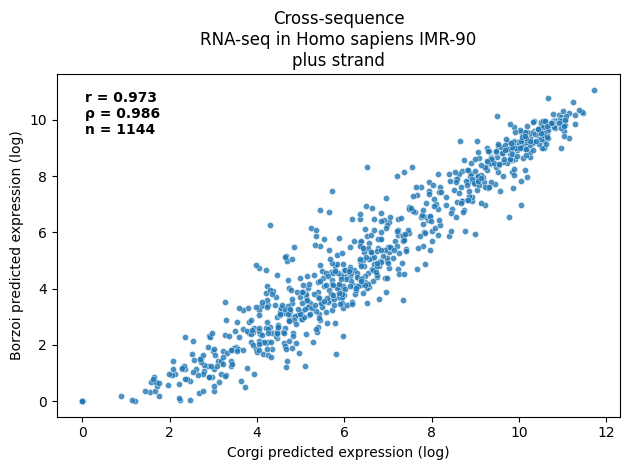

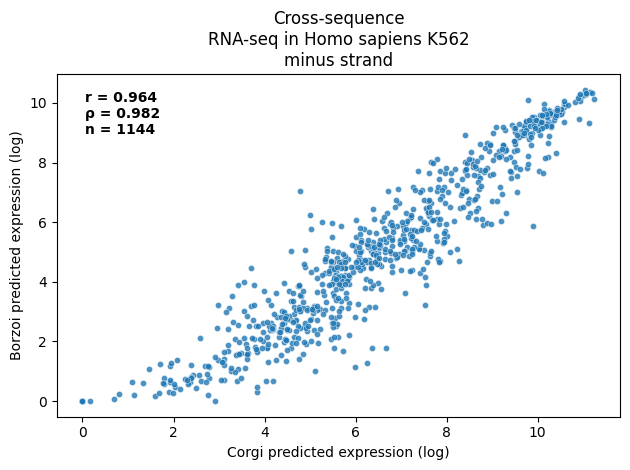

...

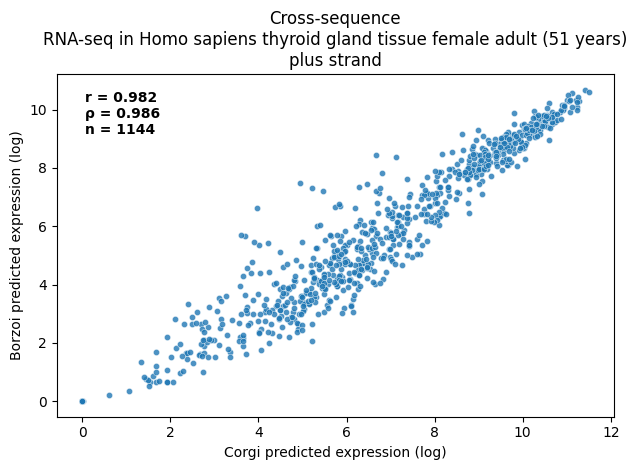

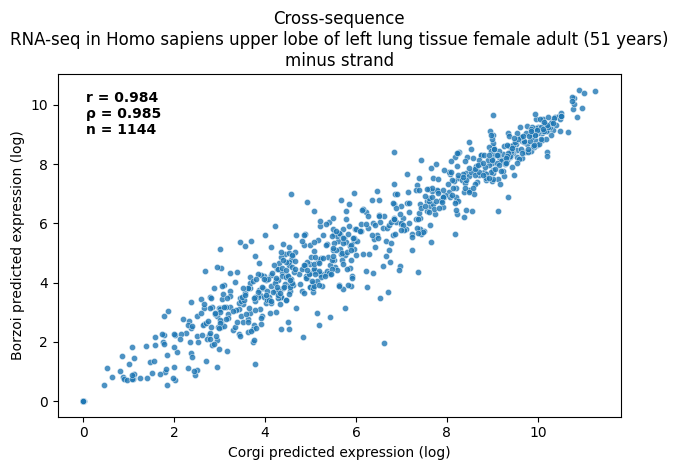

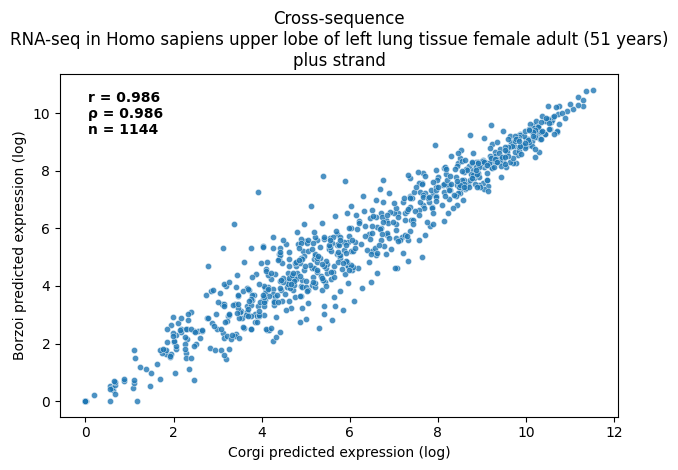

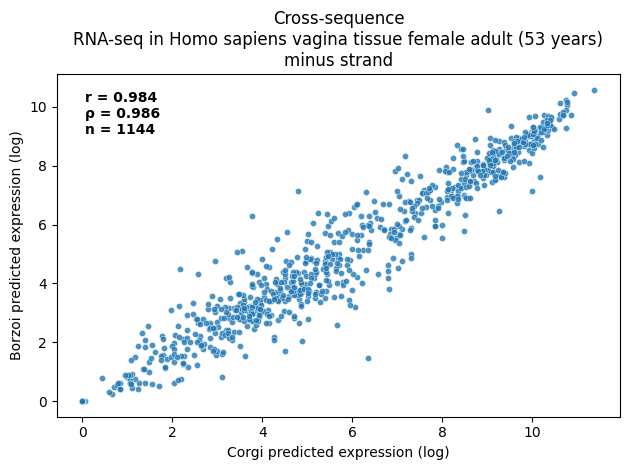

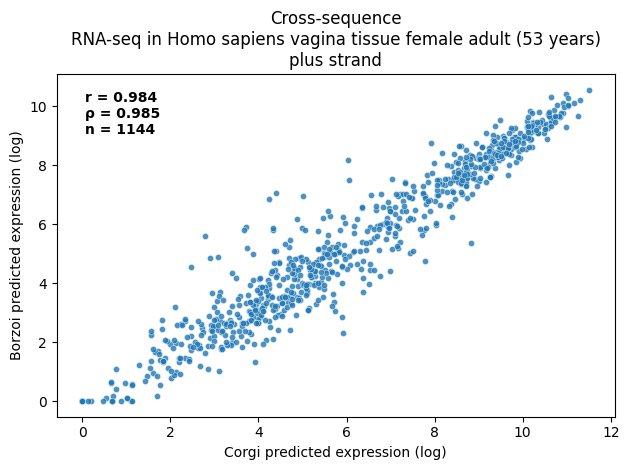

In [249]:
for col in range(encode.shape[1]):
    sample_idx = int(encode.columns[col].split('_')[0])
    strand = encode.columns[col].split('_')[3]
    y = borzoi.iloc[:, col]
    x = grt.iloc[:, col]
    r, _ = pearsonr(x, y)
    spr, _ = spearmanr(x, y)
    n = len(x)
    
    sns.scatterplot(x=x, y=y, s=20, alpha=0.8)
    #min_val = min(x.min(), y.min())
    #max_val = max(x.max(), y.max())
    #plt.plot([min_val, max_val], [min_val, max_val], linestyle='--', color='black')
    plt.text(
        0.05, 0.95,
        f"r = {r:.3f}\nρ = {spr:.3f}\nn = {n}",
        transform=plt.gca().transAxes,
        fontsize=10,
        weight='bold',
        verticalalignment='top'
    )
    plt.xlabel('Corgi predicted expression (log)')
    plt.ylabel('Borzoi predicted expression (log)')
    plt.title(f"Cross-sequence\nRNA-seq in {cells.loc[sample_idx, 'tissue_name']}\n{strand} strand")
    plt.tight_layout()
    plt.show()


In [262]:
borzoi_plus = borzoi.loc[:, borzoi.columns.str.contains('plus')]
grt_plus = grt.loc[:, grt.columns.str.contains('plus')]
encode_plus = encode.loc[:, encode.columns.str.contains('plus')]

In [276]:
grt_ms

,57_rna_polya_plus_grt,57_rna_total_plus_grt,59_rna_polya_plus_grt,59_rna_total_plus_grt,79_rna_polya_plus_grt,145_rna_total_plus_grt,176_rna_total_plus_grt,297_rna_total_plus_grt,325_rna_total_plus_grt,329_rna_total_plus_grt,346_rna_total_plus_grt,355_rna_total_plus_grt
name,,,,,,,,,,,,
AAK1,0.090667,0.352667,-0.131333,0.048667,0.383667,-0.577333,-0.623333,-0.070333,-0.148333,0.987667,-0.175333,-0.137333
ABCA1,0.040083,0.398083,0.413083,0.631083,0.257083,-0.290917,-1.070917,0.370083,0.129083,0.500083,-0.816917,-0.559917
ABCC4,0.404000,0.439000,0.284000,0.473000,0.729000,-0.351000,-0.446000,-0.429000,-0.329000,0.607000,-0.314000,-1.067000
ABHD11,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ABITRAM,0.331417,0.220417,0.519417,0.394417,0.483417,-0.104583,0.032417,-0.231583,-0.412583,-0.062583,-0.786583,-0.383583
...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF395,0.703917,0.382917,0.590917,0.867917,0.744917,-0.435083,-1.151083,-0.110083,-0.545083,-0.003083,-0.176083,-0.870083
ZNF618,0.361500,0.169500,-0.782500,-0.737500,0.448500,-0.420500,0.042500,0.410500,0.223500,0.251500,0.189500,-0.156500
ZNF703,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [267]:
borzoi_ms = borzoi_plus.sub(borzoi_plus.mean(axis=1), axis=0)
grt_ms = grt_plus.sub(grt_plus.mean(axis=1), axis=0)
encode_ms = encode_plus.sub(encode_plus.mean(axis=1), axis=0)

In [268]:
cors_grt_ms = []
cors_borzoi_ms = []
for col in range(encode_ms.shape[1]):
    sample_idx = int(encode_ms.columns[col].split('_')[0])
    strand = encode_ms.columns[col].split('_')[3]
    y = encode_ms.iloc[:, col]
    x = grt_ms.iloc[:, col]
    r, _ = pearsonr(x, y)
    spr, _ = spearmanr(x, y)
    n = len(x)
    
    cors_grt_ms.append(spr)

    # Borzoi
    y = encode_ms.iloc[:, col]
    x = borzoi_ms.iloc[:, col]
    r, _ = pearsonr(x, y)
    spr, _ = spearmanr(x, y)
    n = len(x)
    
    cors_borzoi_ms.append(spr)

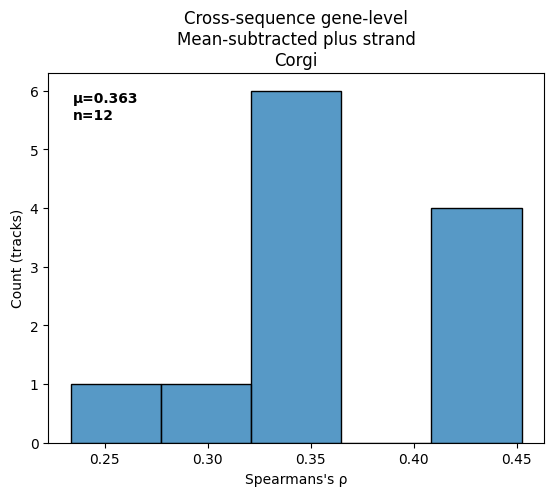

In [279]:
mu = np.mean(cors_grt_ms)
sns.histplot(cors_grt_ms)
plt.text(
    0.05, 0.95,
    f'μ={round(mu, 3)}\nn={len(cors_grt_ms)}',
    transform=plt.gca().transAxes,
    fontsize=10,
    weight='bold',
    verticalalignment='top')
plt.title("Cross-sequence gene-level\nMean-subtracted plus strand\nCorgi")
plt.xlabel("Spearmans's ρ")
plt.ylabel("Count (tracks)")
plt.show()

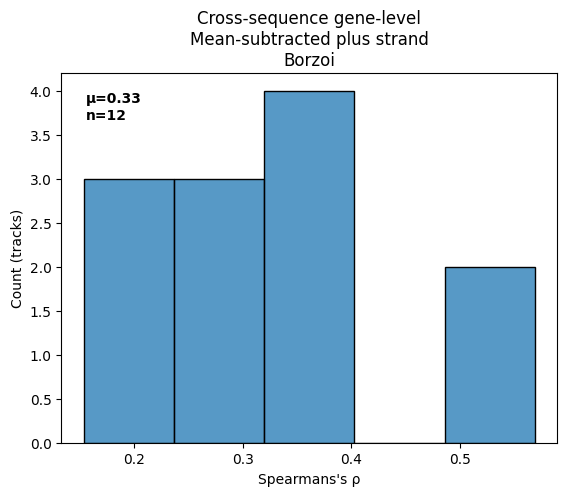

In [280]:
mu = np.mean(cors_borzoi_ms)
sns.histplot(cors_borzoi_ms)
plt.text(
    0.05, 0.95,
    f'μ={round(mu, 3)}\nn={len(cors_borzoi_ms)}',
    transform=plt.gca().transAxes,
    fontsize=10,
    weight='bold',
    verticalalignment='top')
plt.title("Cross-sequence gene-level\nMean-subtracted plus strand\nBorzoi")
plt.xlabel("Spearmans's ρ")
plt.ylabel("Count (tracks)")
plt.show()